# Data Acquisition

## Call FRED API 

In [120]:
import pandas as pd
import pandas_datareader.data as web
import quandl
from datetime import datetime

series_list = ['SP500', 'NASDAQCOM', 'DJIA', 'RU2000PR',
              'BOGMBASEW', 'DEXJPUS', 'DEXUSEU', 'DEXCHUS', 'DEXUSAL',
              'VIXCLS',
              'USDONTD156N', 'USD1MTD156N', 'USD3MTD156N', 'USD12MD156N',
              'BAMLHYH0A0HYM2TRIV', 'BAMLCC0A1AAATRIV',
              'GOLDAMGBD228NLBM', 'DCOILWTICO']
start = datetime(2010, 1, 1)
end = datetime.now()

def get_fred_data(series_list, start, end):
    fred_df = pd.DataFrame()
    for i, series in enumerate(series_list):
        print('Calling FRED API for Series:  {}'.format(series))
        if i == 0:
            fred_df = web.get_data_fred(series, start, end)
        else:
            _df = web.get_data_fred(series, start, end)
            fred_df = fred_df.join(_df, how='outer')
    return fred_df

econ_df = get_fred_data(series_list, start, end)
econ_df.head()

Calling FRED API for Series:  SP500


SSLError: HTTPSConnectionPool(host='fred.stlouisfed.org', port=443): Max retries exceeded with url: /graph/fredgraph.csv?id=SP500 (Caused by SSLError(SSLError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed (_ssl.c:719)'),))

In [123]:
def generate_calendar(year, drop_index=False):
    '''
    Simple function to generate a calendar containing
    US holidays, weekdays and  holiday weeks.
    '''
    from pandas.tseries.offsets import YearEnd
    from pandas.tseries.holiday import USFederalHolidayCalendar
    
    start_date = pd.to_datetime('1/1/'+str(year))
    end_date = start_date + YearEnd()
    DAT = pd.date_range(str(start_date), str(end_date), freq='D')
    MO = [d.strftime('%B') for d in DAT]
    holidays = USFederalHolidayCalendar().holidays(start=start_date, end=end_date)

    cal_df = pd.DataFrame({'date':DAT, 'month':MO})
    cal_df['year'] = [format(d, '%Y') for d in DAT]
    cal_df['weekday'] = [format(d, '%A') for d in DAT]
    cal_df['is_weekday'] = cal_df.weekday.isin(['Monday','Tuesday','Wednesday','Thursday','Friday'])
    cal_df['is_weekday'] = cal_df['is_weekday'].astype(int)
    cal_df['is_holiday'] = cal_df['date'].isin(holidays)
    cal_df['is_holiday'] = cal_df['is_holiday'].astype(int)
    cal_df['is_holiday_week'] = cal_df.is_holiday.rolling(window=7,center=True,min_periods=1).sum()
    cal_df['is_holiday_week'] = cal_df['is_holiday_week'].astype(int)
    
    if not drop_index: cal_df.set_index('date', inplace=True)
    
    return cal_df

def make_calendars(year_list, drop_index):
    cal_df = pd.DataFrame()
    for year in year_list:
        cal_df = cal_df.append(generate_calendar(year, drop_index=drop_index))
    return cal_df

year_list = [str(int(i)) for i in np.arange(2010, 2019)]
cal_df = make_calendars(year_list, drop_index=False)
cal_df.head()

,month,year,weekday,is_weekday,is_holiday,is_holiday_week
date,,,,,,
2010-01-01,January,2010,Friday,1,1,1
2010-01-02,January,2010,Saturday,0,0,1
2010-01-03,January,2010,Sunday,0,0,1
2010-01-04,January,2010,Monday,1,0,1
2010-01-05,January,2010,Tuesday,1,0,0


In [124]:
econ_df = econ_df.join(cal_df, how='outer')
econ_df = econ_df.fillna(method='bfill')
econ_df = econ_df.fillna(method='ffill')
econ_df.head()

ValueError: columns overlap but no suffix specified: Index(['is_weekday', 'is_holiday', 'is_holiday_week'], dtype='object')

In [83]:
# drop future records introduced from the calendar function
before_future = pd.to_datetime(econ_df.index.values) <= dt.now()
econ_df = econ_df.loc[before_future]

In [84]:
# acquire one-hot encodings
econ_df = pd.get_dummies(econ_df, 
                         columns=['month', 'year', 'weekday'],
                         drop_first=True)

In [85]:
econ_df.shape

(3046, 46)

In [86]:
econ_df.columns = [str.lower(s) for s in econ_df.columns]
print(econ_df.columns.tolist())

['sp500', 'nasdaqcom', 'djia', 'ru2000pr', 'bogmbasew', 'dexjpus', 'dexuseu', 'dexchus', 'dexusal', 'vixcls', 'usdontd156n', 'usd1mtd156n', 'usd3mtd156n', 'usd12md156n', 'bamlhyh0a0hym2triv', 'bamlcc0a1aaatriv', 'goldamgbd228nlbm', 'dcoilwtico', 'is_weekday', 'is_holiday', 'is_holiday_week', 'month_august', 'month_december', 'month_february', 'month_january', 'month_july', 'month_june', 'month_march', 'month_may', 'month_november', 'month_october', 'month_september', 'year_2011', 'year_2012', 'year_2013', 'year_2014', 'year_2015', 'year_2016', 'year_2017', 'year_2018', 'weekday_monday', 'weekday_saturday', 'weekday_sunday', 'weekday_thursday', 'weekday_tuesday', 'weekday_wednesday']


In [87]:
# Save original data to a dictionary
data = dict()
data['original'] = econ_df

### Acquire Rolling Averages to Reduce Noise

In [88]:
econ_df_melt = econ_df.copy()
econ_df_melt.reset_index(inplace=True)
econ_df_melt.rename(columns={'index': 'date'}, inplace=True)
econ_df_melt = econ_df_melt.melt('date')
econ_df_melt.head()

,date,variable,value
0,2010-01-01,sp500,1132.99
1,2010-01-02,sp500,1132.99
2,2010-01-03,sp500,1132.99
3,2010-01-04,sp500,1132.99
4,2010-01-05,sp500,1136.52


In [89]:
onehot_cols = ['is_weekday', 'is_holiday', 'is_holiday_week', 
               'month_august', 'month_december', 
               'month_february', 'month_january', 'month_july', 
               'month_june', 'month_march', 
               'month_may', 'month_november', 'month_october', 
               'month_september', 'year_2011', 
               'year_2012', 'year_2013', 'year_2014', 'year_2015', 
               'year_2016', 'year_2017', 
               'year_2018', 'weekday_monday', 'weekday_saturday', 
               'weekday_sunday', 'weekday_thursday', 
               'weekday_tuesday', 'weekday_wednesday']

window = 15 #rolling avg
smooth_df = pd.DataFrame()
for name, df in econ_df_melt.groupby('variable'):
    if name not in onehot_cols:
        colname = 'rolling_'+str(window)+'_mean'
        df[colname] = df['value'].rolling(window=window).mean()
    else:
        df[colname] = df['value']
    smooth_df = smooth_df.append(df)
smooth_df = smooth_df.pivot(index='date', 
                            columns='variable', 
                            values=colname)
smooth_df.dropna(inplace=True)
    
smooth_df.head()

C:\Users\paulm\Anaconda3\lib\site-packages\ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Users\paulm\Anaconda3\lib\site-packages\ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


variable,bamlcc0a1aaatriv,bamlhyh0a0hym2triv,bogmbasew,dcoilwtico,dexchus,dexjpus,dexusal,dexuseu,djia,goldamgbd228nlbm,...,weekday_tuesday,weekday_wednesday,year_2011,year_2012,year_2013,year_2014,year_2015,year_2016,year_2017,year_2018
date,,,,,,,,,,,,,,,,,,,,,
2010-01-15,447.268000,695.544000,1.961540e+06,81.444000,6.827073,92.004667,0.920947,1.4442,10621.786000,1132.250000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2010-01-16,447.652667,696.446000,1.965507e+06,81.274667,6.827040,91.910000,0.921607,1.4432,10631.217333,1133.766667,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2010-01-17,448.037333,697.348000,1.969474e+06,81.105333,6.827007,91.815333,0.922267,1.4422,10640.648667,1135.283333,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2010-01-18,448.422000,698.250000,1.973441e+06,80.936000,6.826973,91.720667,0.922927,1.4412,10650.080000,1136.800000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2010-01-19,448.729333,699.090667,1.977407e+06,80.766667,6.826940,91.626000,0.923587,1.4402,10659.511333,1138.200000,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Predicting Price of Oil 

In [90]:
# specify y column name
y_col = 'dcoilwtico'

# map the values to the corresponding dates 
# in the moving averages dataset
y_dict = econ_df[y_col].to_dict()
smooth_df[y_col] = smooth_df.index.values
smooth_df[y_col] = smooth_df[y_col].map(y_dict)

# shift back -window so we are predicting +window in future
smooth_df[y_col] = smooth_df[y_col].shift(-window)
smooth_df.dropna(inplace=True)

# write to disk 
fname = './data/smooth_df_'+str(window)+'_mean.csv'
smooth_df.to_csv(fname)
data['smooth_df'] = smooth_df
smooth_df.head()

variable,bamlcc0a1aaatriv,bamlhyh0a0hym2triv,bogmbasew,dcoilwtico,dexchus,dexjpus,dexusal,dexuseu,djia,goldamgbd228nlbm,...,weekday_tuesday,weekday_wednesday,year_2011,year_2012,year_2013,year_2014,year_2015,year_2016,year_2017,year_2018
date,,,,,,,,,,,,,,,,,,,,,
2010-01-15,447.268000,695.544000,1.961540e+06,74.41,6.827073,92.004667,0.920947,1.4442,10621.786000,1132.250000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2010-01-16,447.652667,696.446000,1.965507e+06,74.41,6.827040,91.910000,0.921607,1.4432,10631.217333,1133.766667,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2010-01-17,448.037333,697.348000,1.969474e+06,74.41,6.827007,91.815333,0.922267,1.4422,10640.648667,1135.283333,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2010-01-18,448.422000,698.250000,1.973441e+06,77.21,6.826973,91.720667,0.922927,1.4412,10650.080000,1136.800000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2010-01-19,448.729333,699.090667,1.977407e+06,76.96,6.826940,91.626000,0.923587,1.4402,10659.511333,1138.200000,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [95]:
# Prepocessrocess data
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

def split_scale(df, X_cols, y_col, norm_cols=None, train_size=.7):
    X = df[X_cols]
    Y = df[y_col]
    xtrain, xtest, ytrain, ytest = train_test_split(X, Y, train_size=train_size)
    std = StandardScaler()
    if norm_cols is not None:
        std.fit(xtrain[norm_cols])
        xtrain[norm_cols] = std.transform(xtrain[norm_cols])
        xtest[norm_cols] = std.transform(xtest[norm_cols])
    else:
        std.fit(xtrain)
        xtrain = std.transform(xtrain)
        xtest = std.transform(xtest)
        
    return xtrain, ytrain, xtest, ytest

X_cols = [col for col in smooth_df.columns if col != y_col]
X_train, y_train, X_test, y_test = split_scale(smooth_df, X_cols, y_col, 
                                               norm_cols=None, train_size=.7)

C:\Users\paulm\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2010: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


In [128]:
import numpy as np
import pandas as pd
import keras
import time # add decorator to time functions
from functools import wraps # add decorator to time functions
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline


def plot_loss(history_obj, width=16):
    '''
    Leans on Keras' history.history object to visualize fit of model.
    '''
    plt.clf()
    loss = history_obj['loss']
    val_loss = history_obj['val_loss']
    d_loss = np.subtract(loss, val_loss)
    epochs = range(1, len(loss)+1)
    sns.set_style("whitegrid")
    fig, ax = plt.subplots(figsize=(width, 6))
    ax.plot(epochs, loss, 'g', label='Training Loss', linestyle='--')
    ax.plot(epochs, val_loss, 'b', label='Validation Loss', linestyle='-.')
    ax.set_title('Training & Validation Loss')
    ax.set_xlabel('')
    ax.set_ylabel('Loss')
    ax.grid(alpha=0.3)
    ax.legend(loc='best')
    sns.despine()
    plt.suptitle('Training vs. Validation of Sequential Network Model Over Various Epochs')
    
    fig2, ax2 = plt.subplots(figsize=(width, 3))
    ax2.plot(epochs, d_loss, c='black', label='train_loss - val_loss')
    ax2.grid(alpha=0.3)
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('Loss Differential (Train-Val)')
    ax2.legend(loc='best')
    ax2.axhline(0, c='black', linestyle=':')
    ax2.set_title('Difference of Curves Above')

    sns.despine()
    plt.show()
    return None


                Fully Connected Model - model 1 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 1
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = -2.5853
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_411 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_412 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_271 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_413 (Dense)            (None, 1)                 5         
Total params: 209
Trainable params: 209
Non

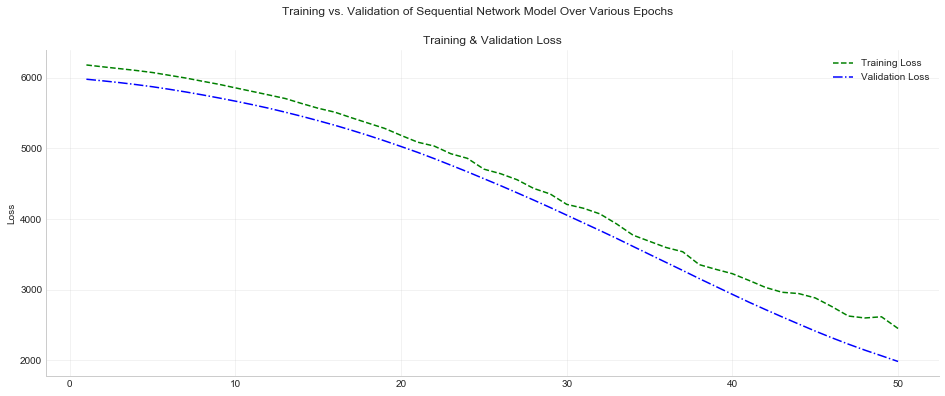

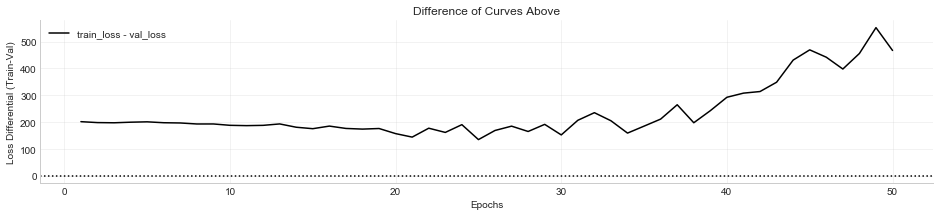


                Fully Connected Model - model 2 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 1
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = -4.6841
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_414 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_415 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_272 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_416 (Dense)            (None, 1)                 5         
Total params: 209
Trainable params: 209
Non

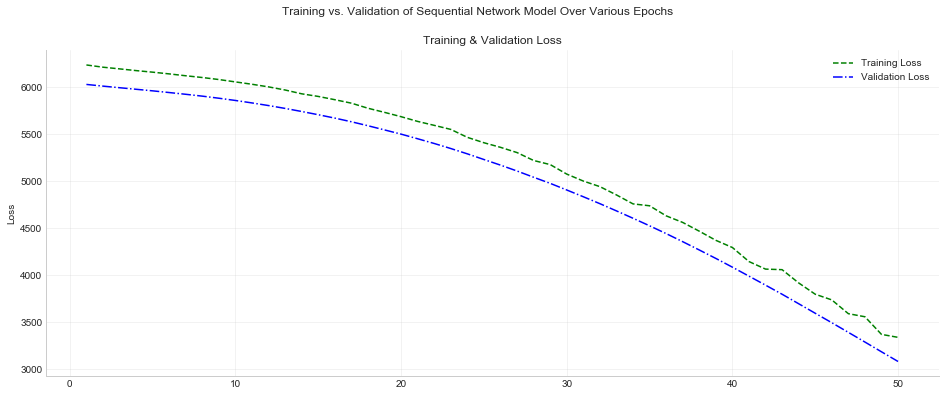

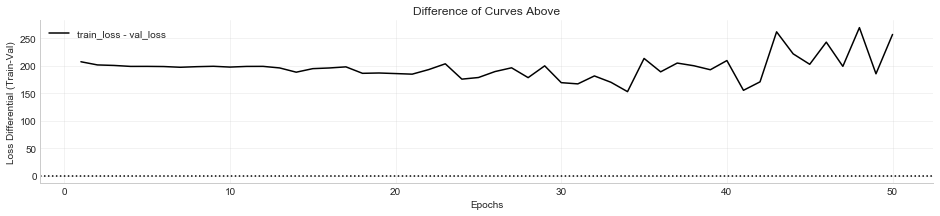


                Fully Connected Model - model 3 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 1
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = -9.8575
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_417 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_418 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_273 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_419 (Dense)            (None, 1)                 5         
Total params: 209
Trainable params: 209
Non

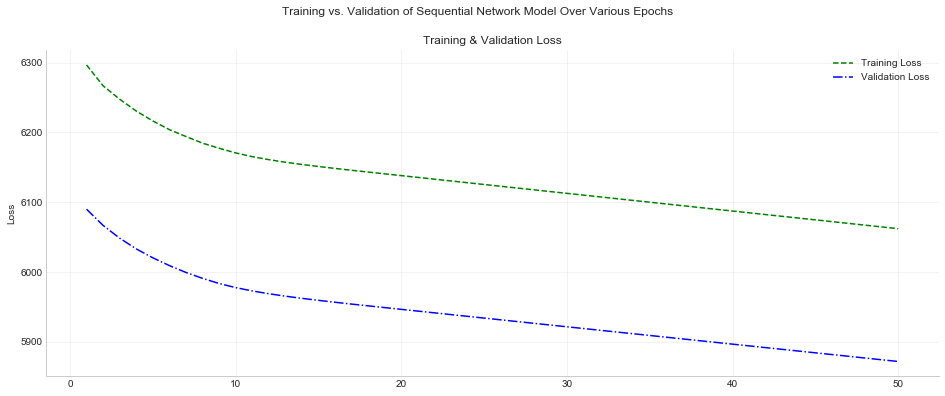

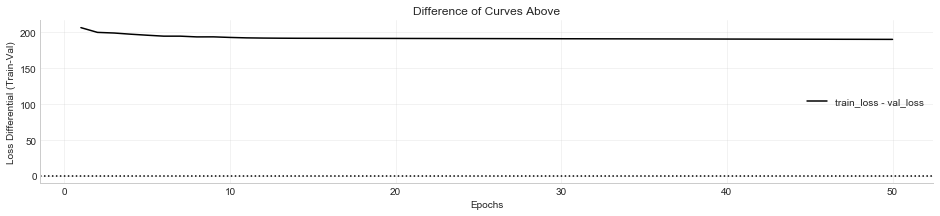


                Fully Connected Model - model 4 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 1
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.7140
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_420 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_421 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_274 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_422 (Dense)            (None, 1)                 5         
Total params: 209
Trainable params: 209
Non-

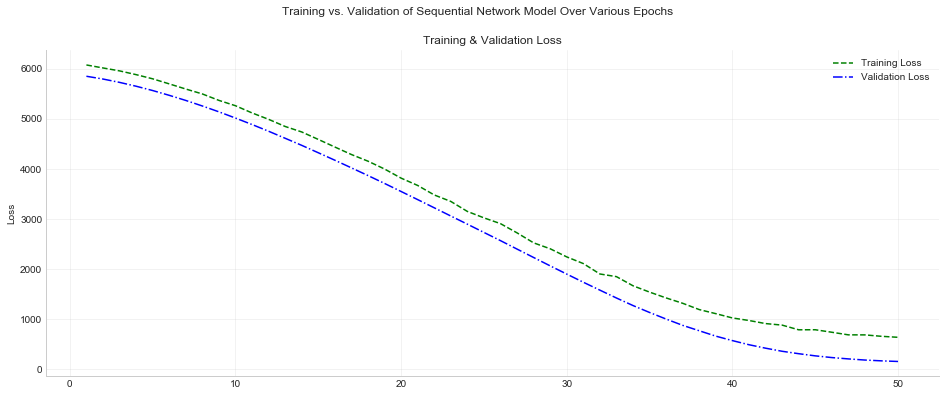

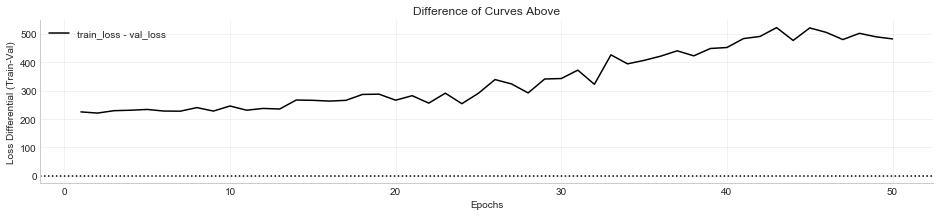


                Fully Connected Model - model 5 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 2
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.6835
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_423 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_424 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_275 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_425 (Dense)            (None, 4)                 20        
____________________________________________

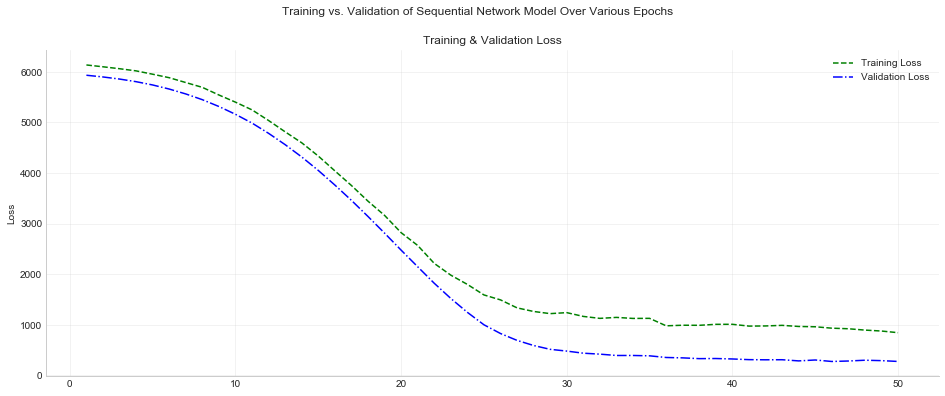

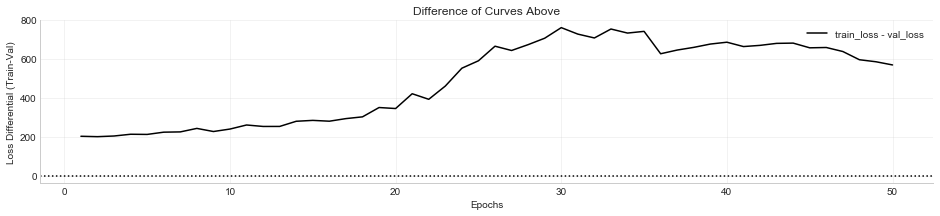


                Fully Connected Model - model 6 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 2
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.6780
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_427 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_428 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_277 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_429 (Dense)            (None, 4)                 20        
____________________________________________

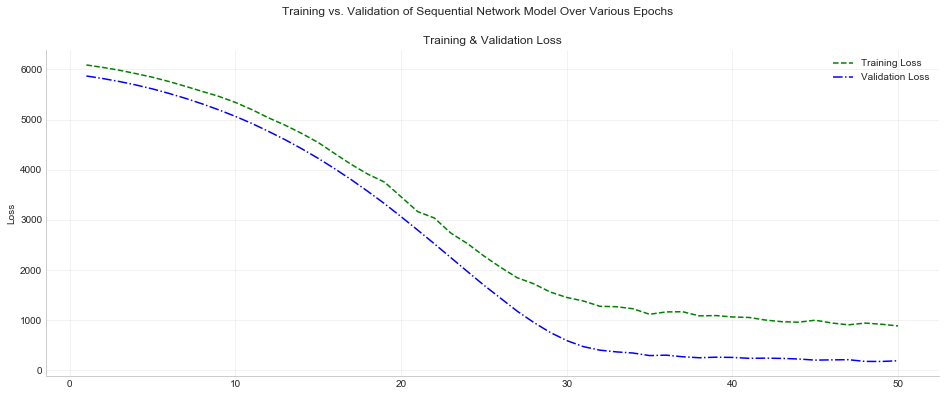

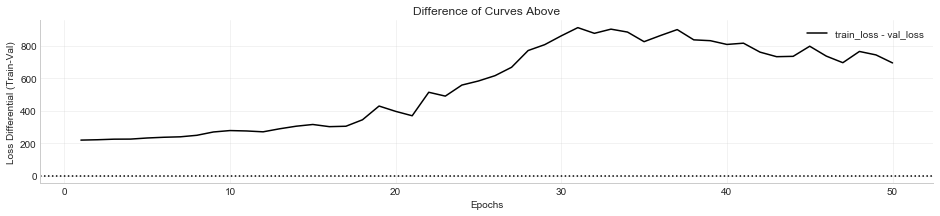


                Fully Connected Model - model 7 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 2
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.6639
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_431 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_432 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_279 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_433 (Dense)            (None, 4)                 20        
____________________________________________

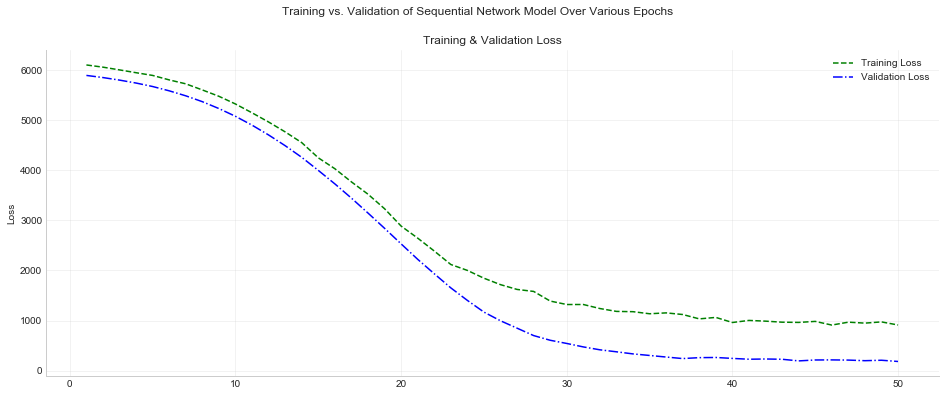

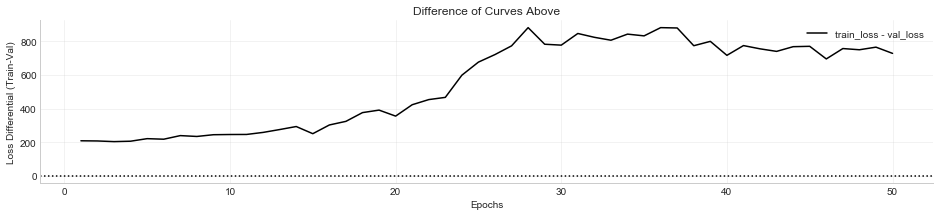


                Fully Connected Model - model 8 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 2
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.5196
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_435 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_436 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_281 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_437 (Dense)            (None, 4)                 20        
____________________________________________

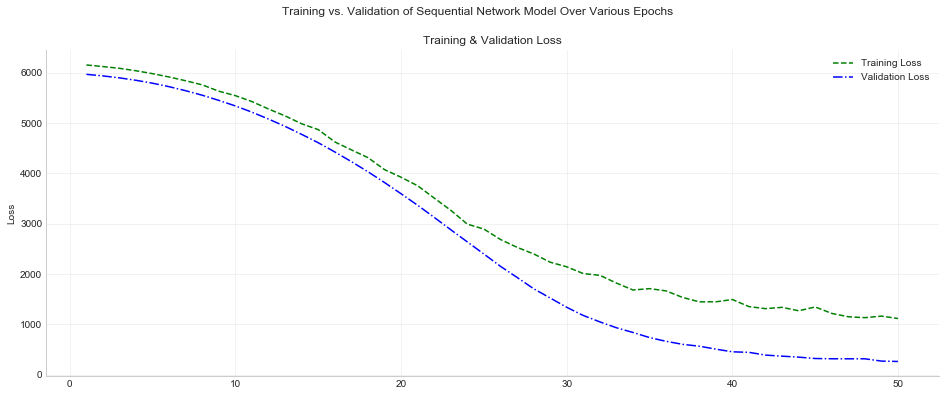

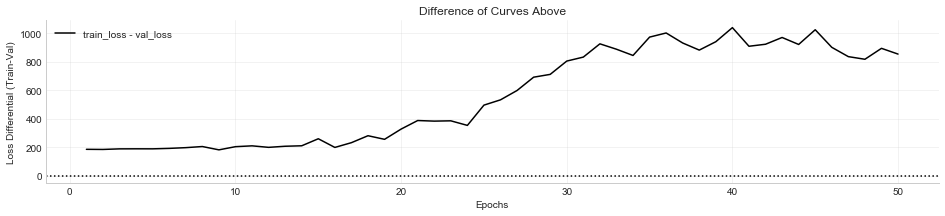


                Fully Connected Model - model 9 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 3
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.4051
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_439 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_440 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_283 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_441 (Dense)            (None, 4)                 20        
____________________________________________

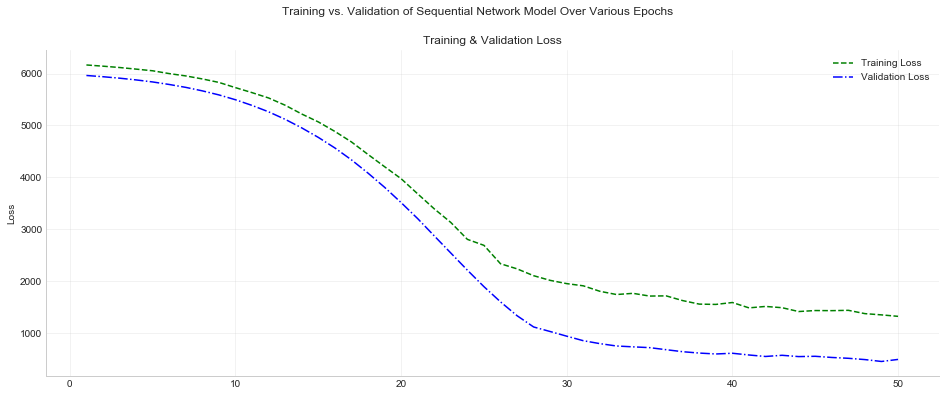

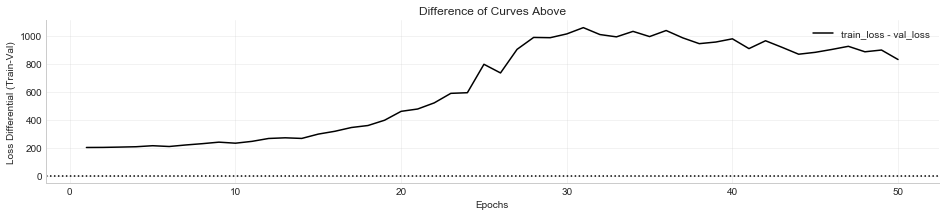


                Fully Connected Model - model 10 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 3
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.0252
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_444 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_445 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_286 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_446 (Dense)            (None, 4)                 20        
__________________________________________

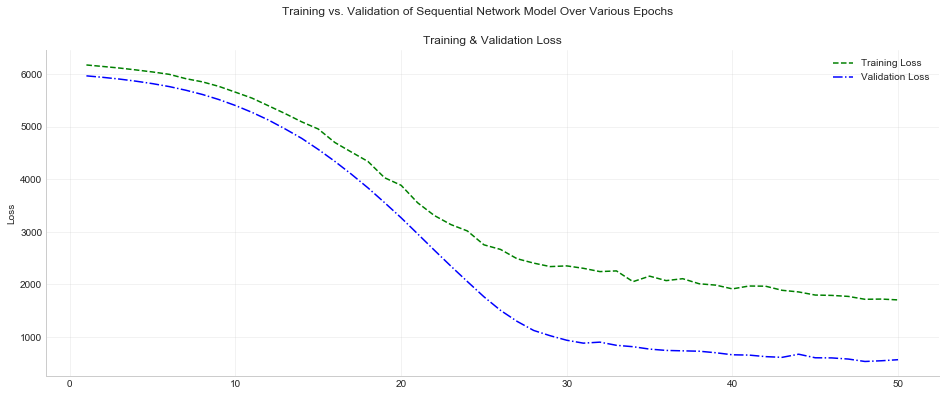

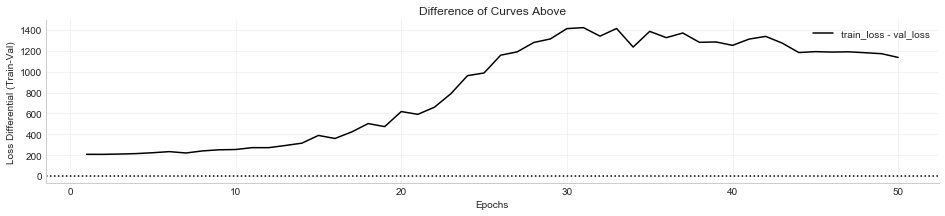


                Fully Connected Model - model 11 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 3
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.2461
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_449 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_450 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_289 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_451 (Dense)            (None, 4)                 20        
___________________________________________

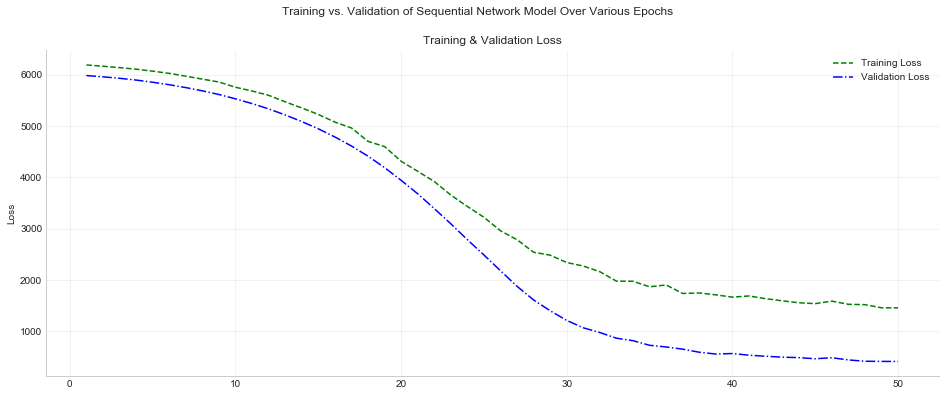

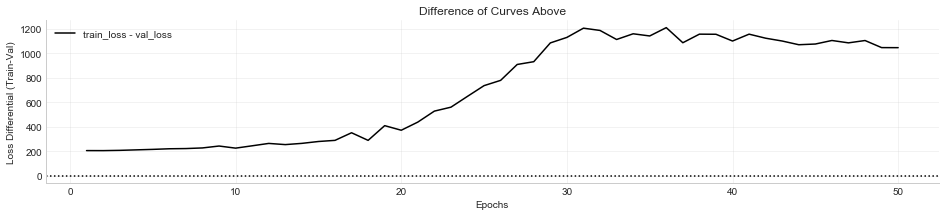


                Fully Connected Model - model 12 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 3
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.4367
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_454 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_455 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_292 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_456 (Dense)            (None, 4)                 20        
___________________________________________

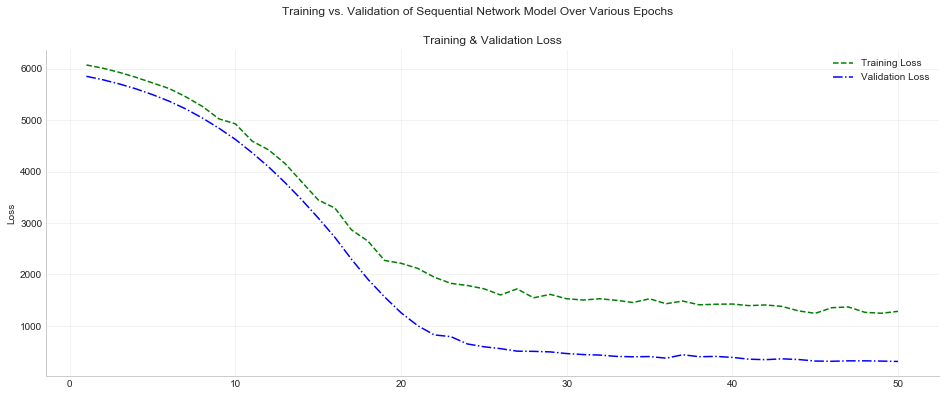

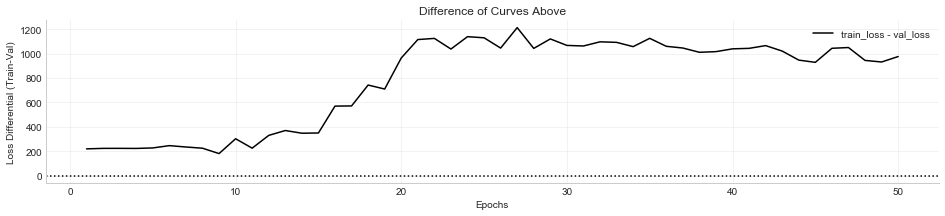


                Fully Connected Model - model 13 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 4
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.3237
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_459 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_460 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_295 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_461 (Dense)            (None, 4)                 20        
__________________________________________

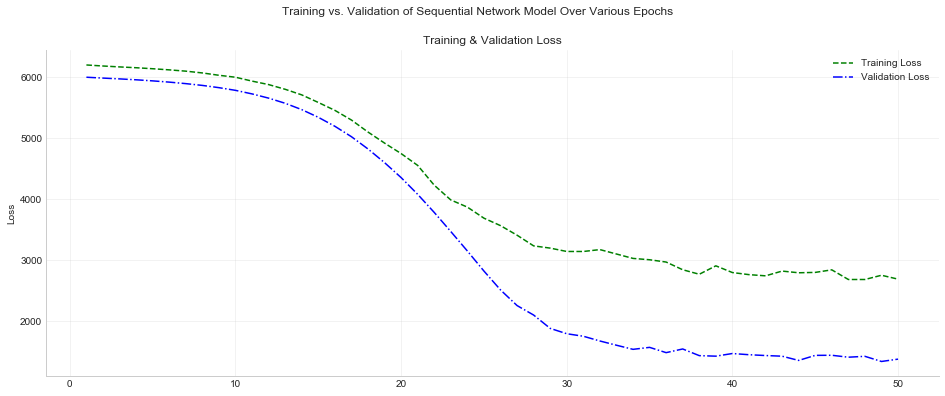

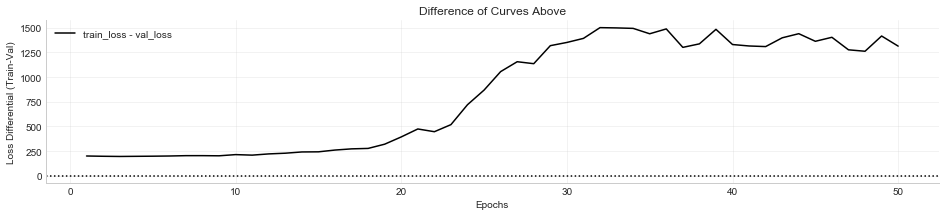


                Fully Connected Model - model 14 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 4
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.5615
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_465 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_466 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_299 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_467 (Dense)            (None, 4)                 20        
__________________________________________

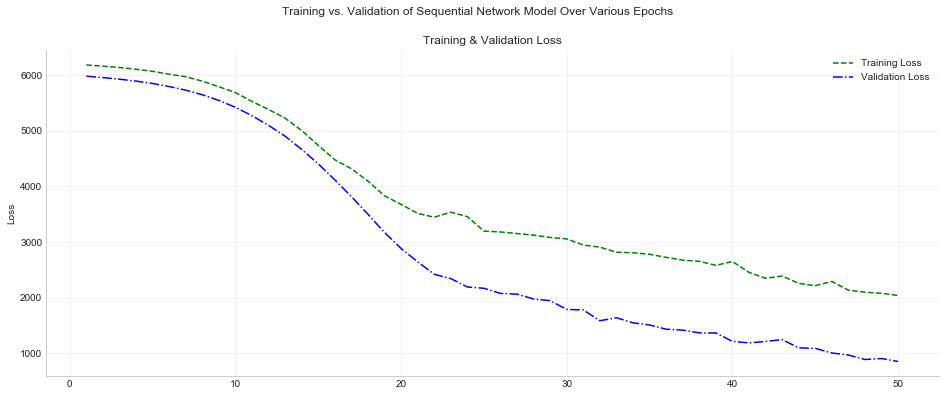

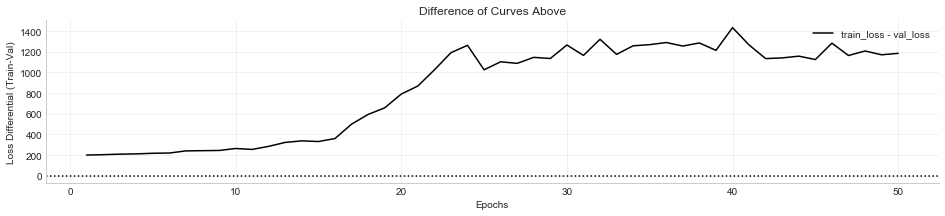


                Fully Connected Model - model 15 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 4
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.1281
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_471 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_472 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_303 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_473 (Dense)            (None, 4)                 20        
__________________________________________

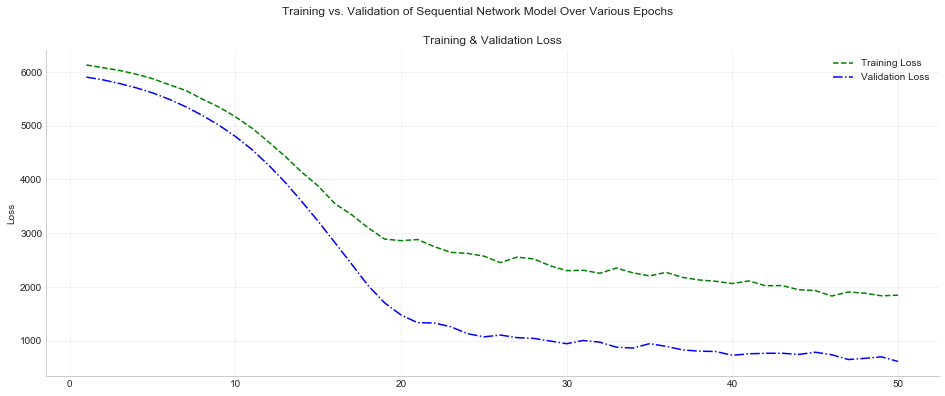

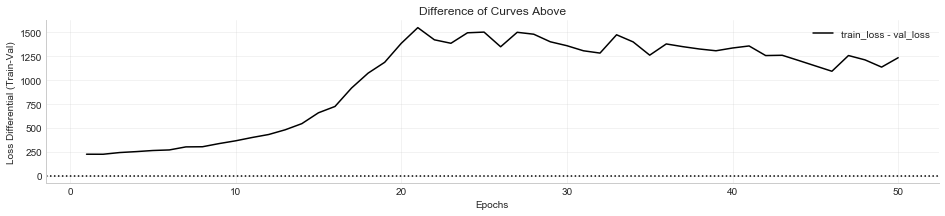


                Fully Connected Model - model 16 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 4
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.1281
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_477 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_478 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_307 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_479 (Dense)            (None, 4)                 20        
__________________________________________

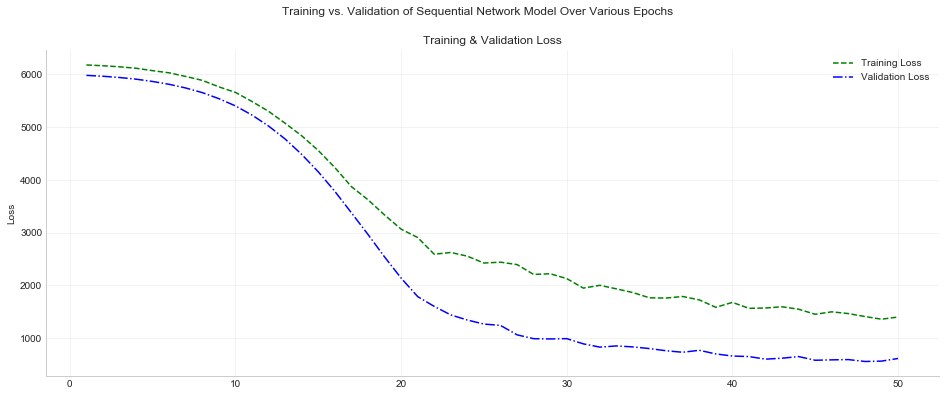

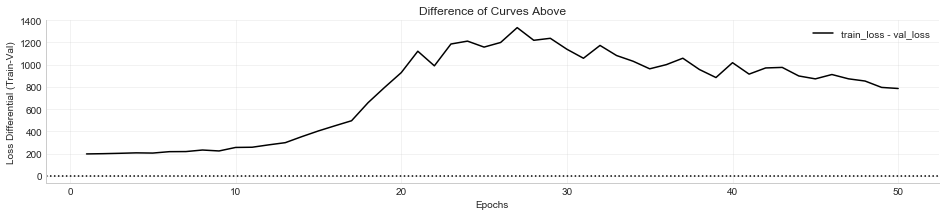


                Fully Connected Model - model 17 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 5
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.6327
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_483 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_484 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_311 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_485 (Dense)            (None, 4)                 20        
__________________________________________

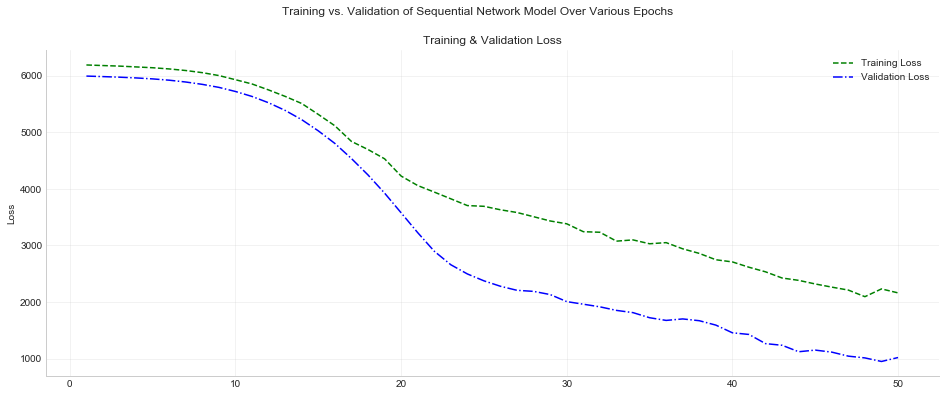

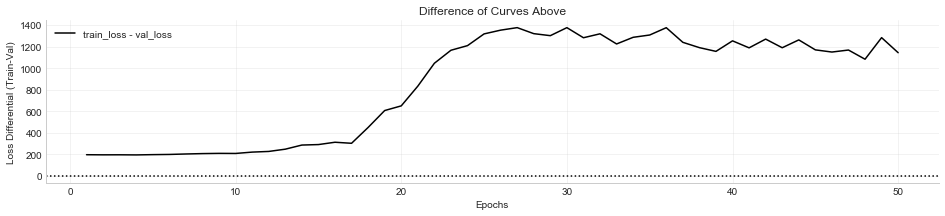


                Fully Connected Model - model 18 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 5
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.1194
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_490 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_491 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_316 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_492 (Dense)            (None, 4)                 20        
__________________________________________

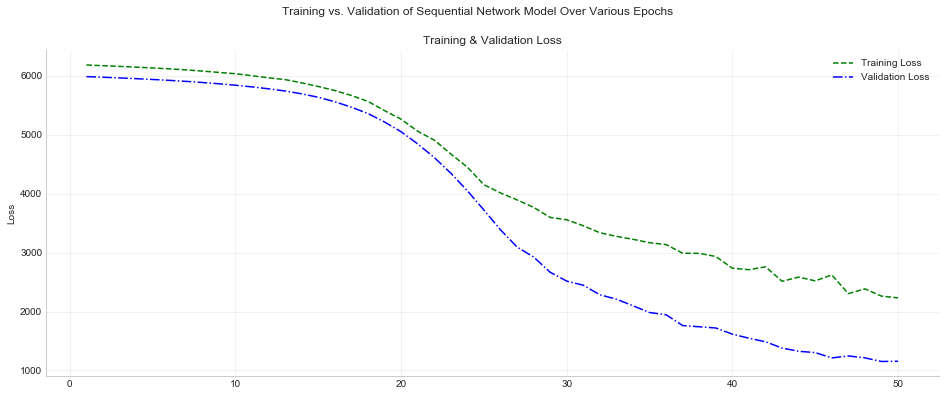

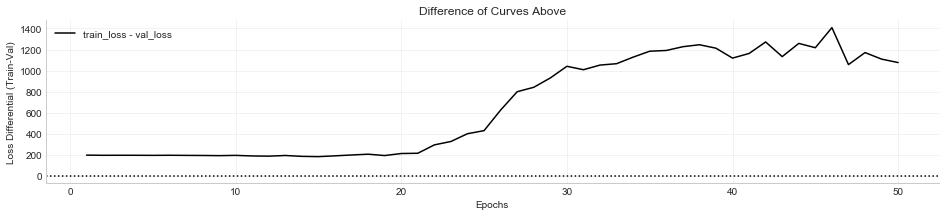


                Fully Connected Model - model 19 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 5
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.4320
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_497 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_498 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_321 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_499 (Dense)            (None, 4)                 20        
__________________________________________

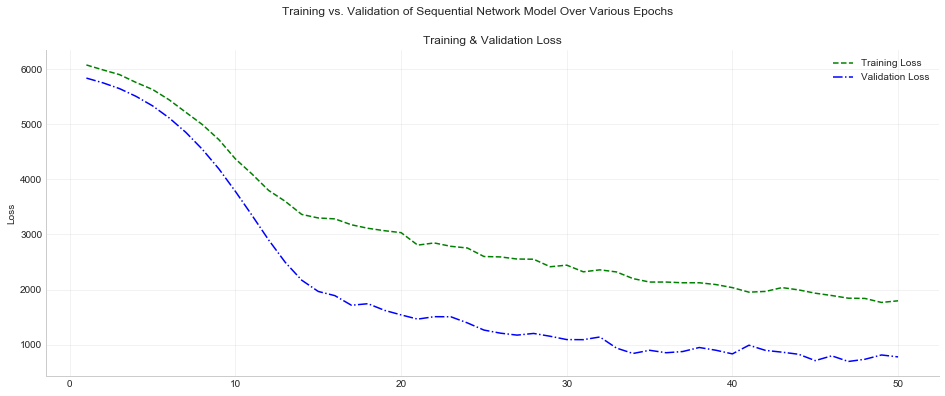

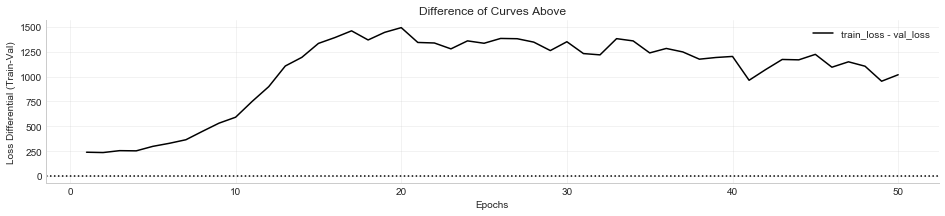


                Fully Connected Model - model 20 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 5
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.7835
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_504 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_505 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_326 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_506 (Dense)            (None, 4)                 20        
__________________________________________

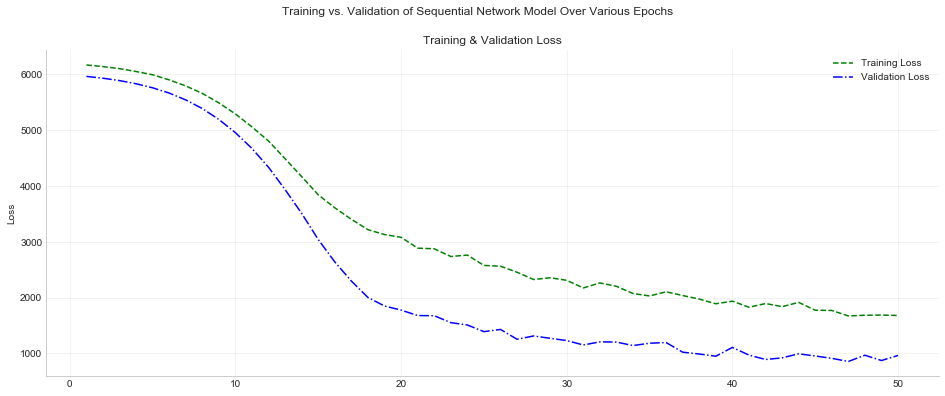

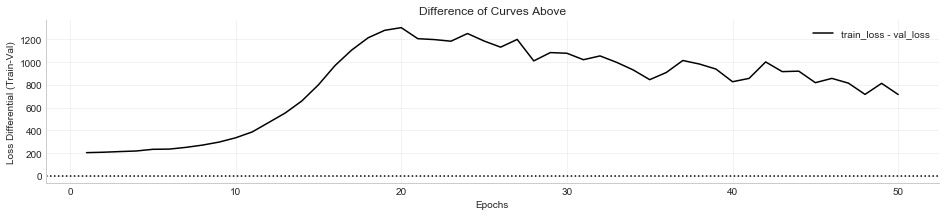


                Fully Connected Model - model 21 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 6
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.4964
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_511 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_512 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_331 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_513 (Dense)            (None, 4)                 20        
__________________________________________

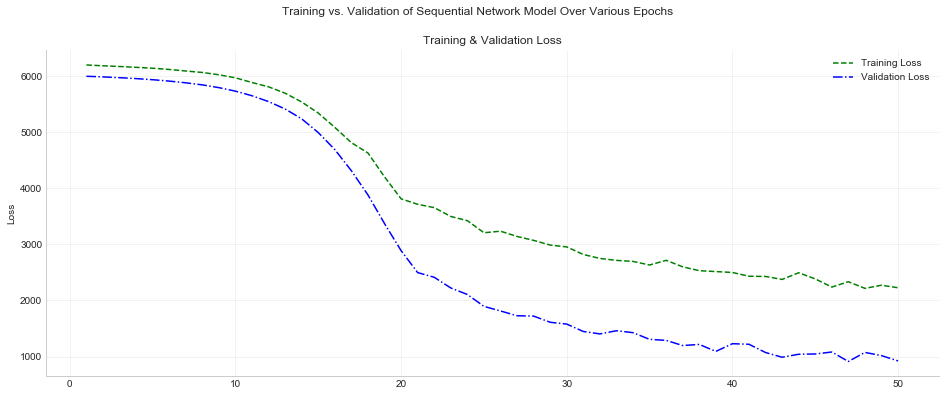

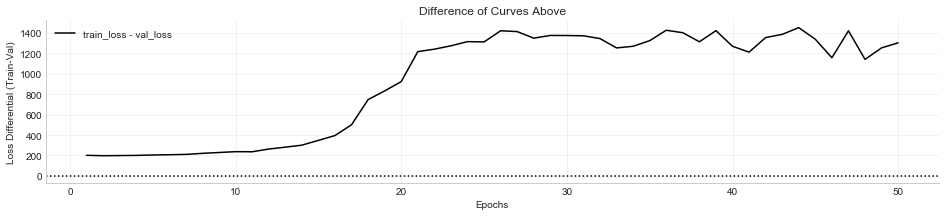


                Fully Connected Model - model 22 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 6
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.6636
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_519 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_520 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_337 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_521 (Dense)            (None, 4)                 20        
__________________________________________

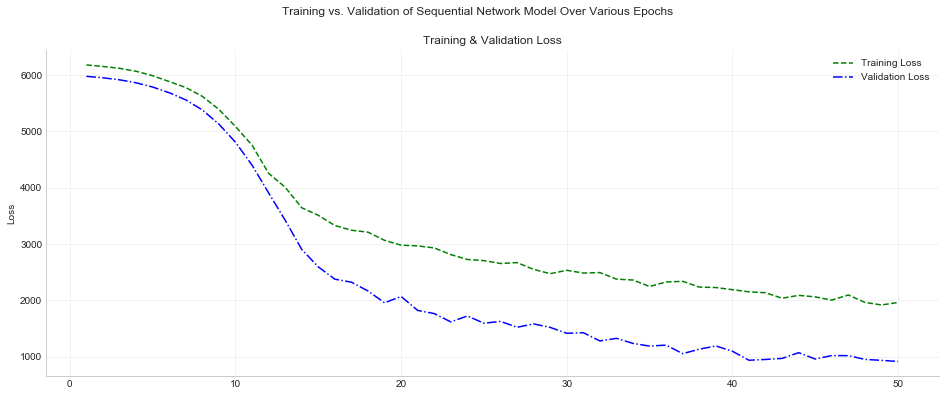

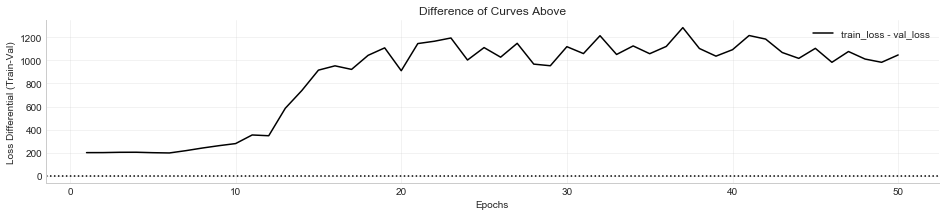


                Fully Connected Model - model 23 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 6
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.5349
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_527 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_528 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_343 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_529 (Dense)            (None, 4)                 20        
__________________________________________

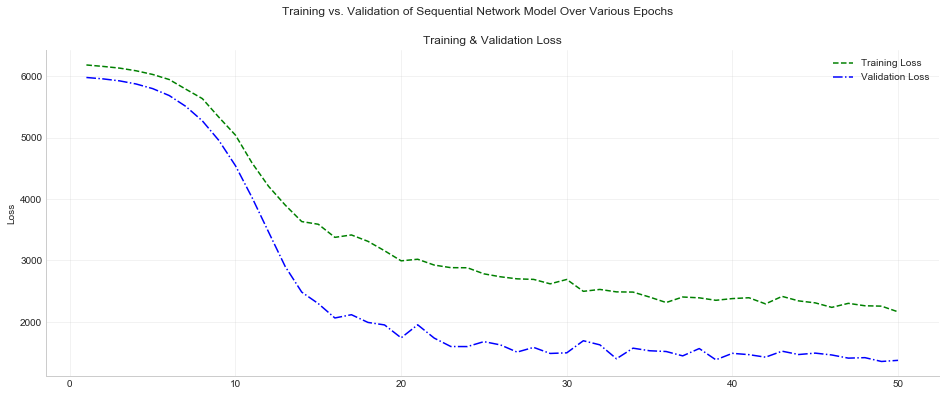

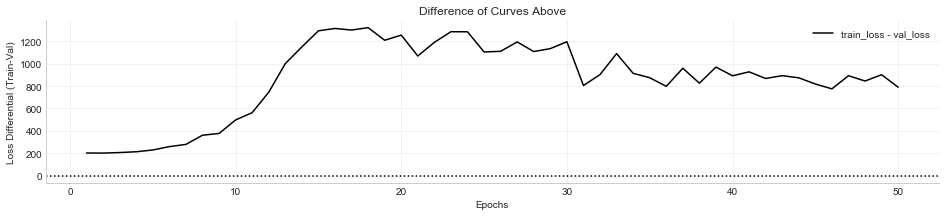


                Fully Connected Model - model 24 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 6
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.2813
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_535 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_536 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_349 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_537 (Dense)            (None, 4)                 20        
__________________________________________

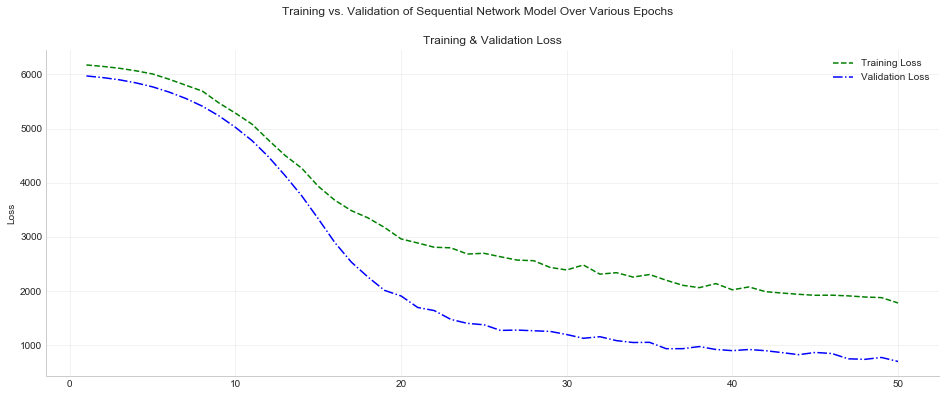

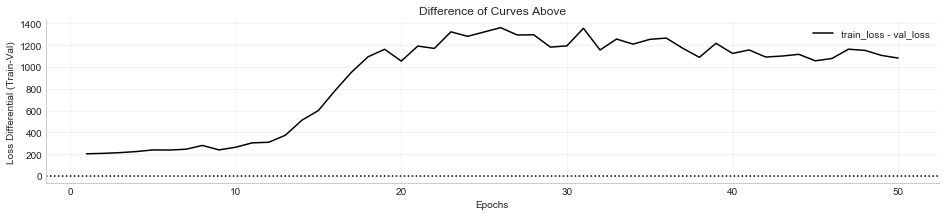


                Fully Connected Model - model 25 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 7
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = -9.4817
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_543 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_544 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_355 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_545 (Dense)            (None, 4)                 20        
__________________________________________

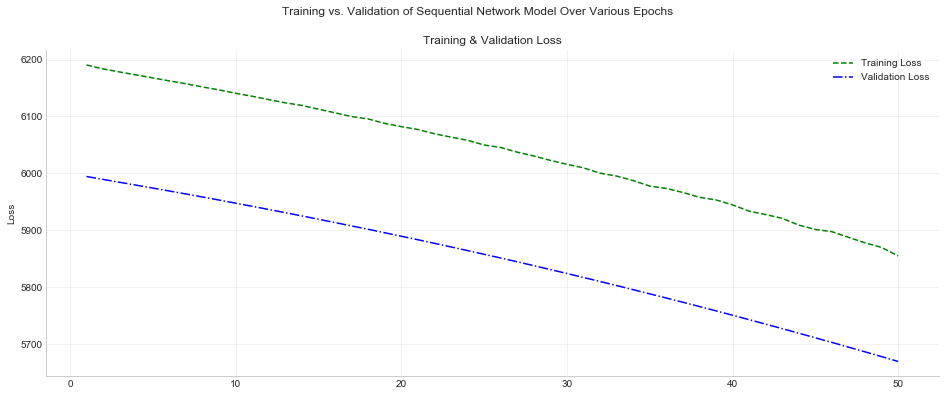

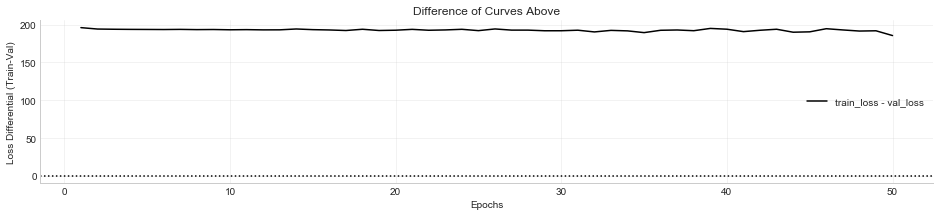


                Fully Connected Model - model 26 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 7
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.2328
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_552 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_553 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_362 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_554 (Dense)            (None, 4)                 20        
__________________________________________

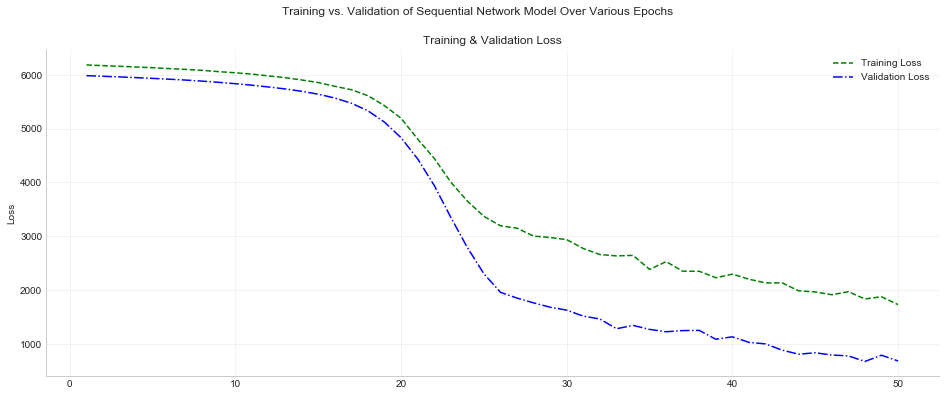

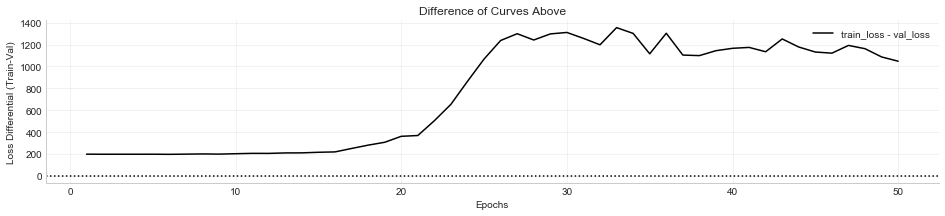


                Fully Connected Model - model 27 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 7
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.8041
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_561 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_562 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_369 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_563 (Dense)            (None, 4)                 20        
__________________________________________

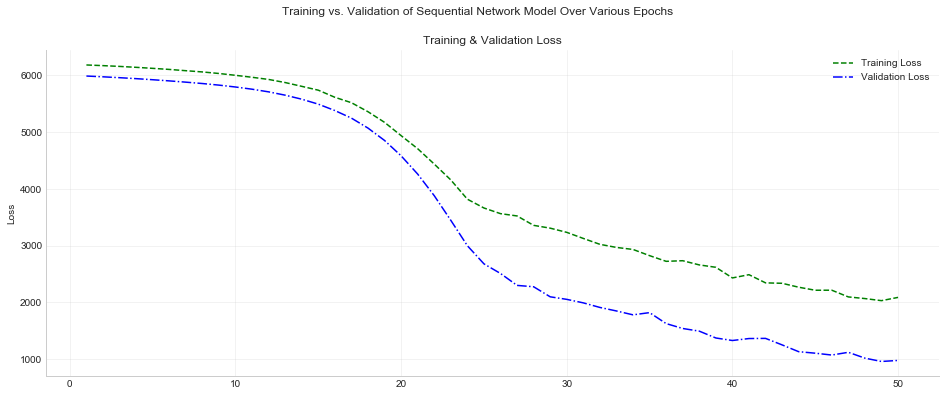

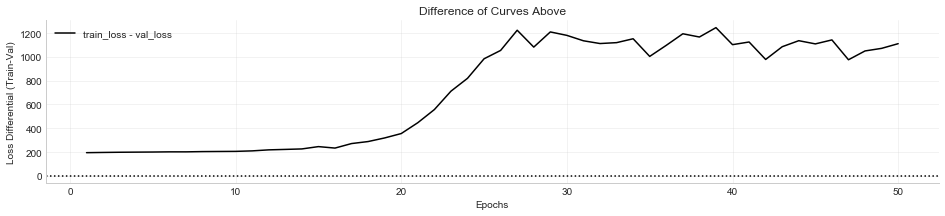


                Fully Connected Model - model 28 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 7
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.3957
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_570 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_571 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_376 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_572 (Dense)            (None, 4)                 20        
__________________________________________

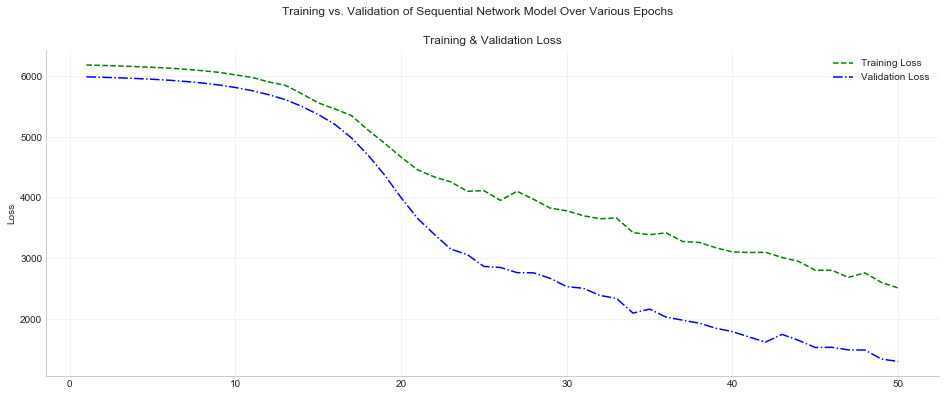

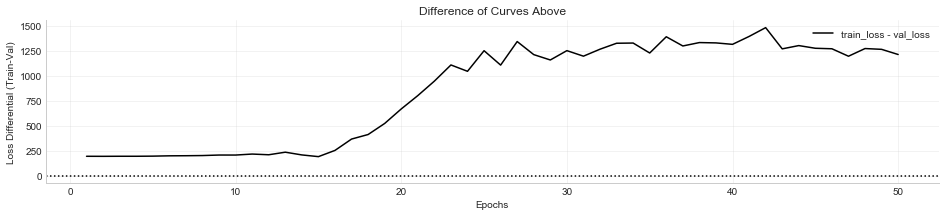


                Fully Connected Model - model 29 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 8
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.8735
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_579 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_580 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_383 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_581 (Dense)            (None, 4)                 20        
__________________________________________

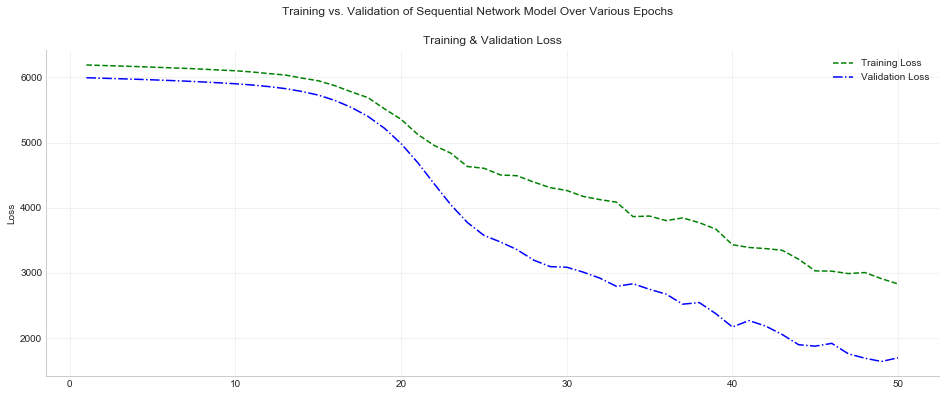

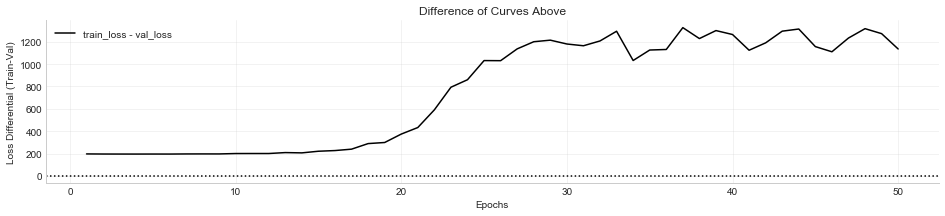


                Fully Connected Model - model 30 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 8
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.1795
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_589 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_590 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_391 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_591 (Dense)            (None, 4)                 20        
__________________________________________

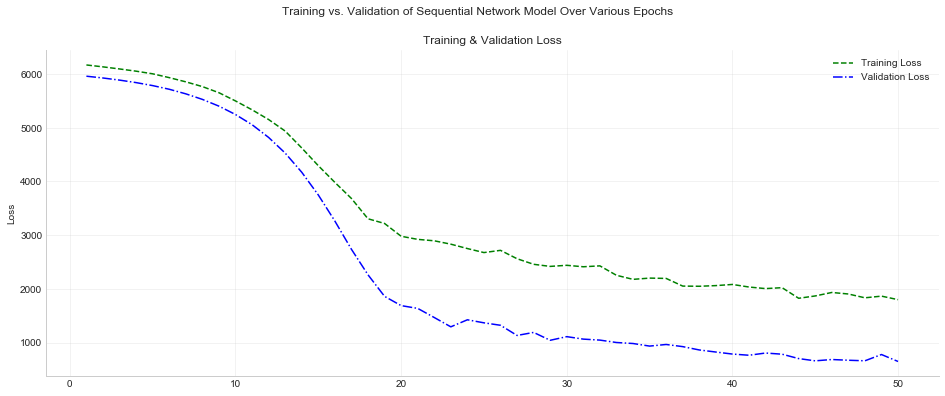

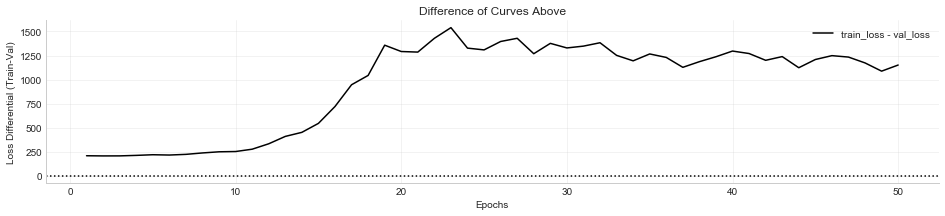


                Fully Connected Model - model 31 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 8
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.0926
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_599 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_600 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_399 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_601 (Dense)            (None, 4)                 20        
__________________________________________

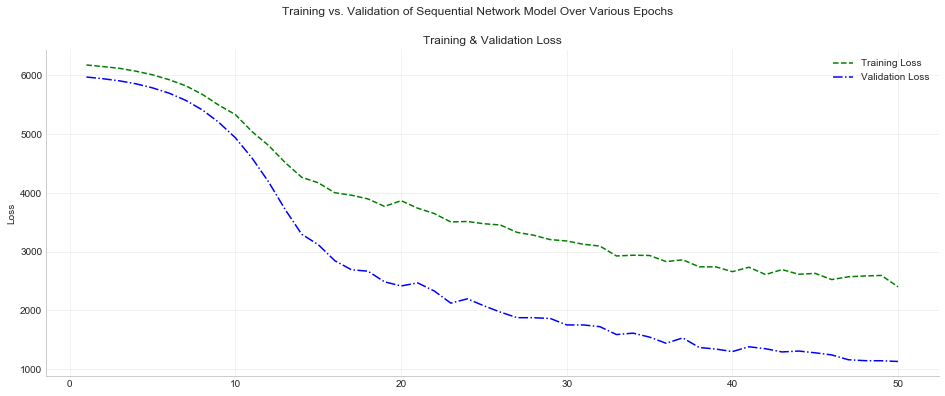

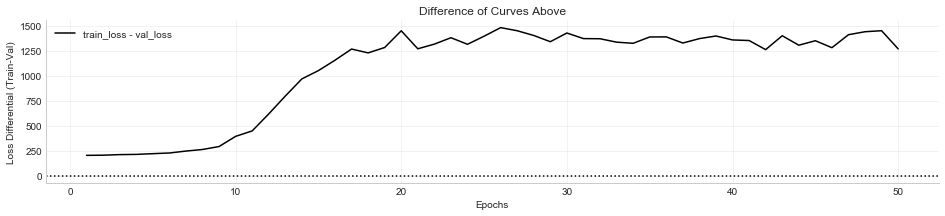


                Fully Connected Model - model 32 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 8
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = -8.7319
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_609 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_610 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_407 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_611 (Dense)            (None, 4)                 20        
__________________________________________

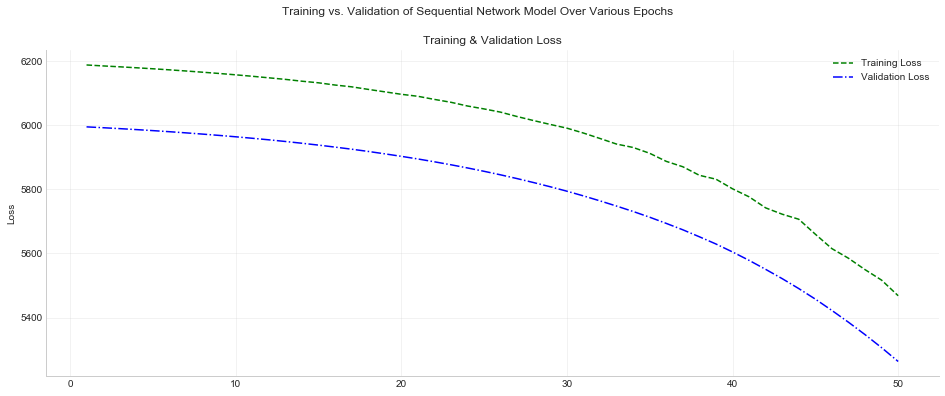

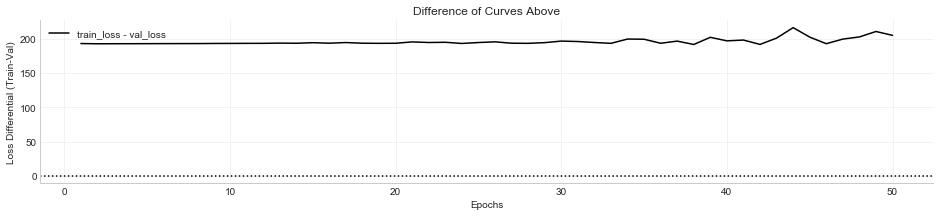


                Fully Connected Model - model 33 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 9
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = -9.5204
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_619 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_620 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_415 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_621 (Dense)            (None, 4)                 20        
__________________________________________

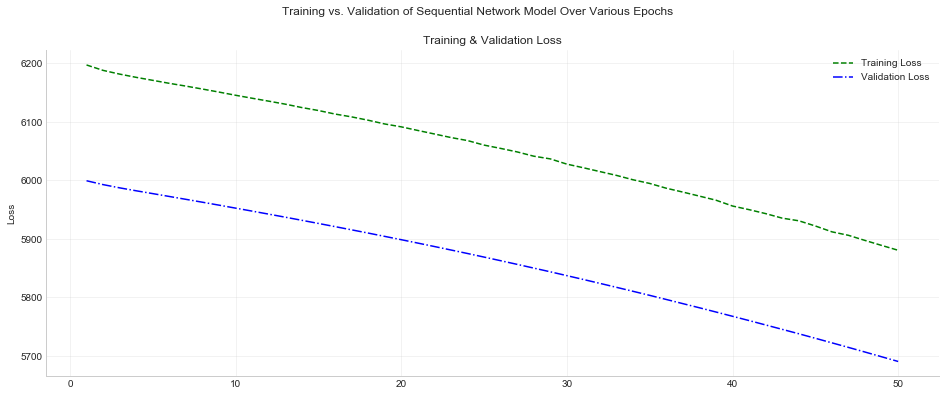

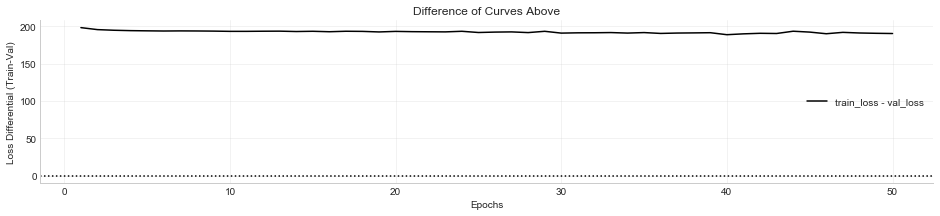


                Fully Connected Model - model 34 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 9
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = -2.1718
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_630 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_631 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_424 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_632 (Dense)            (None, 4)                 20        
__________________________________________

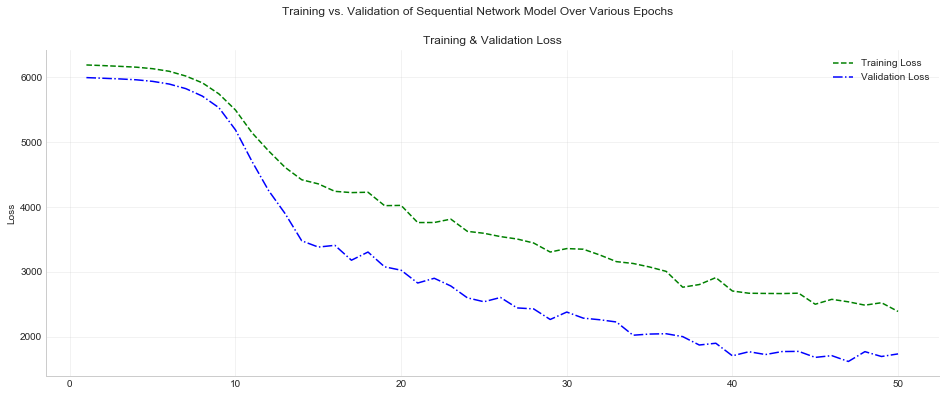

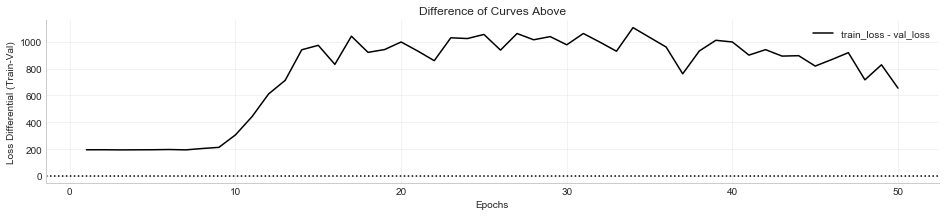


                Fully Connected Model - model 35 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 9
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.3911
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_641 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_642 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_433 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_643 (Dense)            (None, 4)                 20        
__________________________________________

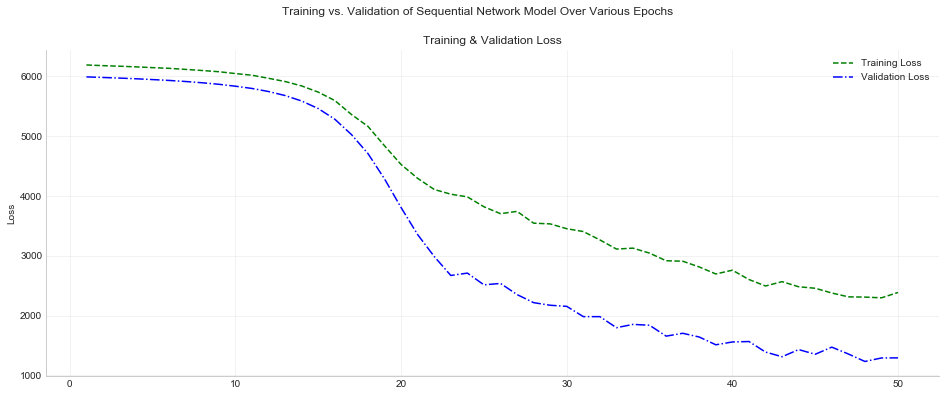

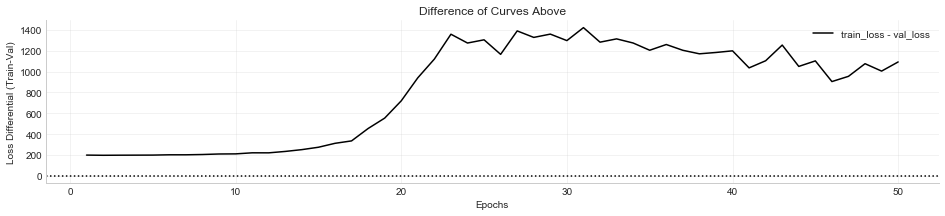


                Fully Connected Model - model 36 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 9
                 - Neurons per Layer:   4
                 

--------------------------------------------------------------------------------
R-squared on test data = -9.8575
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_652 (Dense)            (None, 4)                 184       
_________________________________________________________________
dense_653 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_442 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_654 (Dense)            (None, 4)                 20        
__________________________________________

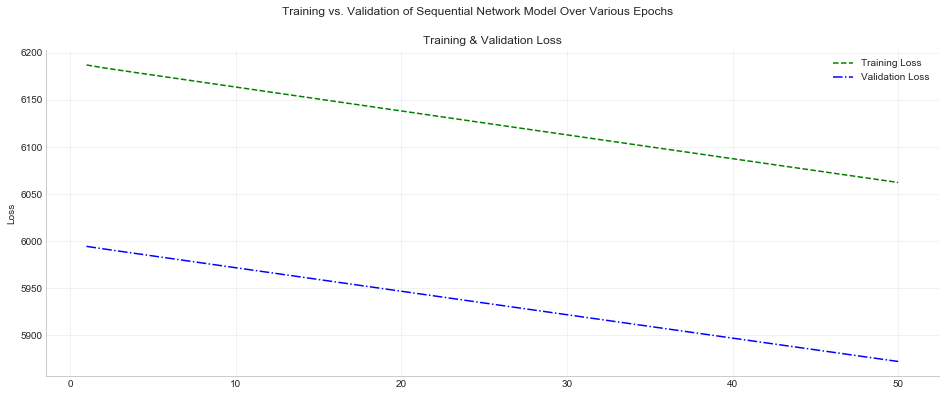

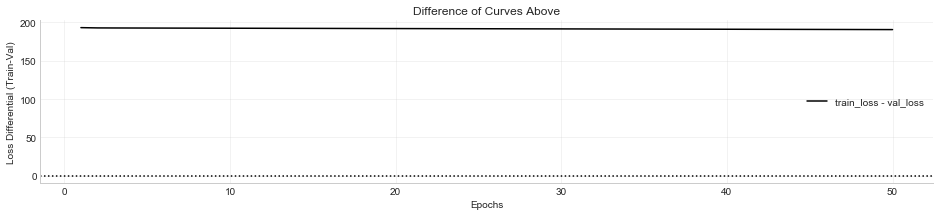


                Fully Connected Model - model 37 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 1
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.8520
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_663 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_664 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_451 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_665 (Dense)            (None, 1)                 7         
Total params: 325
Trainable params: 325
Non

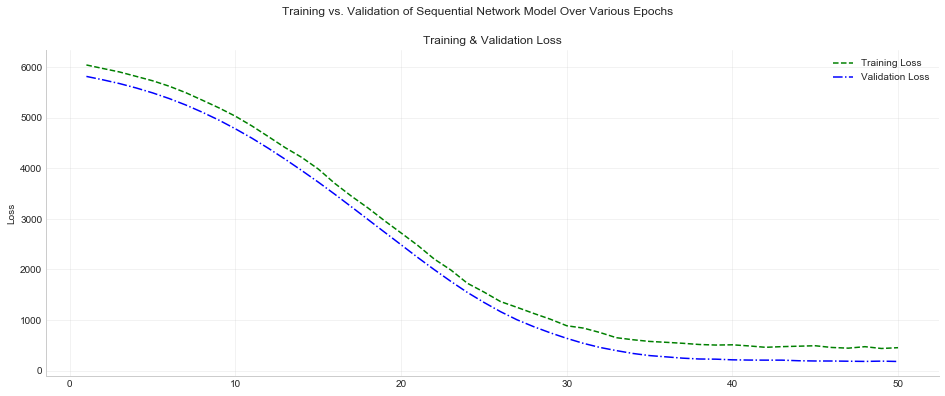

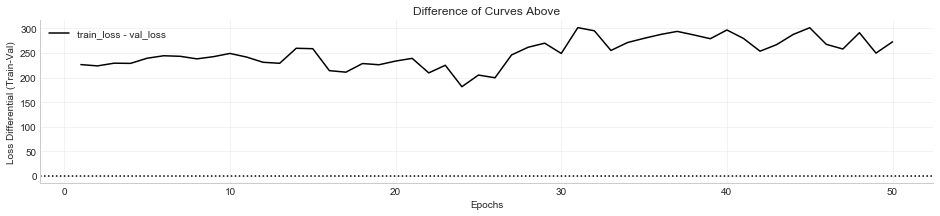


                Fully Connected Model - model 38 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 1
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.7902
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_666 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_667 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_452 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_668 (Dense)            (None, 1)                 7         
Total params: 325
Trainable params: 325
Non

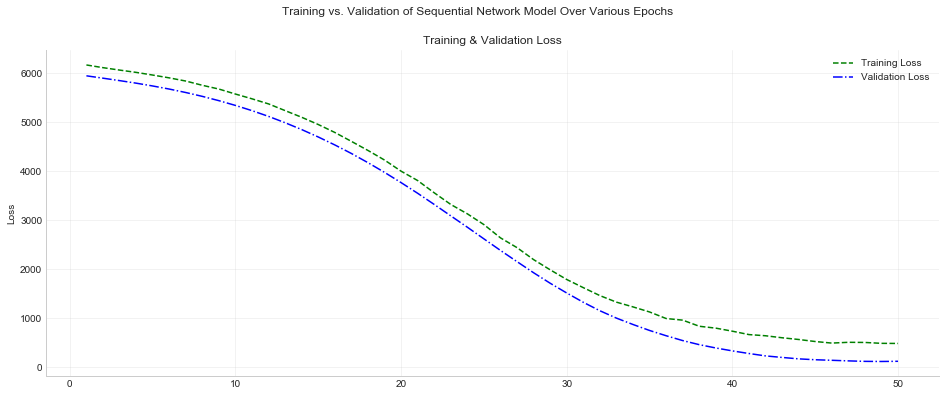

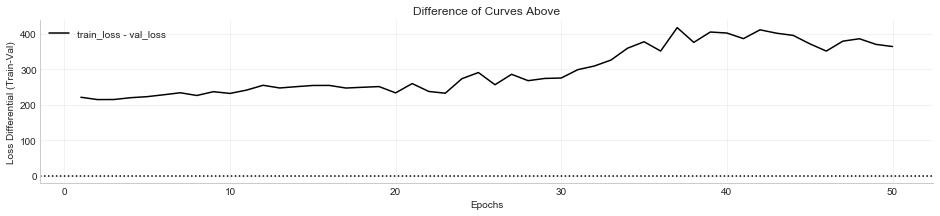


                Fully Connected Model - model 39 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 1
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.7562
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_669 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_670 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_453 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_671 (Dense)            (None, 1)                 7         
Total params: 325
Trainable params: 325
No

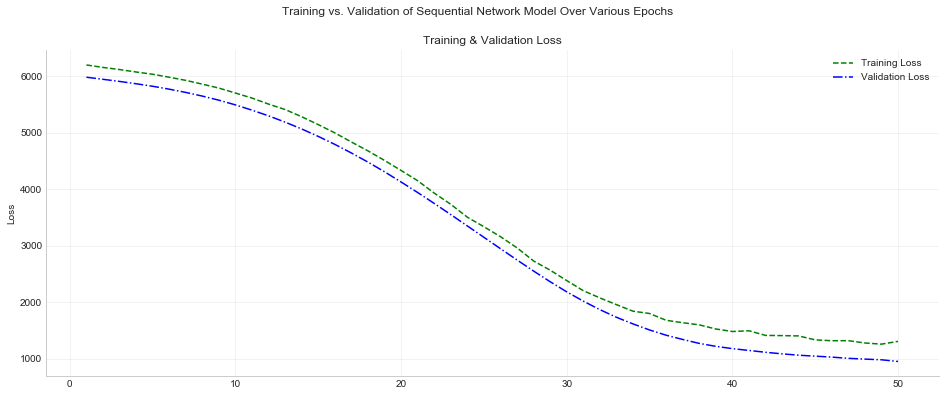

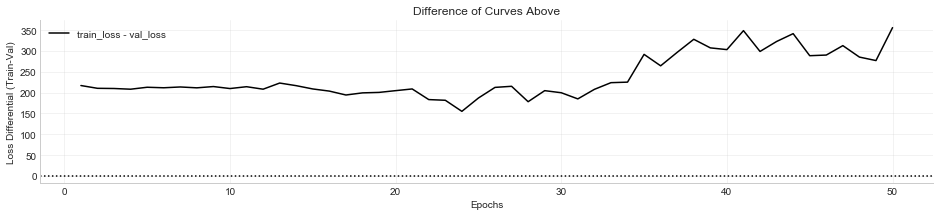


                Fully Connected Model - model 40 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 1
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.8533
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_672 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_673 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_454 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_674 (Dense)            (None, 1)                 7         
Total params: 325
Trainable params: 325
Non

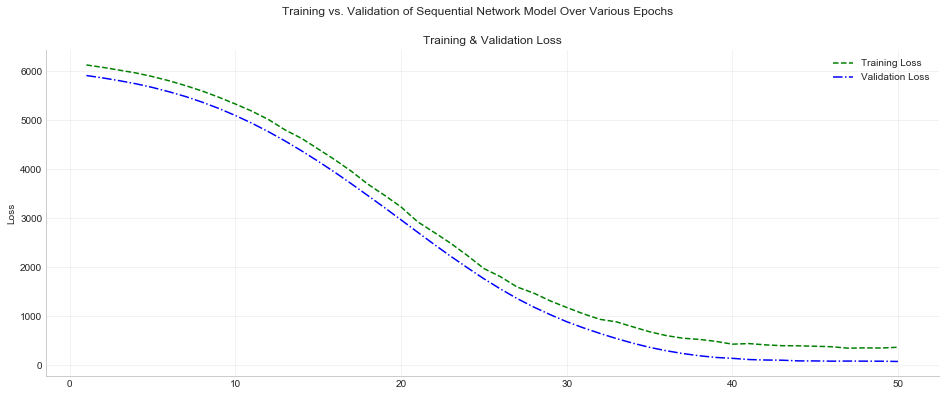

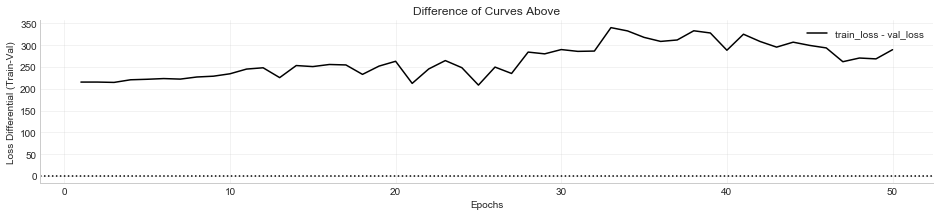


                Fully Connected Model - model 41 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 2
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.6836
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_675 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_676 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_455 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_677 (Dense)            (None, 6)                 42        
___________________________________________

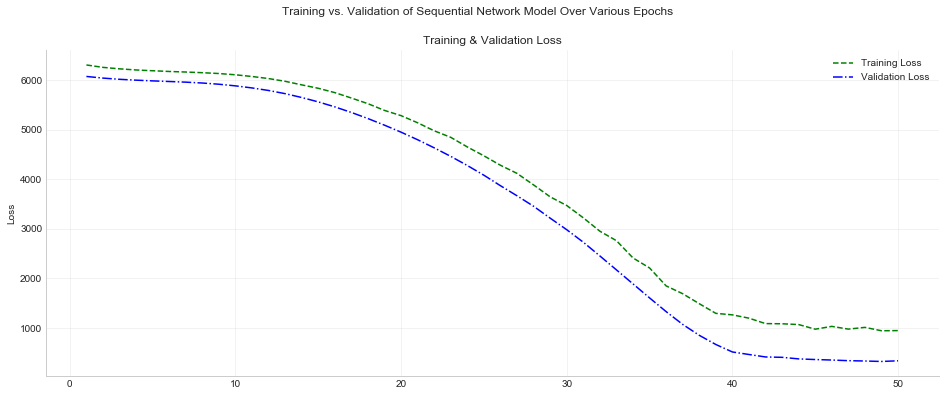

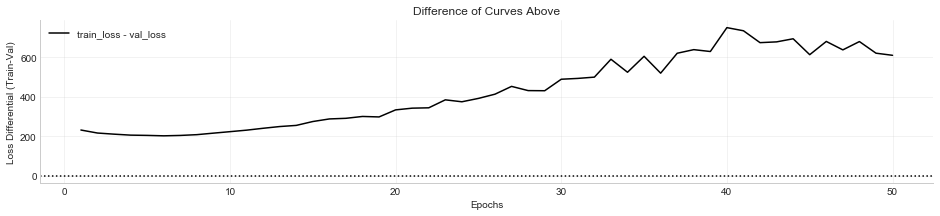


                Fully Connected Model - model 42 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 2
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.6723
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_679 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_680 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_457 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_681 (Dense)            (None, 6)                 42        
___________________________________________

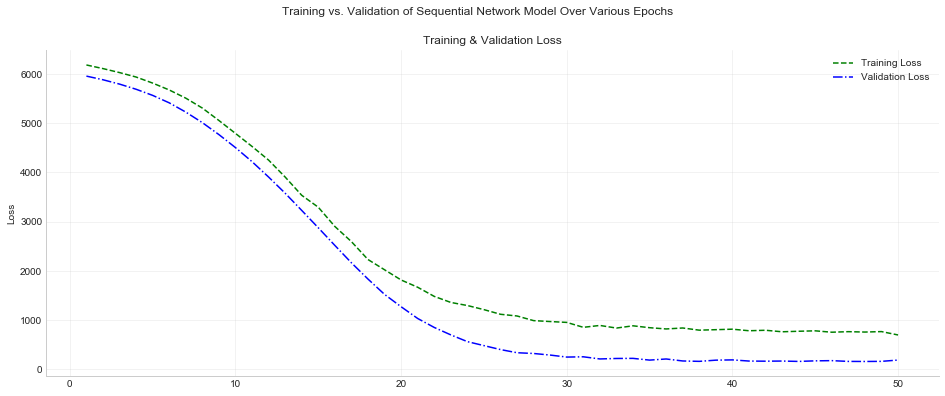

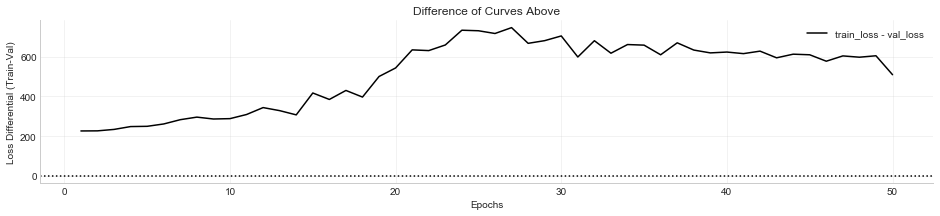


                Fully Connected Model - model 43 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 2
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.8006
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_683 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_684 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_459 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_685 (Dense)            (None, 6)                 42        
___________________________________________

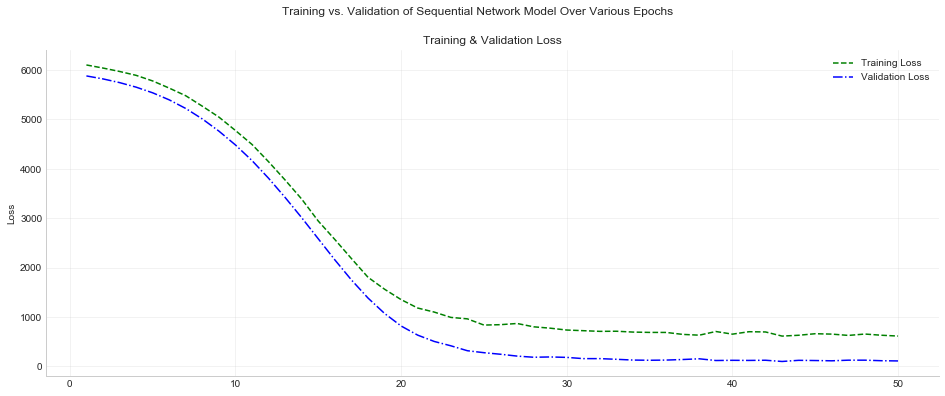

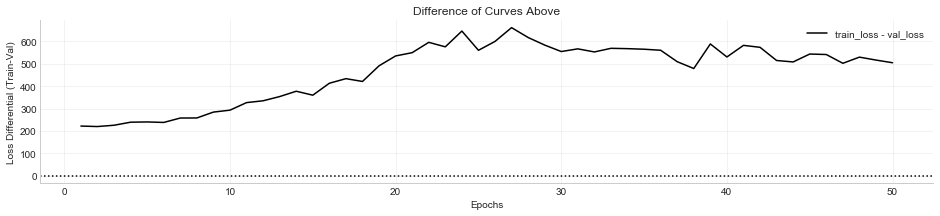


                Fully Connected Model - model 44 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 2
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.5911
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_687 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_688 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_461 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_689 (Dense)            (None, 6)                 42        
___________________________________________

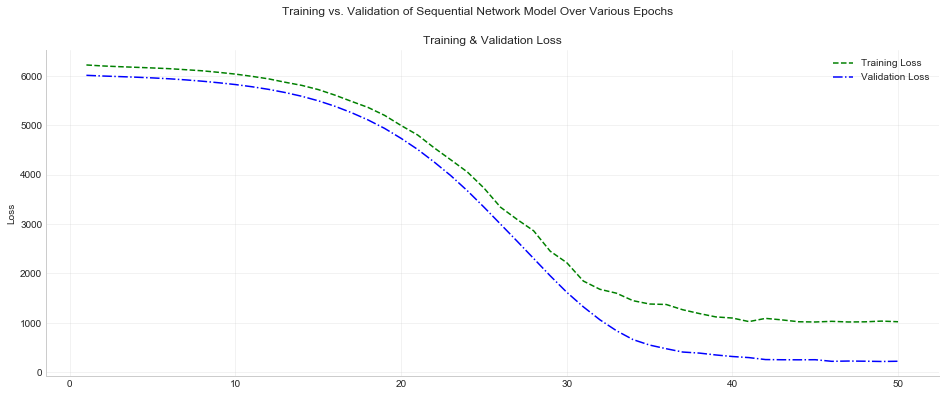

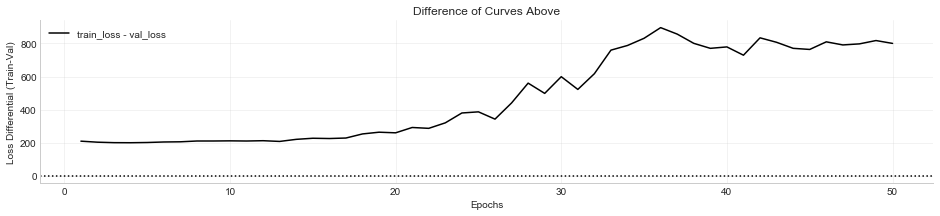


                Fully Connected Model - model 45 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 3
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.4370
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_691 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_692 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_463 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_693 (Dense)            (None, 6)                 42        
___________________________________________

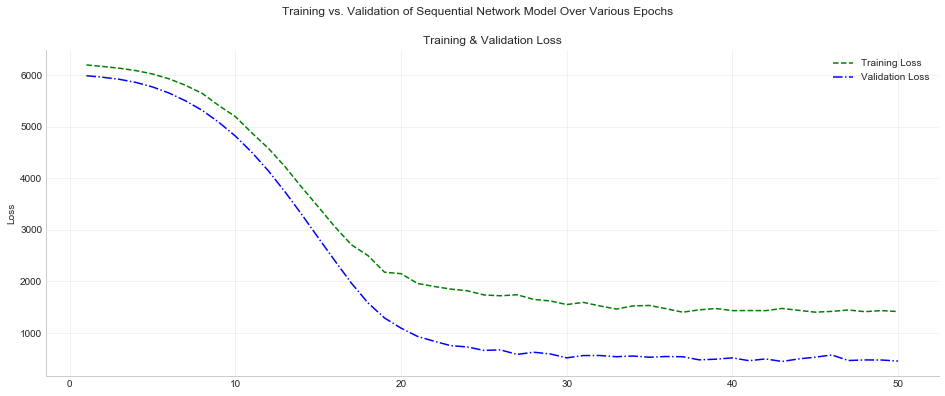

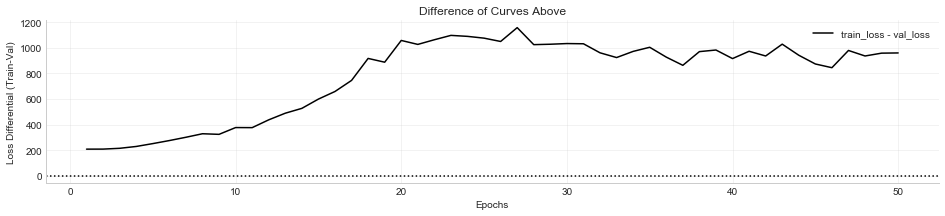


                Fully Connected Model - model 46 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 3
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.5312
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_696 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_697 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_466 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_698 (Dense)            (None, 6)                 42        
___________________________________________

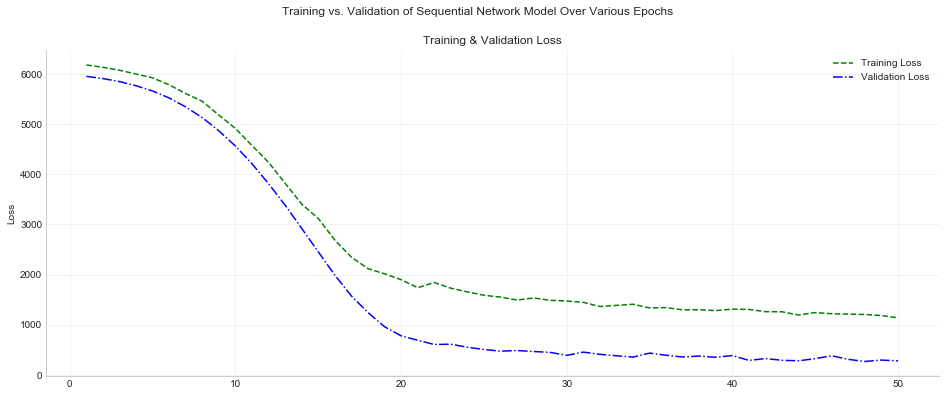

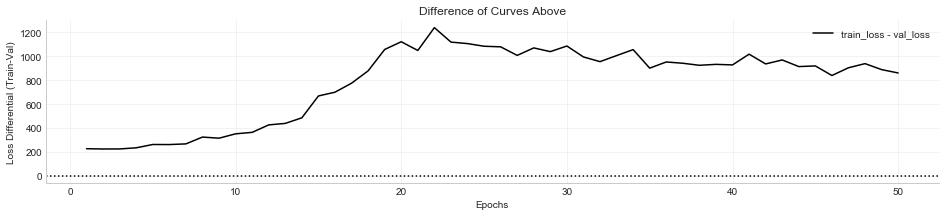


                Fully Connected Model - model 47 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 3
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.2199
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_701 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_702 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_469 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_703 (Dense)            (None, 6)                 42        
___________________________________________

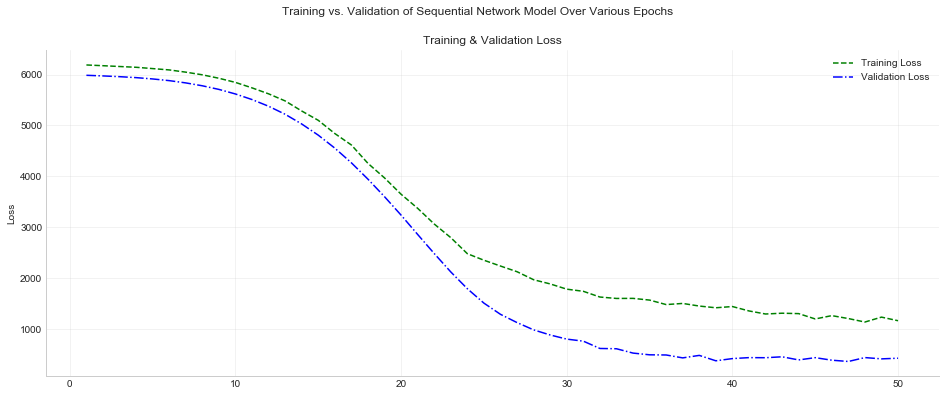

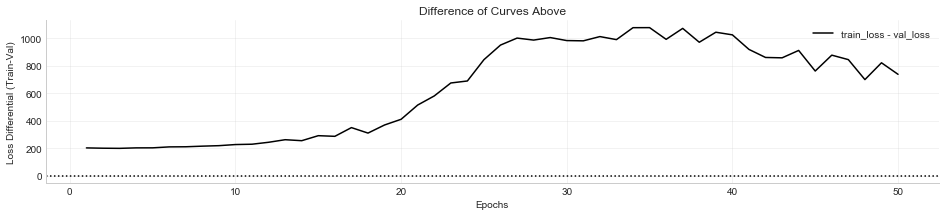


                Fully Connected Model - model 48 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 3
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.4516
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_706 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_707 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_472 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_708 (Dense)            (None, 6)                 42        
___________________________________________

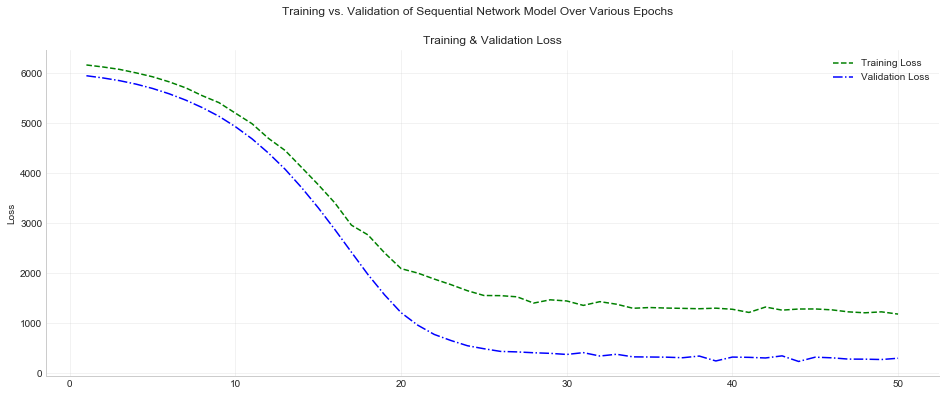

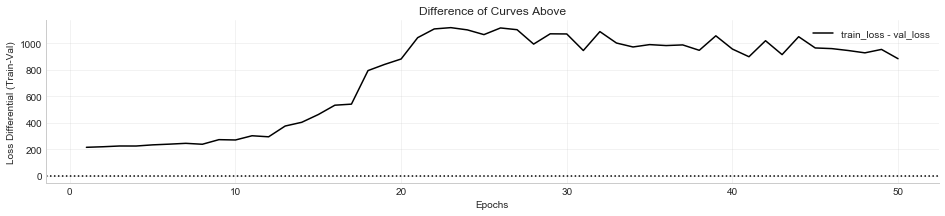


                Fully Connected Model - model 49 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 4
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.0092
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_711 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_712 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_475 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_713 (Dense)            (None, 6)                 42        
___________________________________________

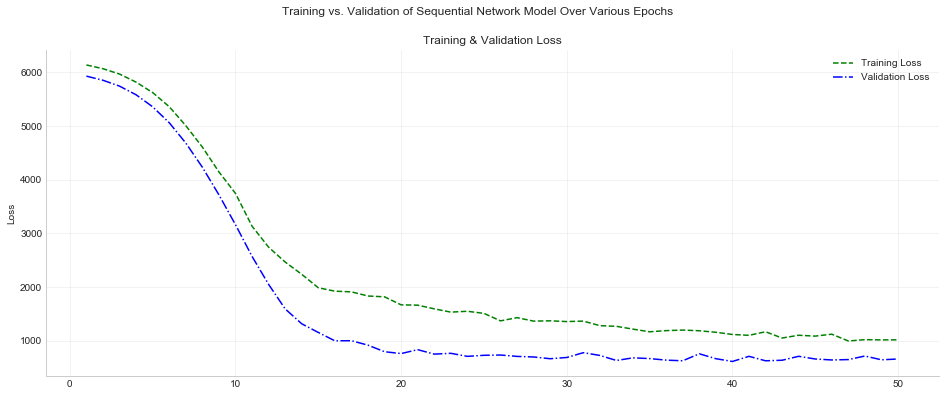

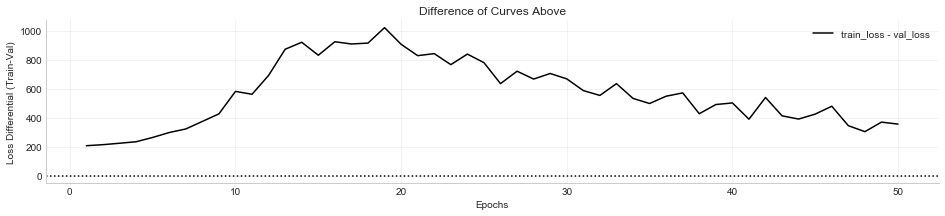


                Fully Connected Model - model 50 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 4
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.5206
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_717 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_718 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_479 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_719 (Dense)            (None, 6)                 42        
___________________________________________

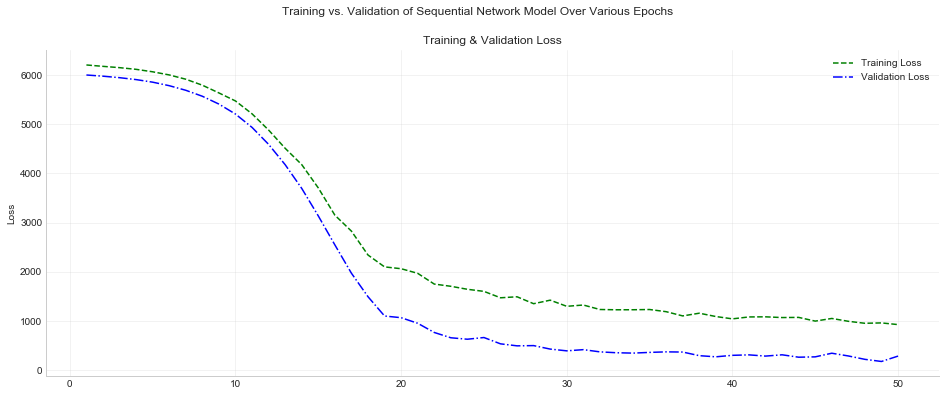

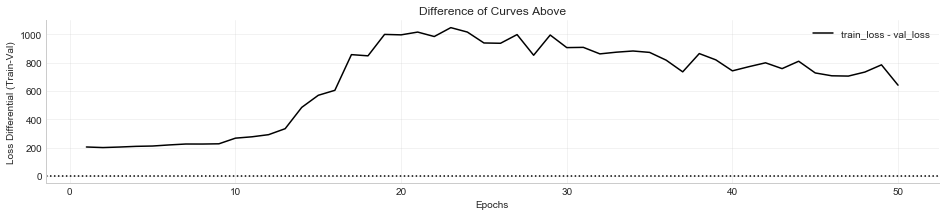


                Fully Connected Model - model 51 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 4
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.3797
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_723 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_724 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_483 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_725 (Dense)            (None, 6)                 42        
___________________________________________

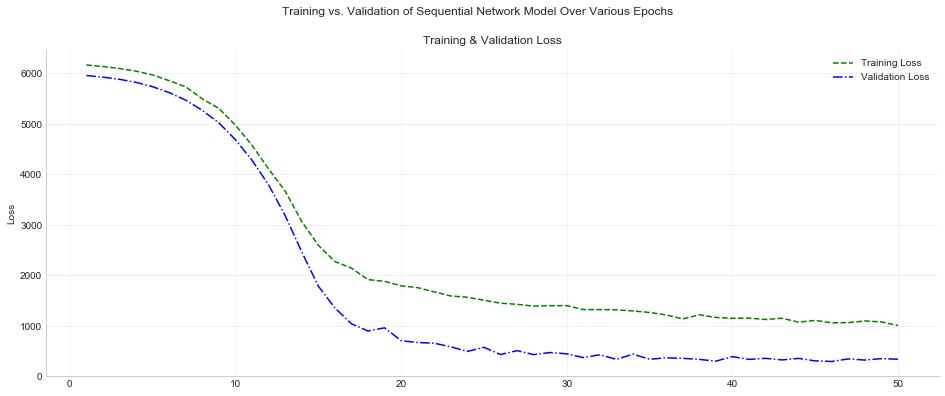

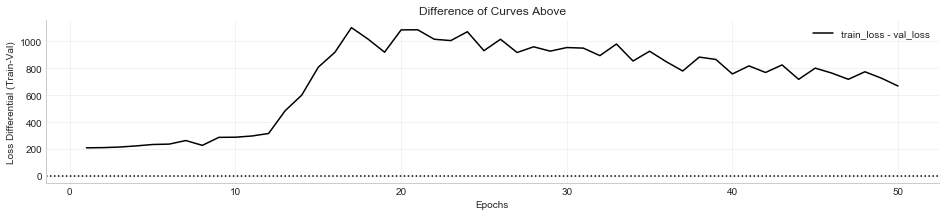


                Fully Connected Model - model 52 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 4
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.1497
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_729 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_730 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_487 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_731 (Dense)            (None, 6)                 42        
__________________________________________

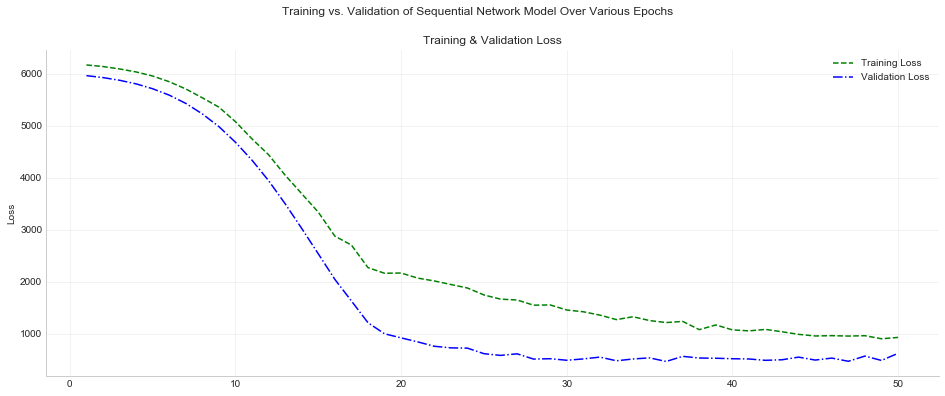

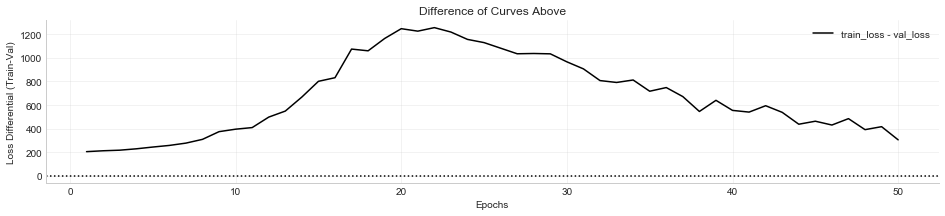


                Fully Connected Model - model 53 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 5
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.0252
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_735 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_736 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_491 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_737 (Dense)            (None, 6)                 42        
__________________________________________

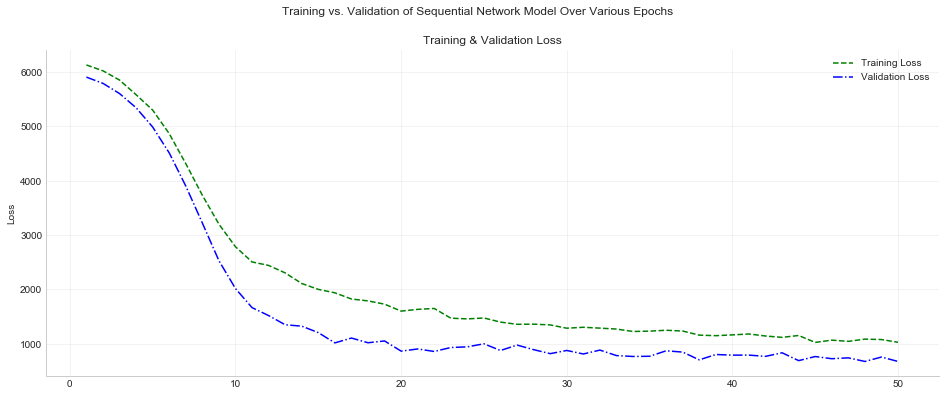

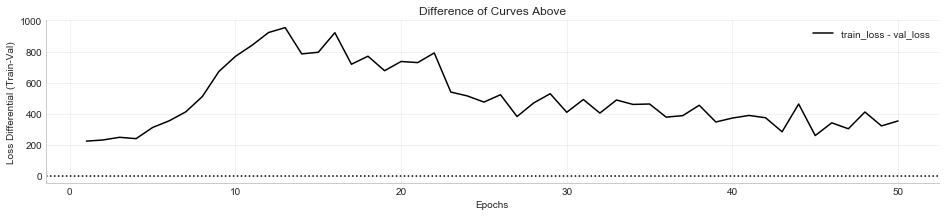


                Fully Connected Model - model 54 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 5
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.0137
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_742 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_743 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_496 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_744 (Dense)            (None, 6)                 42        
__________________________________________

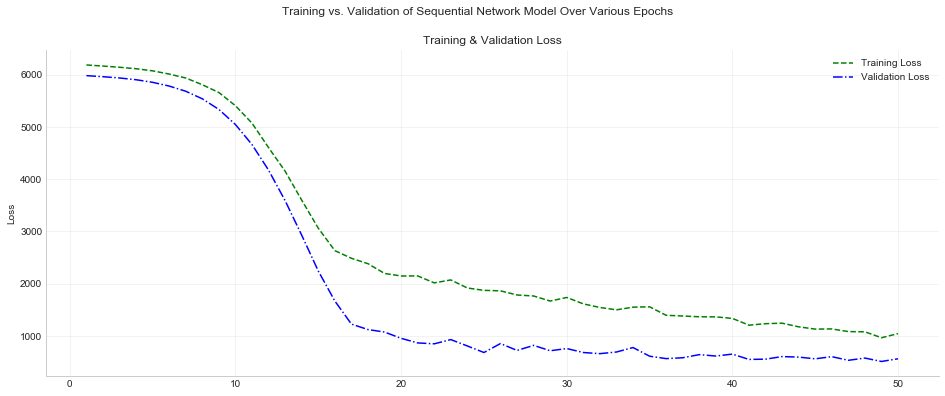

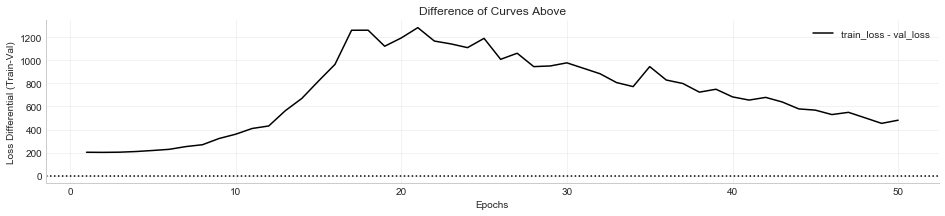


                Fully Connected Model - model 55 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 5
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.0224
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_749 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_750 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_501 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_751 (Dense)            (None, 6)                 42        
__________________________________________

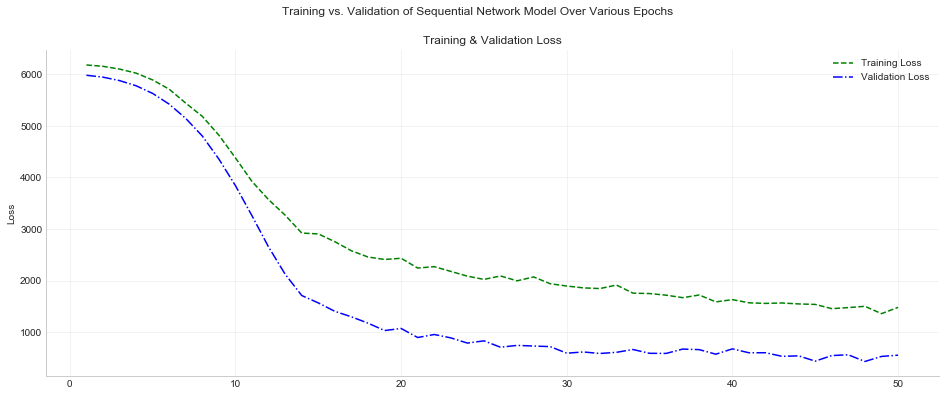

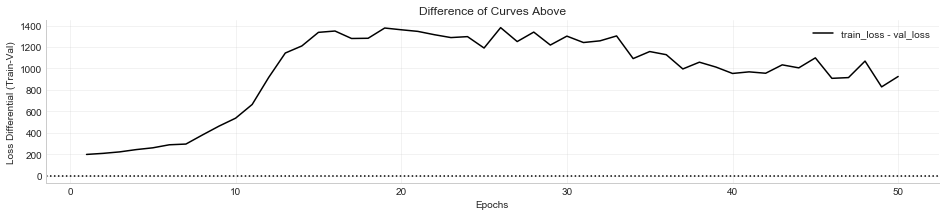


                Fully Connected Model - model 56 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 5
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.4383
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_756 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_757 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_506 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_758 (Dense)            (None, 6)                 42        
__________________________________________

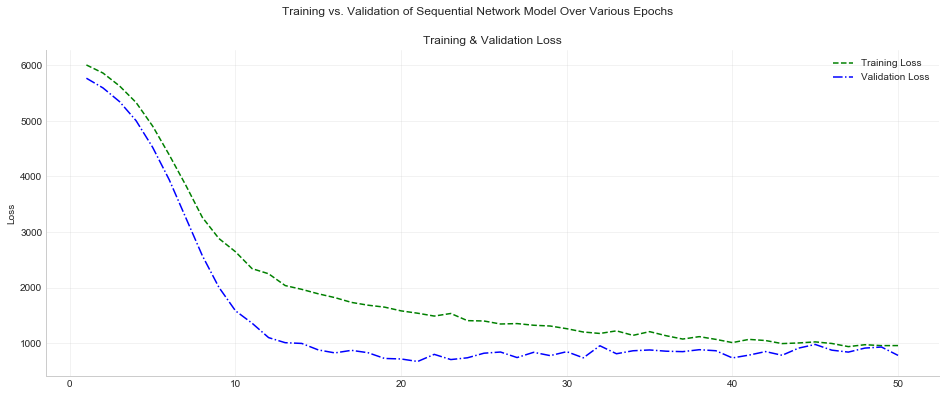

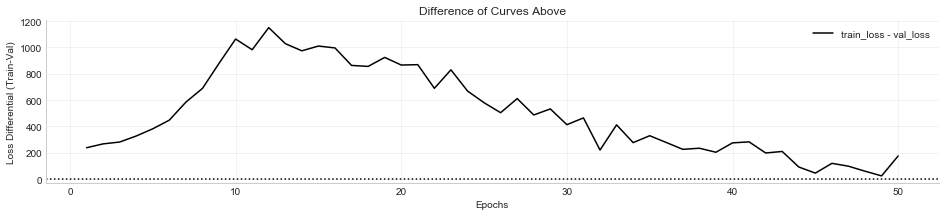


                Fully Connected Model - model 57 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 6
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = -7.0026
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_763 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_764 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_511 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_765 (Dense)            (None, 6)                 42        
__________________________________________

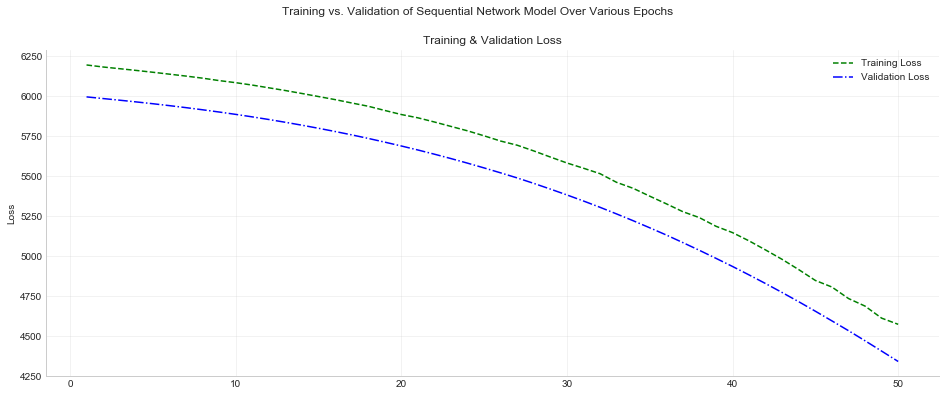

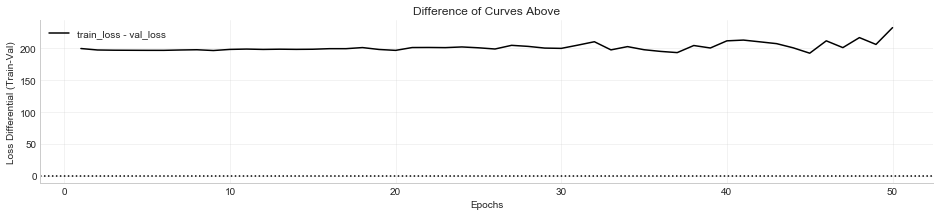


                Fully Connected Model - model 58 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 6
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.0254
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_771 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_772 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_517 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_773 (Dense)            (None, 6)                 42        
__________________________________________

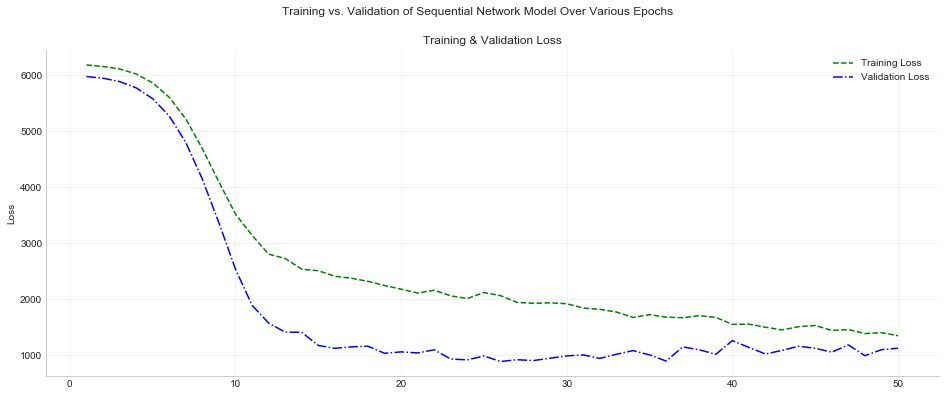

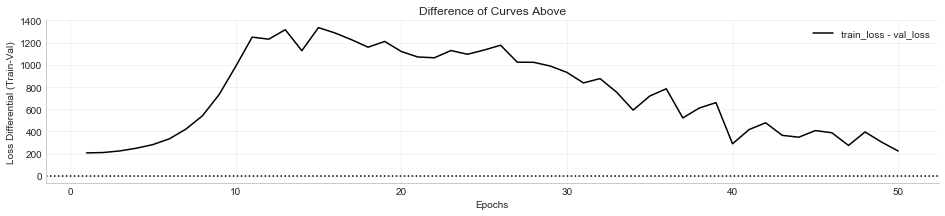


                Fully Connected Model - model 59 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 6
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.9557
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_779 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_780 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_523 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_781 (Dense)            (None, 6)                 42        
__________________________________________

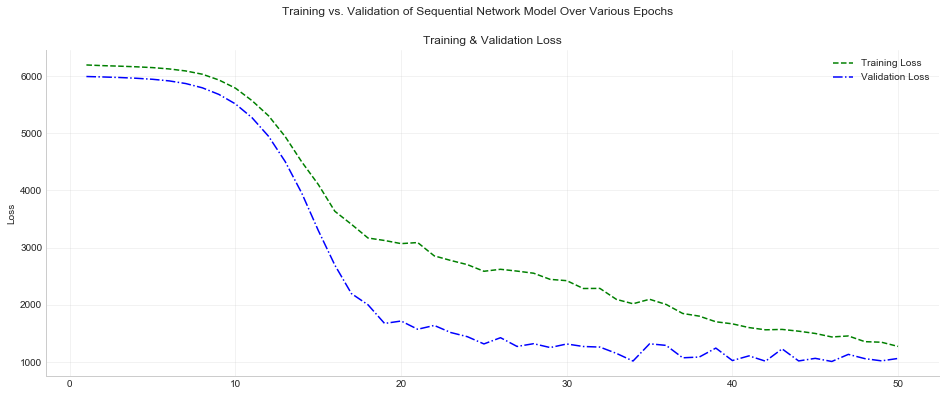

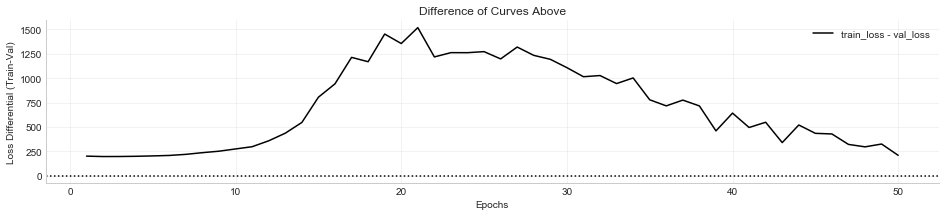


                Fully Connected Model - model 60 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 6
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = -2.0155
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_787 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_788 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_529 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_789 (Dense)            (None, 6)                 42        
__________________________________________

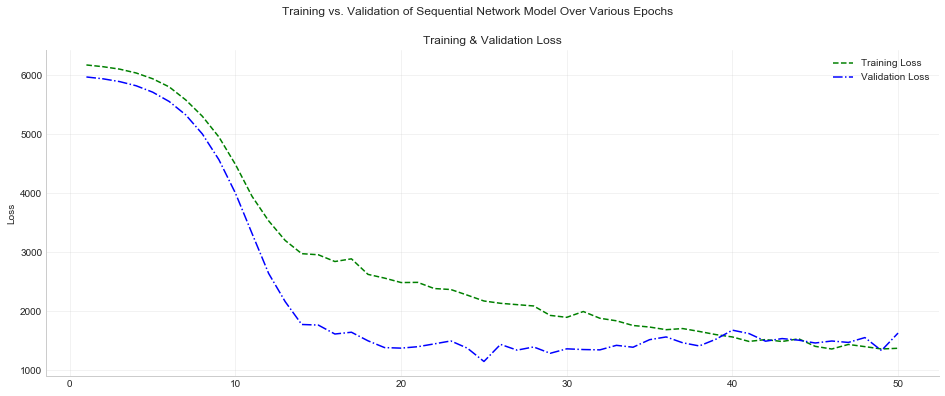

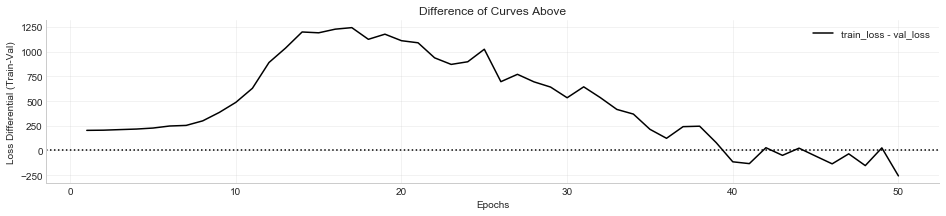


                Fully Connected Model - model 61 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 7
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.1617
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_795 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_796 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_535 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_797 (Dense)            (None, 6)                 42        
__________________________________________

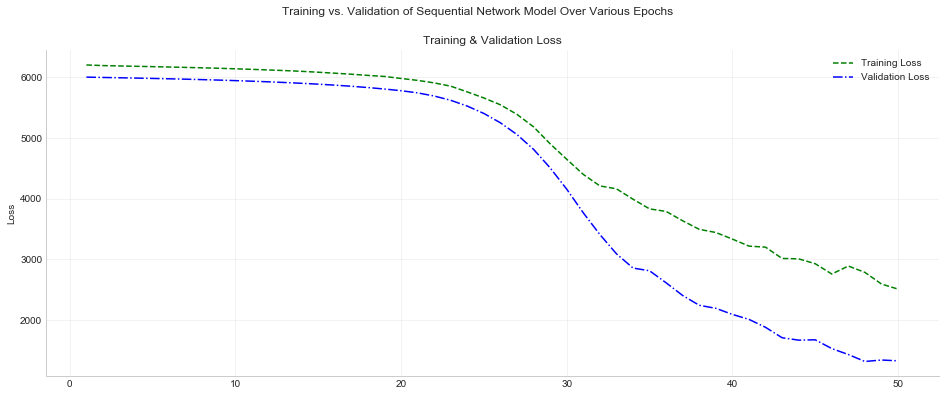

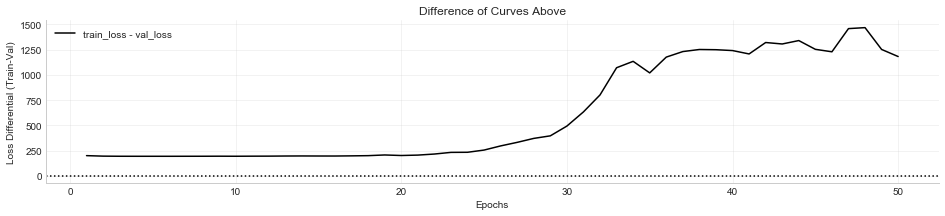


                Fully Connected Model - model 62 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 7
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.9344
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_804 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_805 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_542 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_806 (Dense)            (None, 6)                 42        
__________________________________________

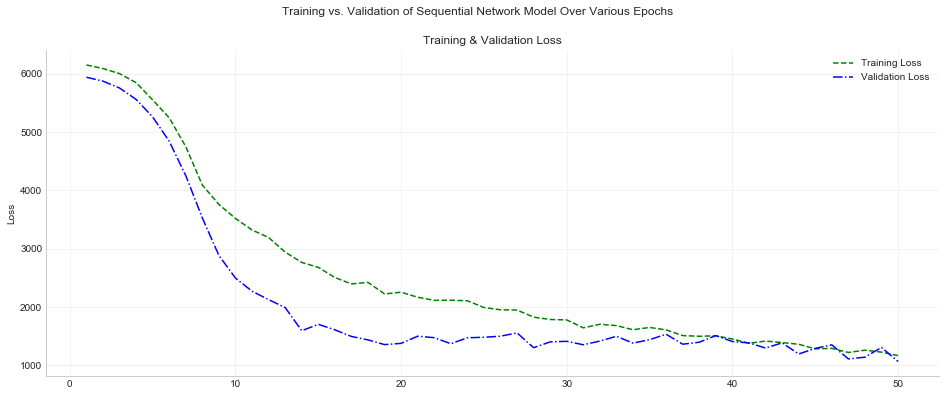

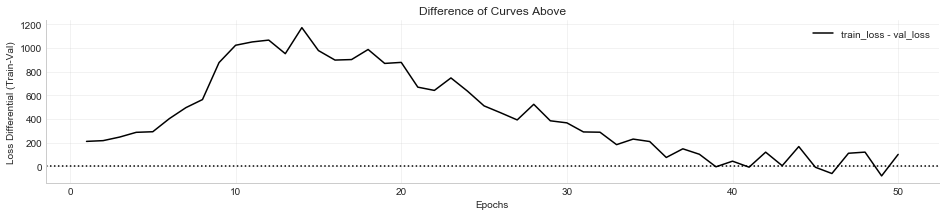


                Fully Connected Model - model 63 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 7
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.7919
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_813 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_814 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_549 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_815 (Dense)            (None, 6)                 42        
__________________________________________

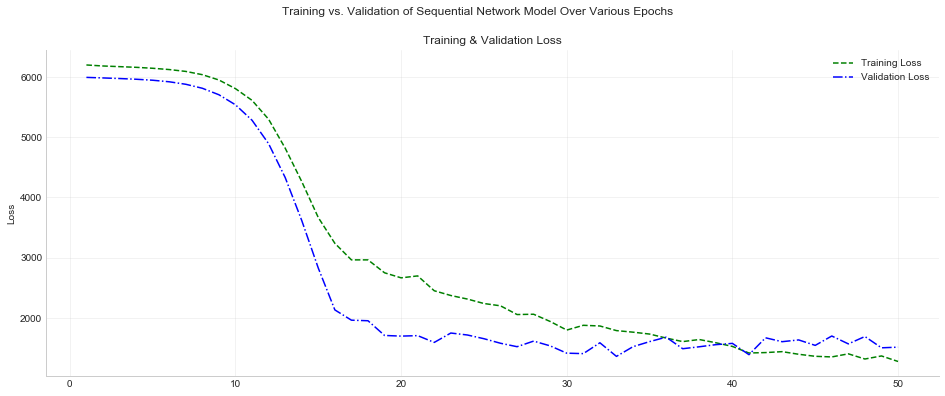

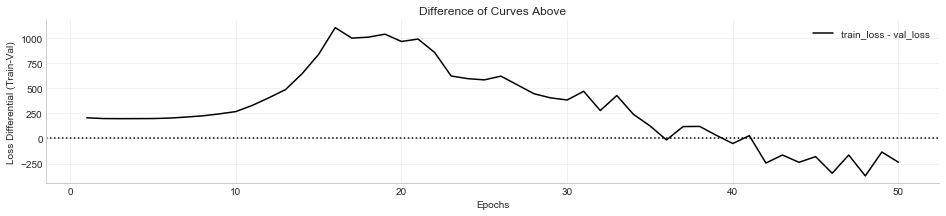


                Fully Connected Model - model 64 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 7
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.7329
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_822 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_823 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_556 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_824 (Dense)            (None, 6)                 42        
__________________________________________

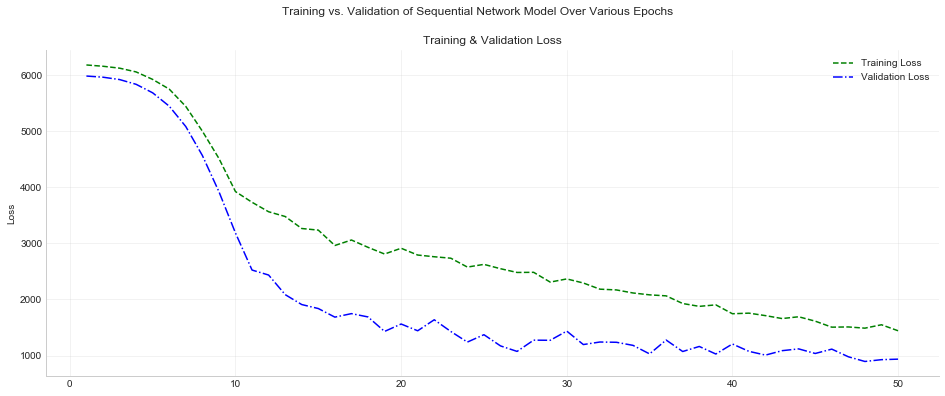

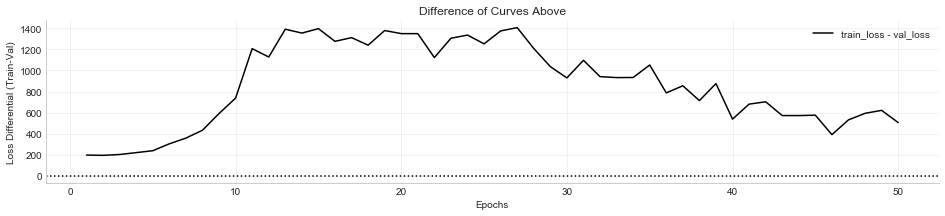


                Fully Connected Model - model 65 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 8
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = -9.4930
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_831 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_832 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_563 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_833 (Dense)            (None, 6)                 42        
__________________________________________

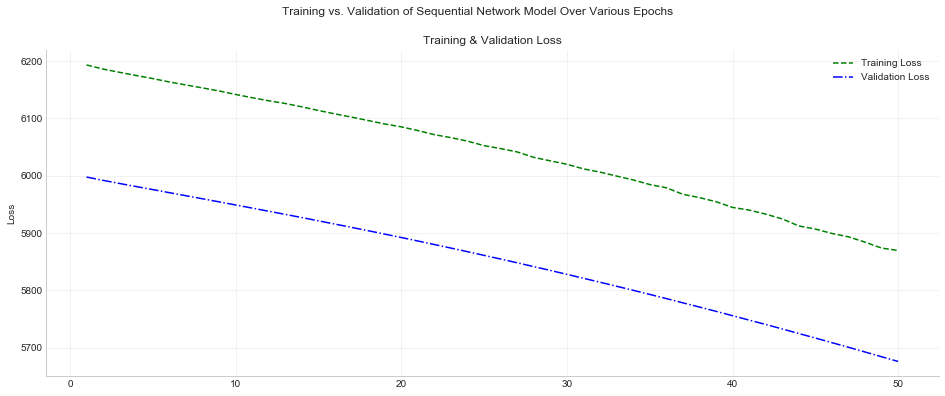

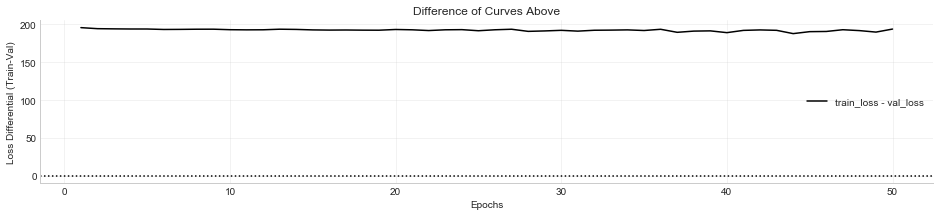


                Fully Connected Model - model 66 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 8
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.1149
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_841 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_842 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_571 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_843 (Dense)            (None, 6)                 42        
__________________________________________

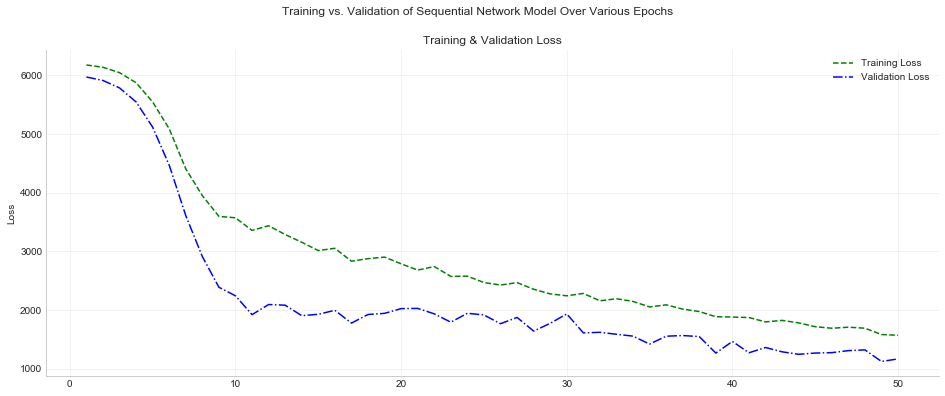

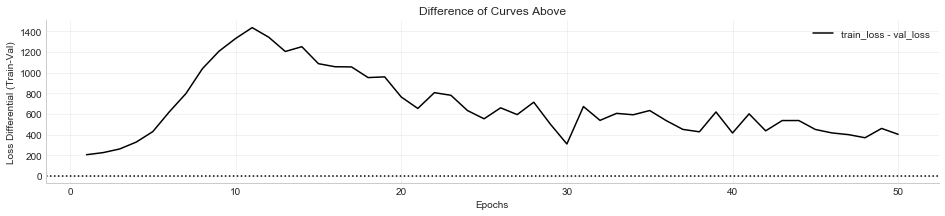


                Fully Connected Model - model 67 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 8
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.9979
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_851 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_852 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_579 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_853 (Dense)            (None, 6)                 42        
__________________________________________

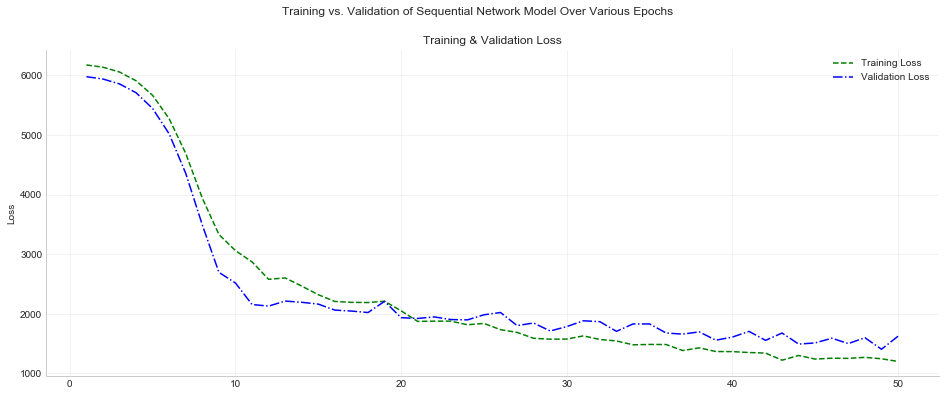

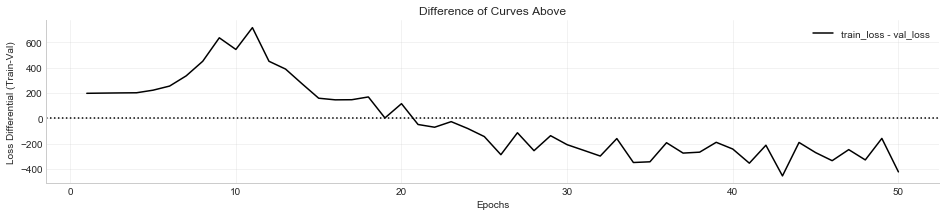


                Fully Connected Model - model 68 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 8
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.3351
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_861 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_862 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_587 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_863 (Dense)            (None, 6)                 42        
__________________________________________

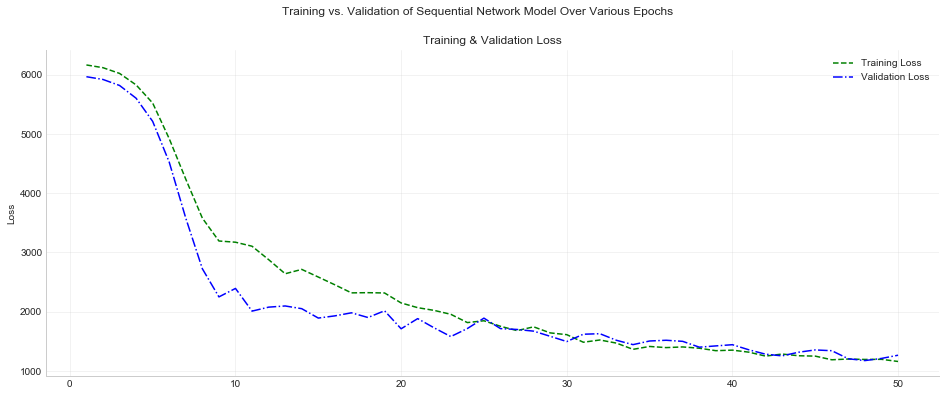

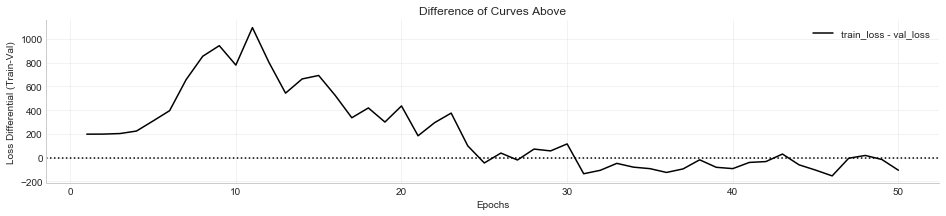


                Fully Connected Model - model 69 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 9
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = -8.0372
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_871 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_872 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_595 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_873 (Dense)            (None, 6)                 42        
__________________________________________

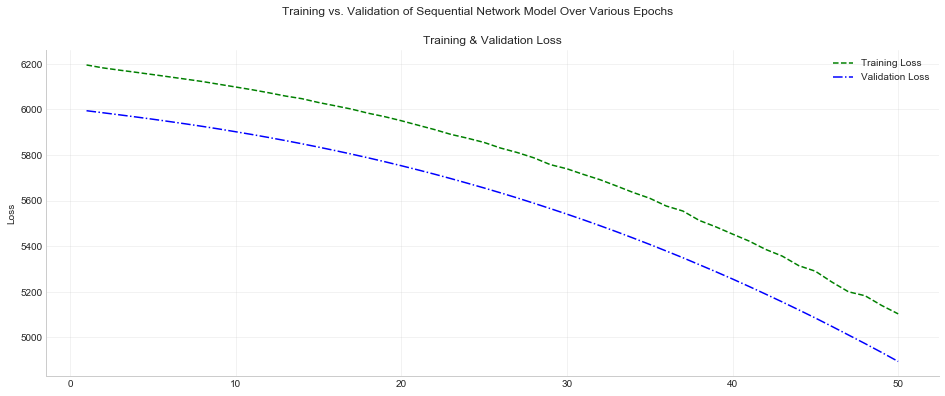

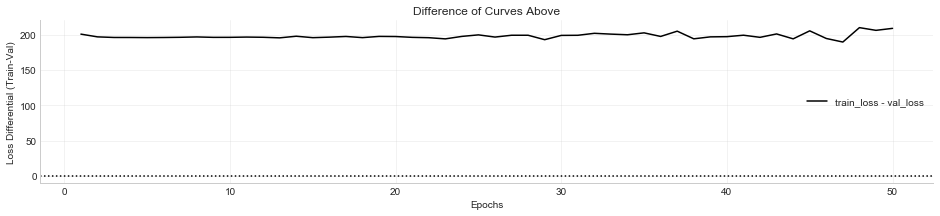


                Fully Connected Model - model 70 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 9
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.7281
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_882 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_883 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_604 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_884 (Dense)            (None, 6)                 42        
__________________________________________

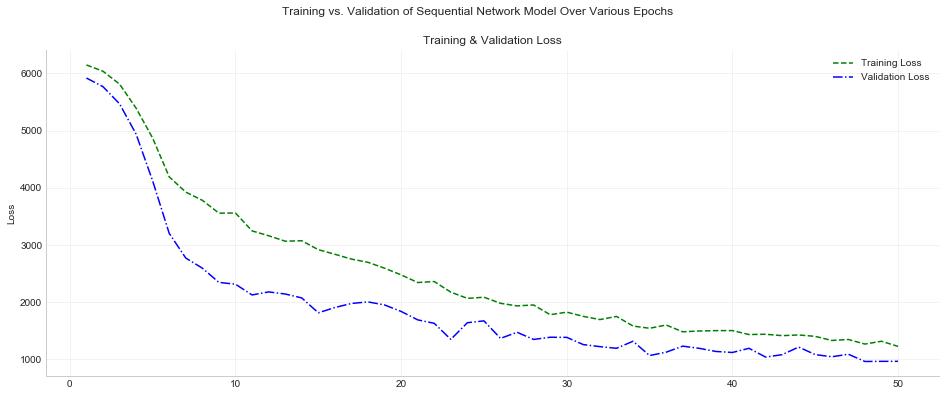

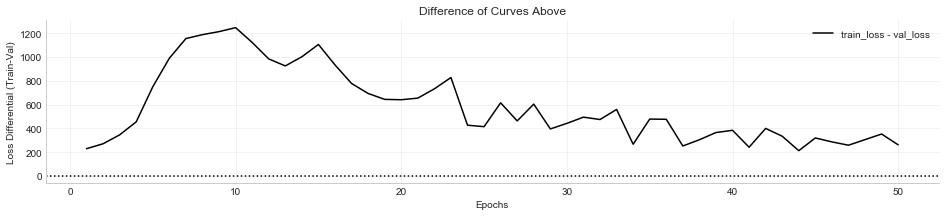


                Fully Connected Model - model 71 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 9
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.3778
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_893 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_894 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_613 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_895 (Dense)            (None, 6)                 42        
__________________________________________

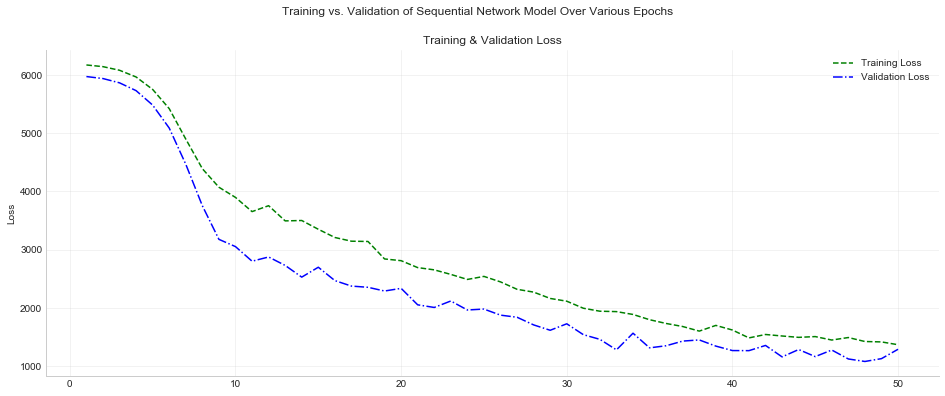

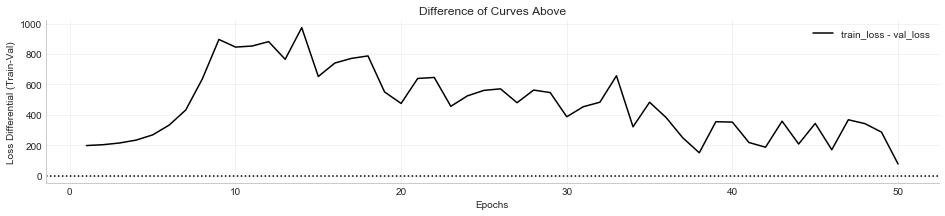


                Fully Connected Model - model 72 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 9
                 - Neurons per Layer:   6
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.7511
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_904 (Dense)            (None, 6)                 276       
_________________________________________________________________
dense_905 (Dense)            (None, 6)                 42        
_________________________________________________________________
dropout_622 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_906 (Dense)            (None, 6)                 42        
__________________________________________

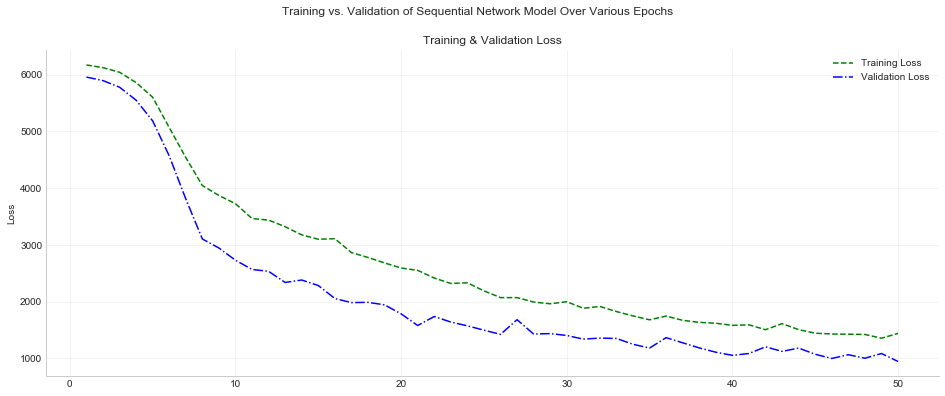

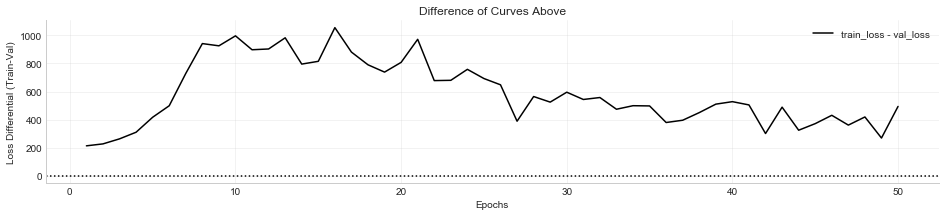


                Fully Connected Model - model 73 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 1
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.8411
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_915 (Dense)            (None, 8)                 368       
_________________________________________________________________
dense_916 (Dense)            (None, 8)                 72        
_________________________________________________________________
dropout_631 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_917 (Dense)            (None, 1)                 9         
Total params: 449
Trainable params: 449
Non

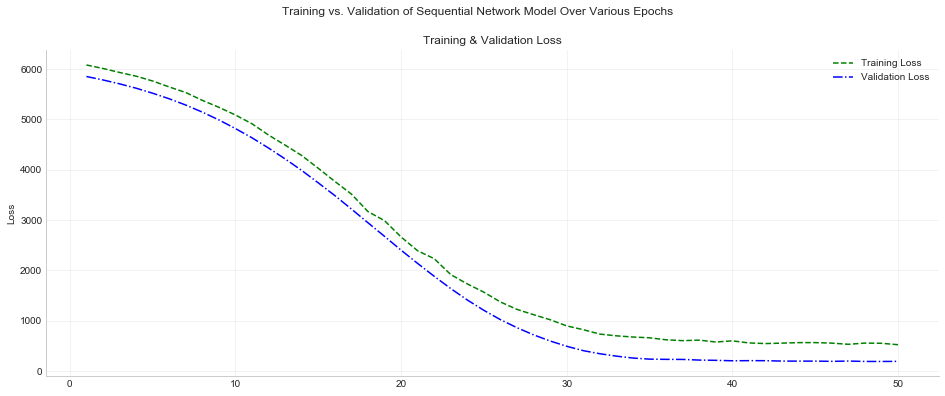

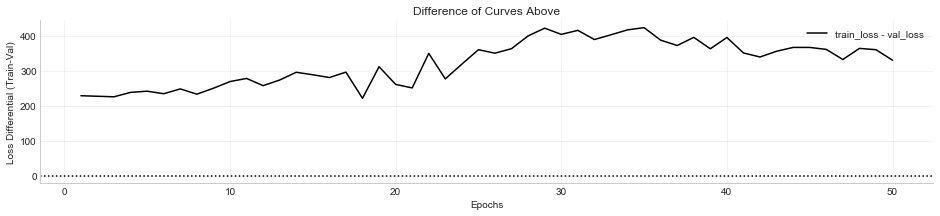


                Fully Connected Model - model 74 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 1
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.8608
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_918 (Dense)            (None, 8)                 368       
_________________________________________________________________
dense_919 (Dense)            (None, 8)                 72        
_________________________________________________________________
dropout_632 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_920 (Dense)            (None, 1)                 9         
Total params: 449
Trainable params: 449
Non

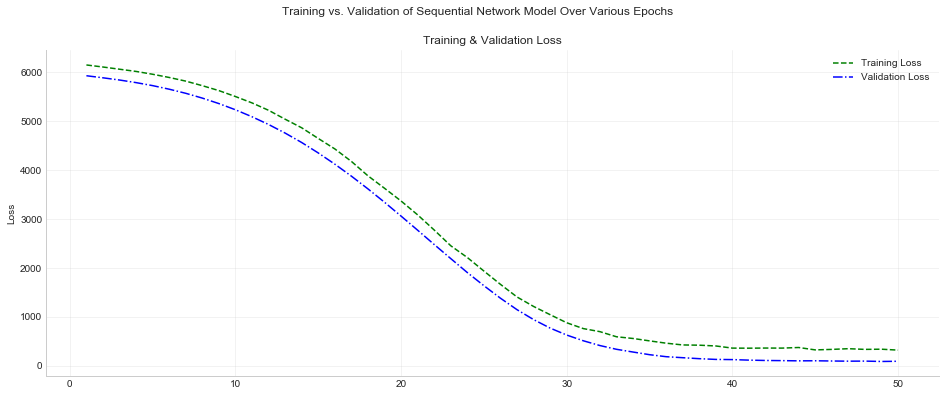

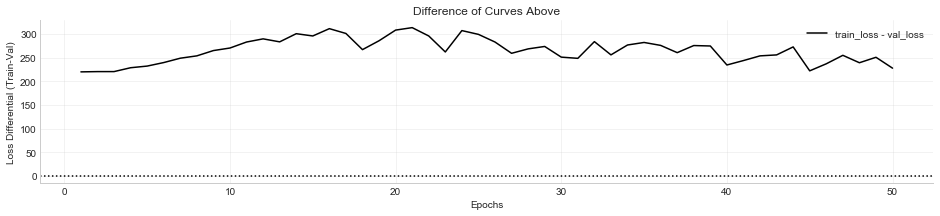


                Fully Connected Model - model 75 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 1
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.6712
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_921 (Dense)            (None, 8)                 368       
_________________________________________________________________
dense_922 (Dense)            (None, 8)                 72        
_________________________________________________________________
dropout_633 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_923 (Dense)            (None, 1)                 9         
Total params: 449
Trainable params: 449
Non

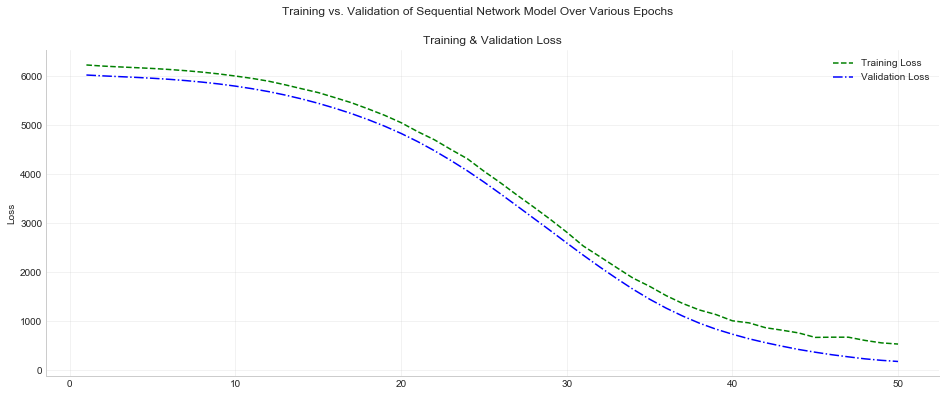

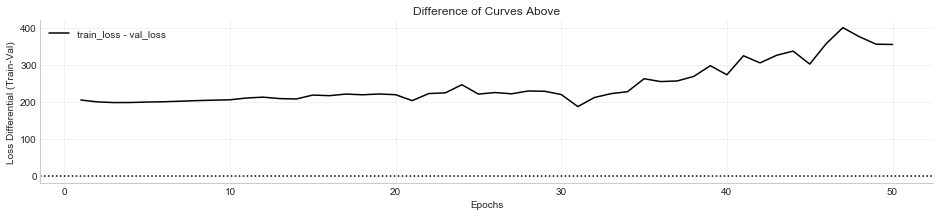


                Fully Connected Model - model 76 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 1
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.8548
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_924 (Dense)            (None, 8)                 368       
_________________________________________________________________
dense_925 (Dense)            (None, 8)                 72        
_________________________________________________________________
dropout_634 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_926 (Dense)            (None, 1)                 9         
Total params: 449
Trainable params: 449
Non

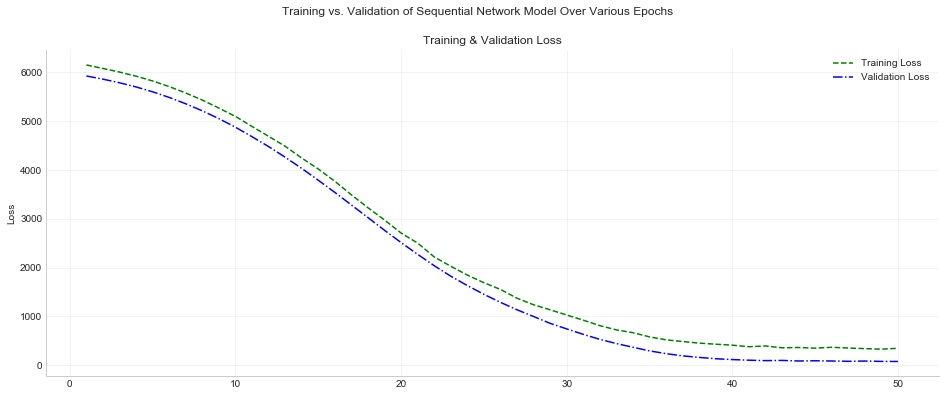

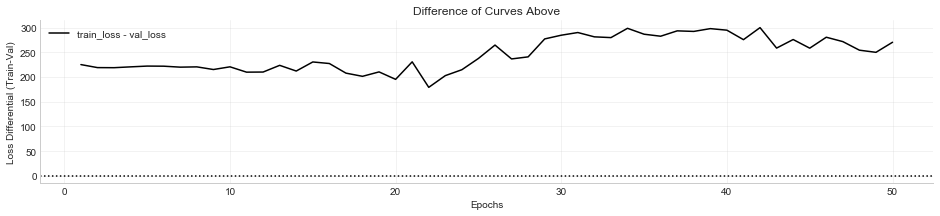


                Fully Connected Model - model 77 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 2
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.7828
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_927 (Dense)            (None, 8)                 368       
_________________________________________________________________
dense_928 (Dense)            (None, 8)                 72        
_________________________________________________________________
dropout_635 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_929 (Dense)            (None, 8)                 72        
___________________________________________

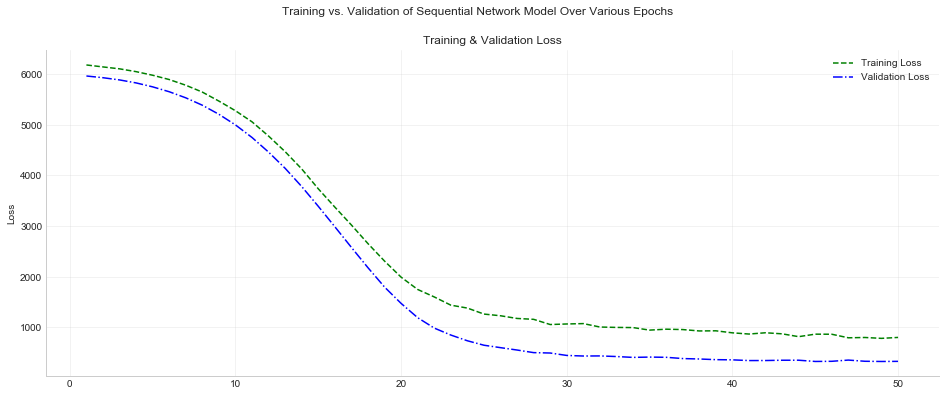

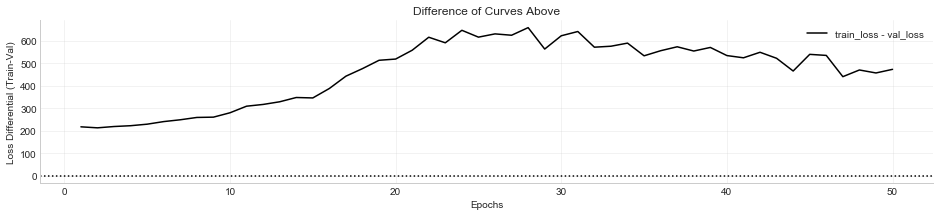


                Fully Connected Model - model 78 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 2
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.8295
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_931 (Dense)            (None, 8)                 368       
_________________________________________________________________
dense_932 (Dense)            (None, 8)                 72        
_________________________________________________________________
dropout_637 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_933 (Dense)            (None, 8)                 72        
___________________________________________

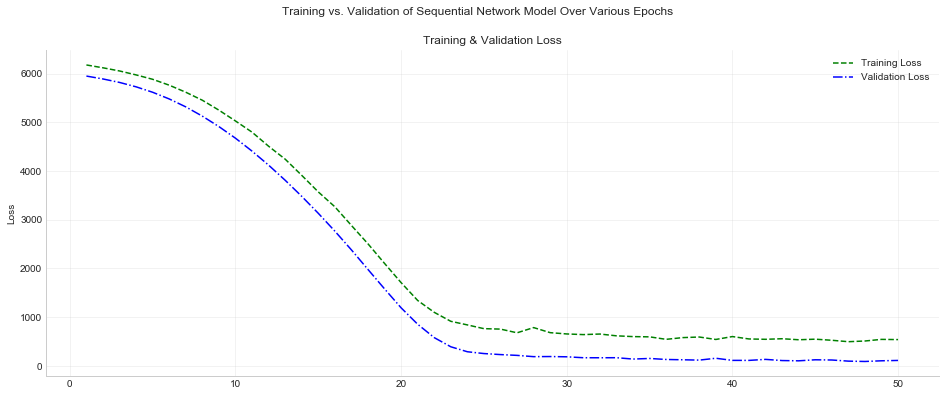

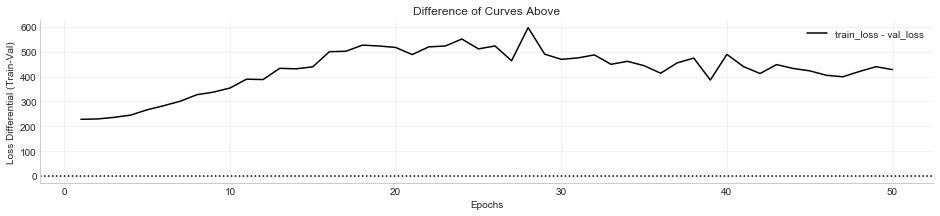


                Fully Connected Model - model 79 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 2
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.7093
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_935 (Dense)            (None, 8)                 368       
_________________________________________________________________
dense_936 (Dense)            (None, 8)                 72        
_________________________________________________________________
dropout_639 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_937 (Dense)            (None, 8)                 72        
___________________________________________

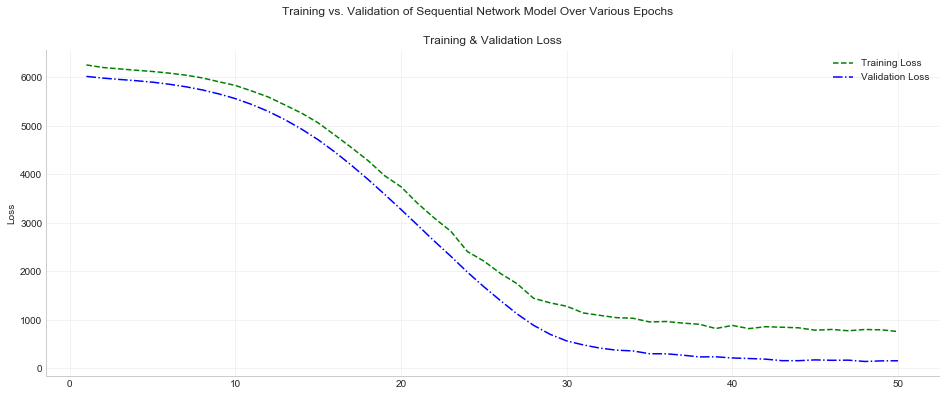

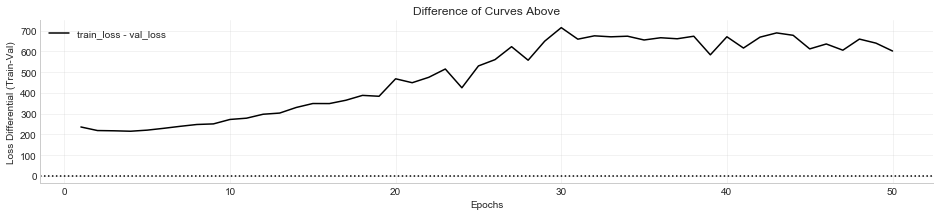


                Fully Connected Model - model 80 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 2
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.8098
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_939 (Dense)            (None, 8)                 368       
_________________________________________________________________
dense_940 (Dense)            (None, 8)                 72        
_________________________________________________________________
dropout_641 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_941 (Dense)            (None, 8)                 72        
___________________________________________

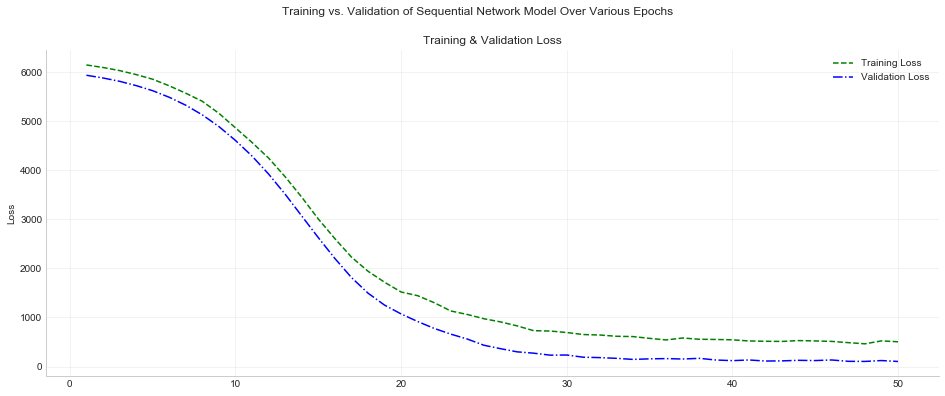

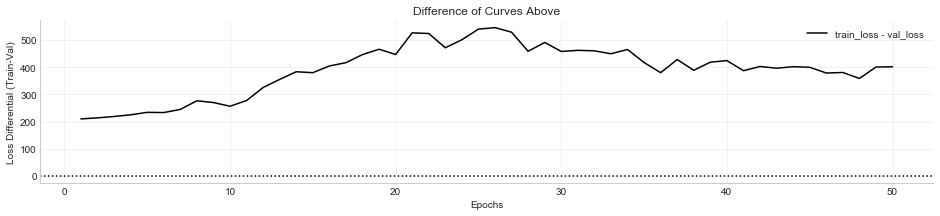


                Fully Connected Model - model 81 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 3
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.6522
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_943 (Dense)            (None, 8)                 368       
_________________________________________________________________
dense_944 (Dense)            (None, 8)                 72        
_________________________________________________________________
dropout_643 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_945 (Dense)            (None, 8)                 72        
___________________________________________

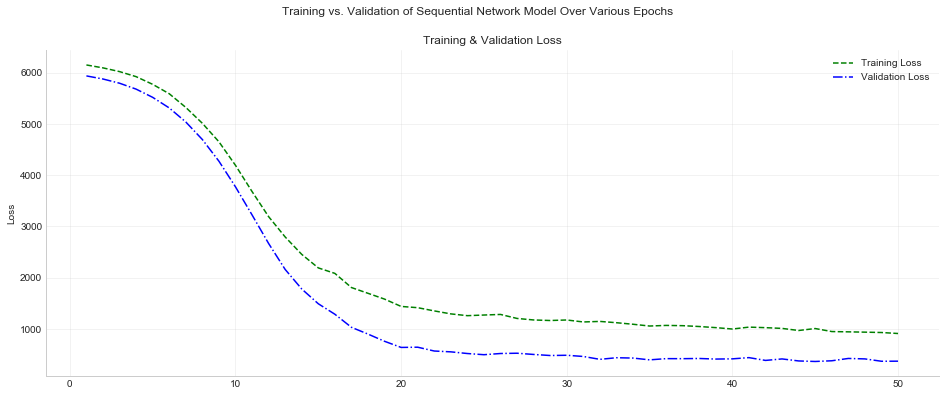

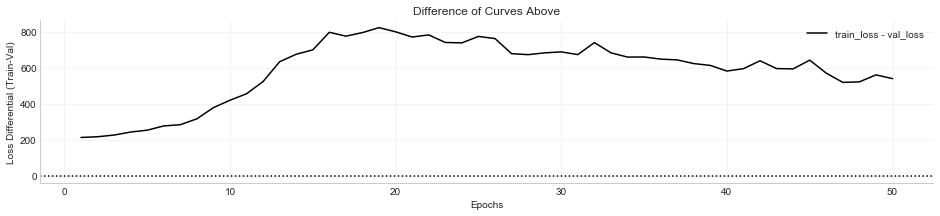


                Fully Connected Model - model 82 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 3
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.4616
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_948 (Dense)            (None, 8)                 368       
_________________________________________________________________
dense_949 (Dense)            (None, 8)                 72        
_________________________________________________________________
dropout_646 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_950 (Dense)            (None, 8)                 72        
___________________________________________

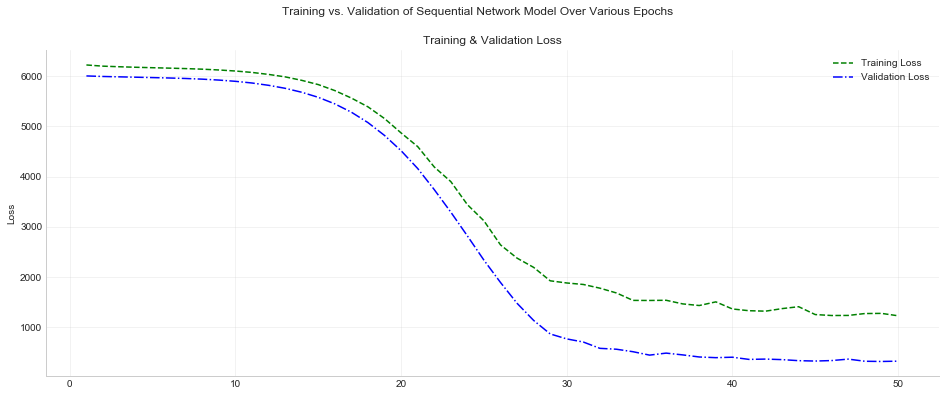

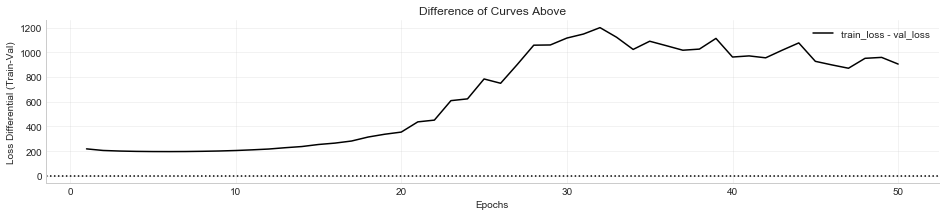


                Fully Connected Model - model 83 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 3
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.6199
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_953 (Dense)            (None, 8)                 368       
_________________________________________________________________
dense_954 (Dense)            (None, 8)                 72        
_________________________________________________________________
dropout_649 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_955 (Dense)            (None, 8)                 72        
___________________________________________

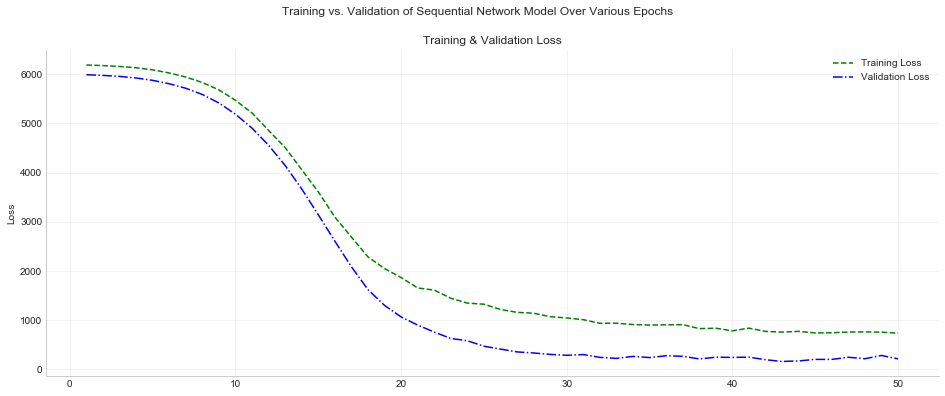

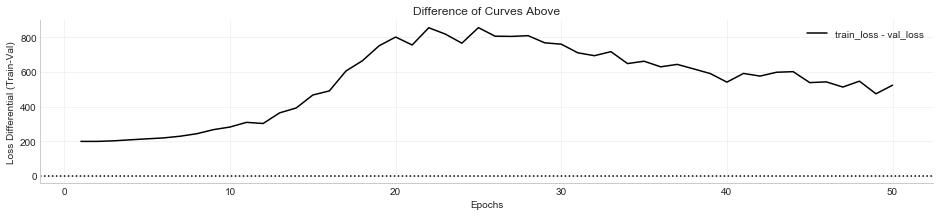


                Fully Connected Model - model 84 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 3
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.7360
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_958 (Dense)            (None, 8)                 368       
_________________________________________________________________
dense_959 (Dense)            (None, 8)                 72        
_________________________________________________________________
dropout_652 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_960 (Dense)            (None, 8)                 72        
___________________________________________

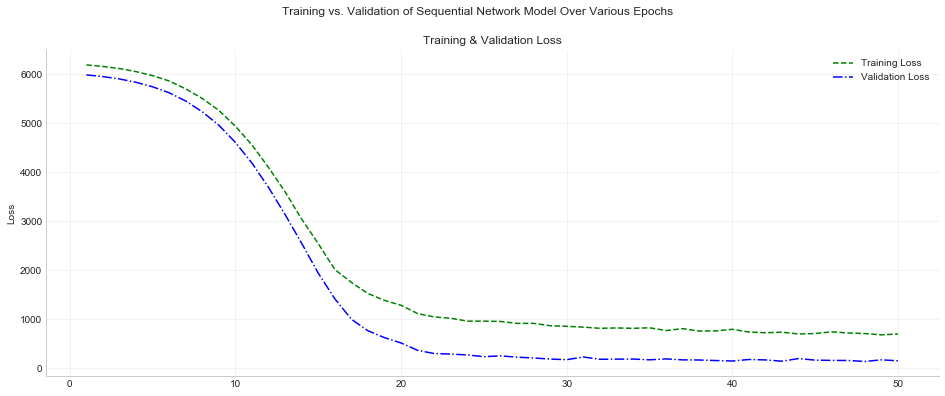

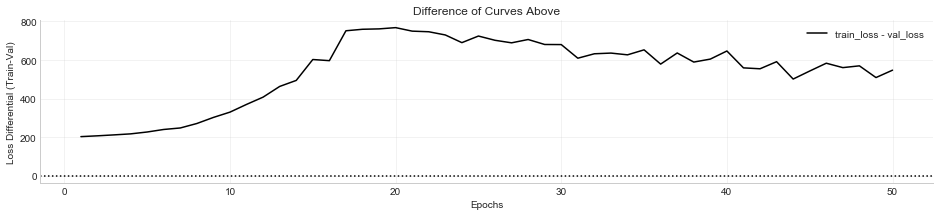


                Fully Connected Model - model 85 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 4
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.2441
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_963 (Dense)            (None, 8)                 368       
_________________________________________________________________
dense_964 (Dense)            (None, 8)                 72        
_________________________________________________________________
dropout_655 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_965 (Dense)            (None, 8)                 72        
___________________________________________

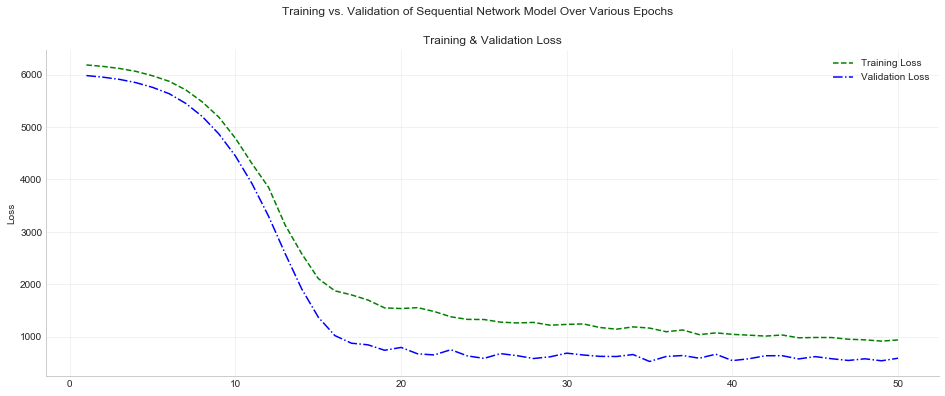

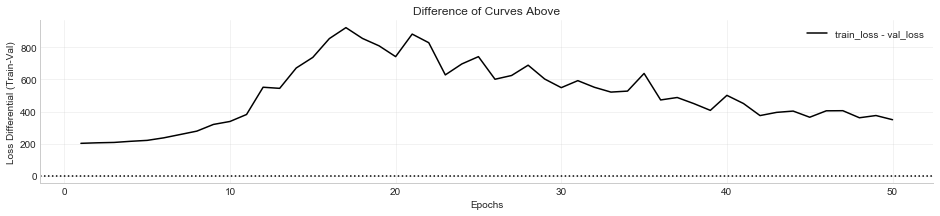


                Fully Connected Model - model 86 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 4
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.0094
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_969 (Dense)            (None, 8)                 368       
_________________________________________________________________
dense_970 (Dense)            (None, 8)                 72        
_________________________________________________________________
dropout_659 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_971 (Dense)            (None, 8)                 72        
___________________________________________

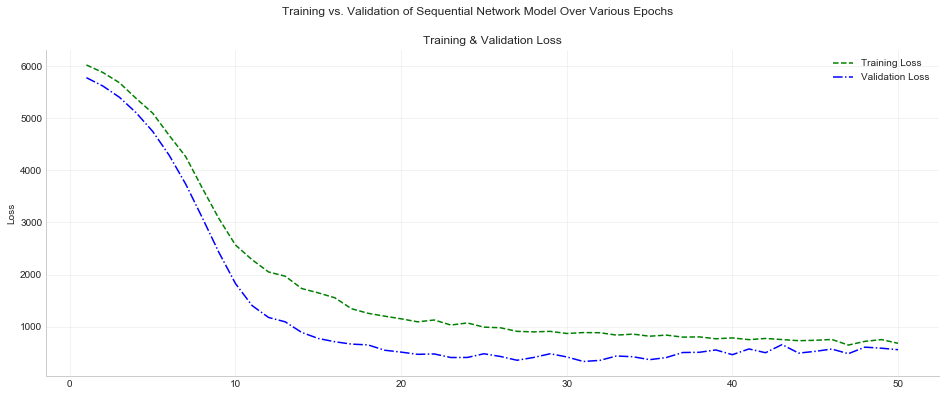

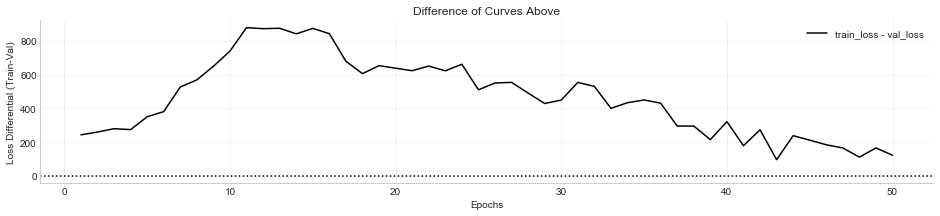


                Fully Connected Model - model 87 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 4
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.4294
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_975 (Dense)            (None, 8)                 368       
_________________________________________________________________
dense_976 (Dense)            (None, 8)                 72        
_________________________________________________________________
dropout_663 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_977 (Dense)            (None, 8)                 72        
___________________________________________

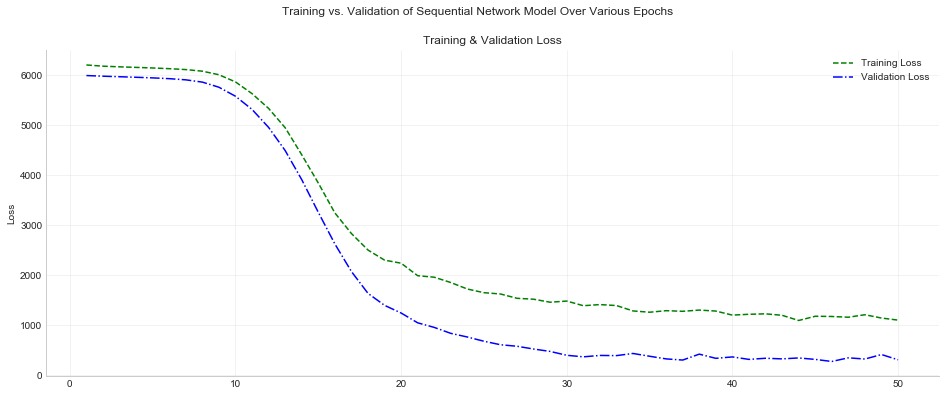

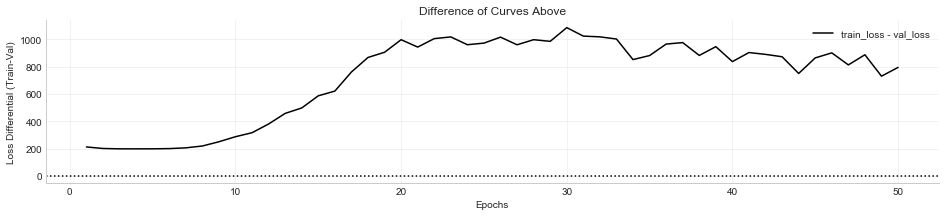


                Fully Connected Model - model 88 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 4
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.4053
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_981 (Dense)            (None, 8)                 368       
_________________________________________________________________
dense_982 (Dense)            (None, 8)                 72        
_________________________________________________________________
dropout_667 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_983 (Dense)            (None, 8)                 72        
___________________________________________

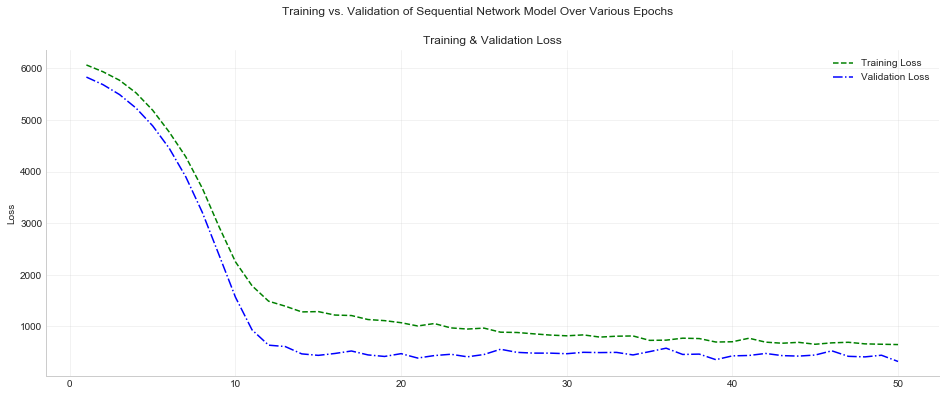

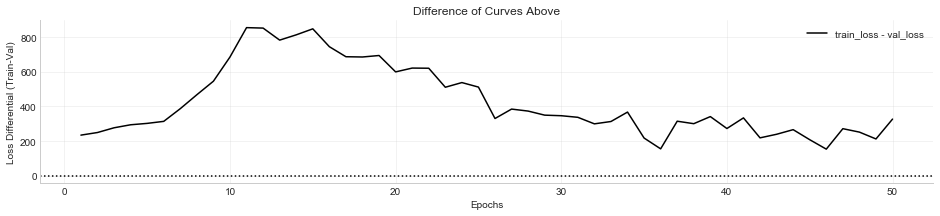


                Fully Connected Model - model 89 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 5
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.0971
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_987 (Dense)            (None, 8)                 368       
_________________________________________________________________
dense_988 (Dense)            (None, 8)                 72        
_________________________________________________________________
dropout_671 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_989 (Dense)            (None, 8)                 72        
___________________________________________

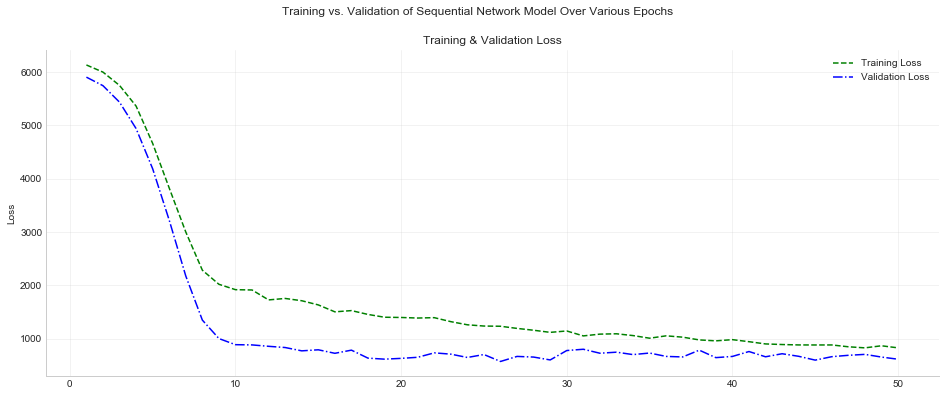

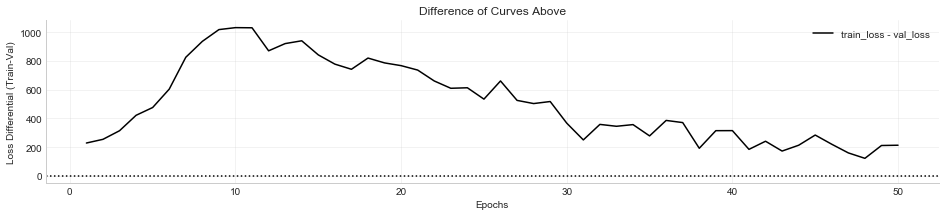


                Fully Connected Model - model 90 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 5
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.7833
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_994 (Dense)            (None, 8)                 368       
_________________________________________________________________
dense_995 (Dense)            (None, 8)                 72        
_________________________________________________________________
dropout_676 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_996 (Dense)            (None, 8)                 72        
__________________________________________

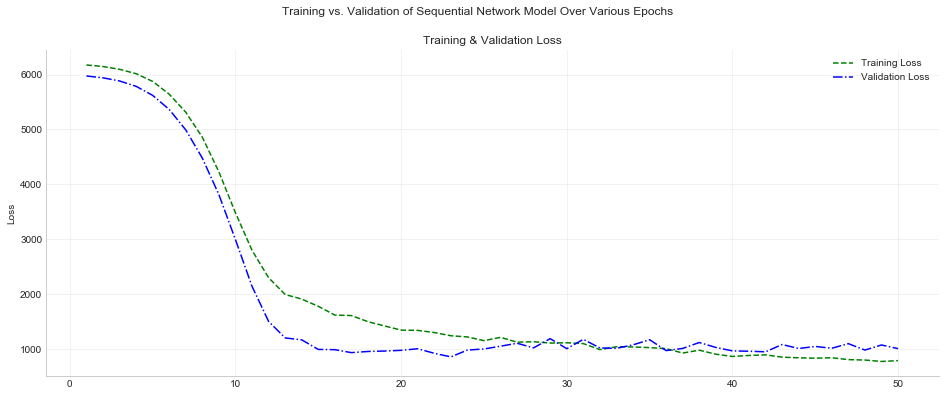

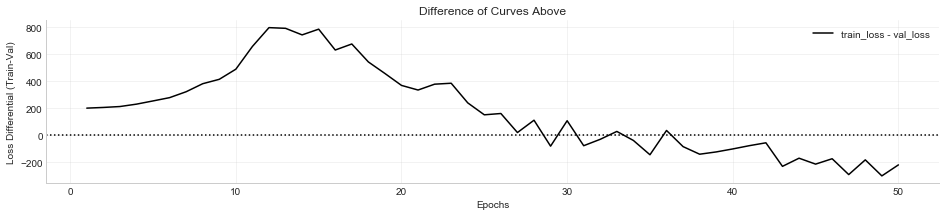


                Fully Connected Model - model 91 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 5
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.4366
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1001 (Dense)           (None, 8)                 368       
_________________________________________________________________
dense_1002 (Dense)           (None, 8)                 72        
_________________________________________________________________
dropout_681 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_1003 (Dense)           (None, 8)                 72        
__________________________________________

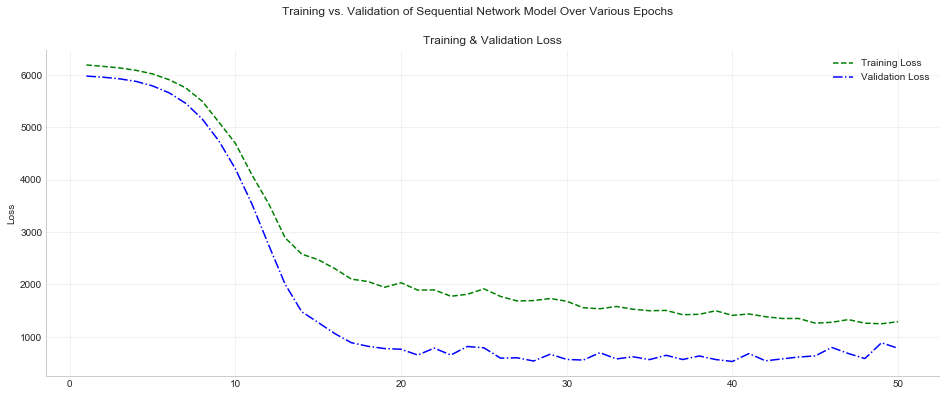

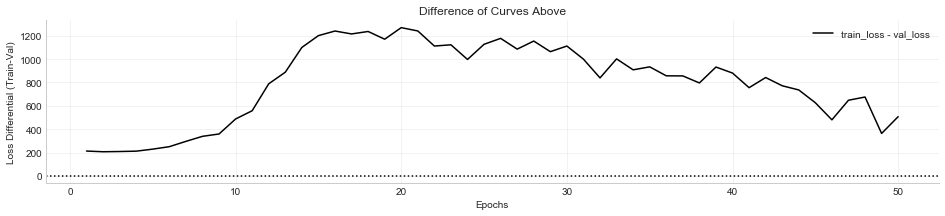


                Fully Connected Model - model 92 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 5
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.7660
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1008 (Dense)           (None, 8)                 368       
_________________________________________________________________
dense_1009 (Dense)           (None, 8)                 72        
_________________________________________________________________
dropout_686 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_1010 (Dense)           (None, 8)                 72        
__________________________________________

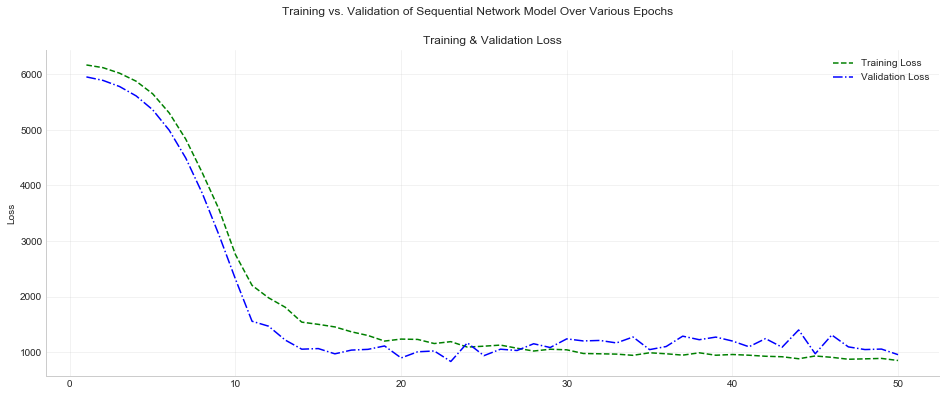

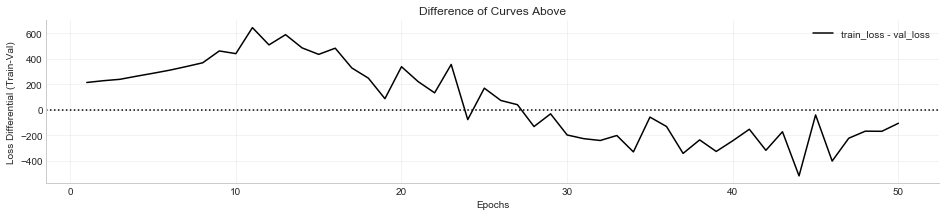


                Fully Connected Model - model 93 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 6
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.0562
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1015 (Dense)           (None, 8)                 368       
_________________________________________________________________
dense_1016 (Dense)           (None, 8)                 72        
_________________________________________________________________
dropout_691 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_1017 (Dense)           (None, 8)                 72        
__________________________________________

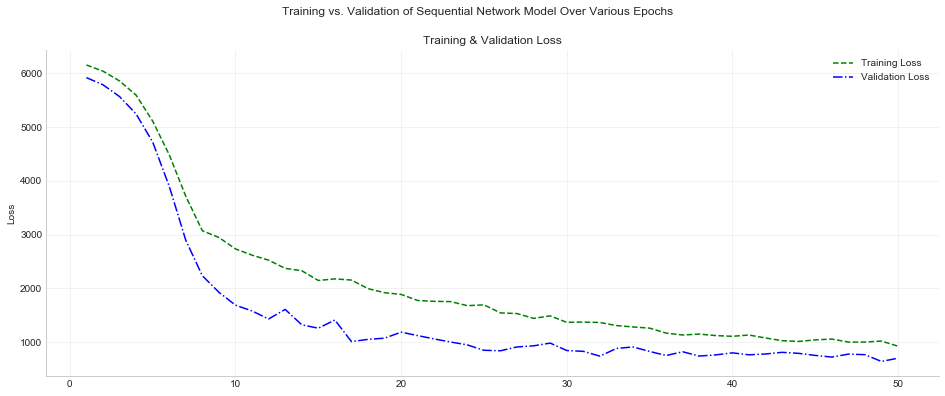

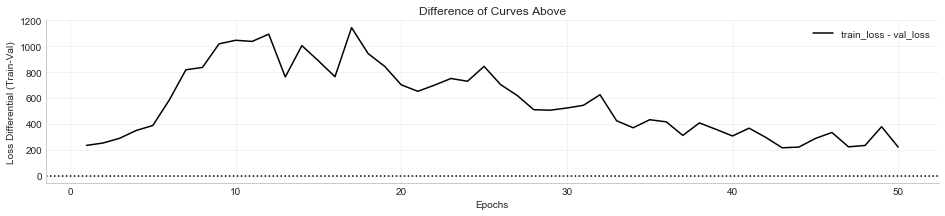


                Fully Connected Model - model 94 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 6
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.7810
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1023 (Dense)           (None, 8)                 368       
_________________________________________________________________
dense_1024 (Dense)           (None, 8)                 72        
_________________________________________________________________
dropout_697 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_1025 (Dense)           (None, 8)                 72        
__________________________________________

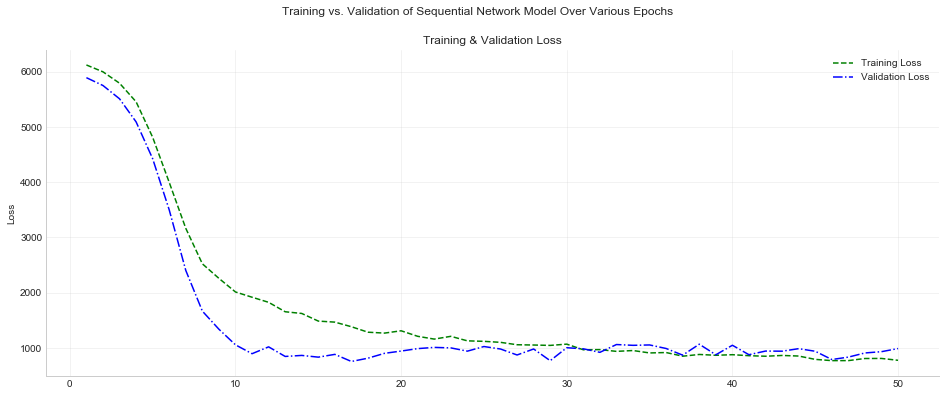

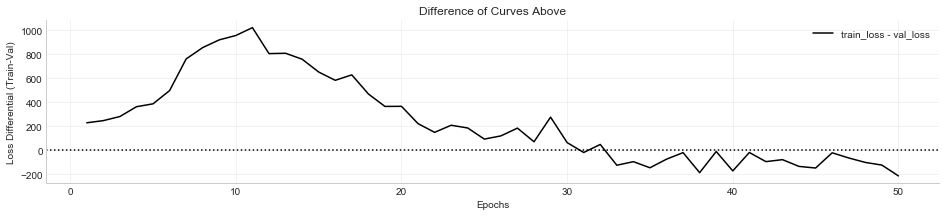


                Fully Connected Model - model 95 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 6
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.8728
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1031 (Dense)           (None, 8)                 368       
_________________________________________________________________
dense_1032 (Dense)           (None, 8)                 72        
_________________________________________________________________
dropout_703 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_1033 (Dense)           (None, 8)                 72        
__________________________________________

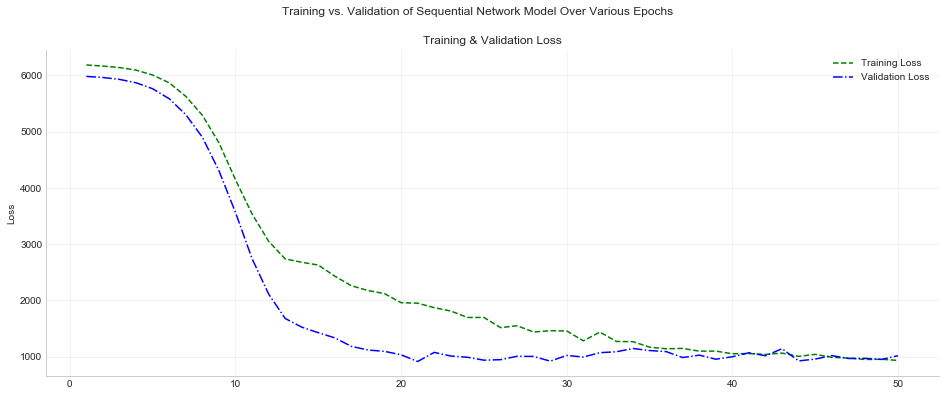

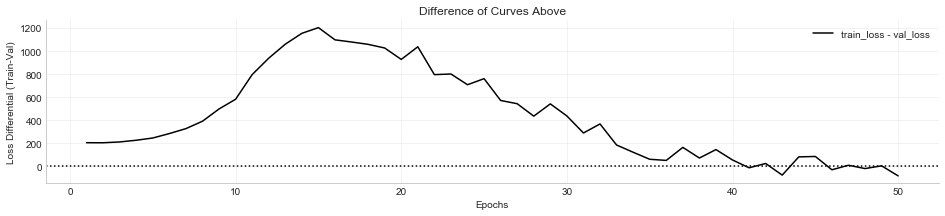


                Fully Connected Model - model 96 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 6
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.5444
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1039 (Dense)           (None, 8)                 368       
_________________________________________________________________
dense_1040 (Dense)           (None, 8)                 72        
_________________________________________________________________
dropout_709 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_1041 (Dense)           (None, 8)                 72        
__________________________________________

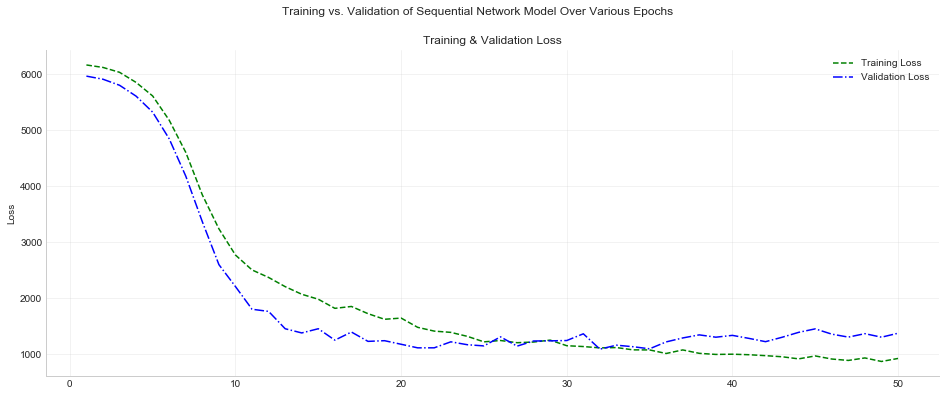

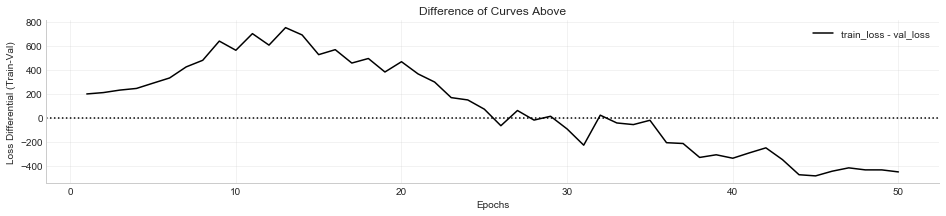


                Fully Connected Model - model 97 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 7
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.9580
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1047 (Dense)           (None, 8)                 368       
_________________________________________________________________
dense_1048 (Dense)           (None, 8)                 72        
_________________________________________________________________
dropout_715 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_1049 (Dense)           (None, 8)                 72        
__________________________________________

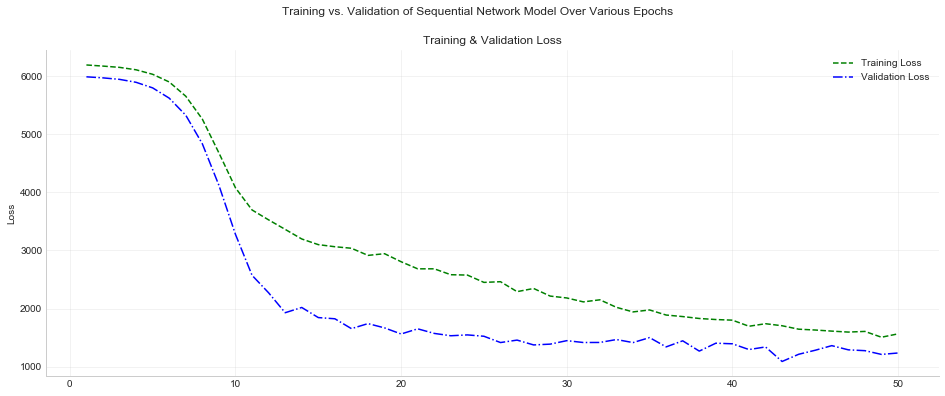

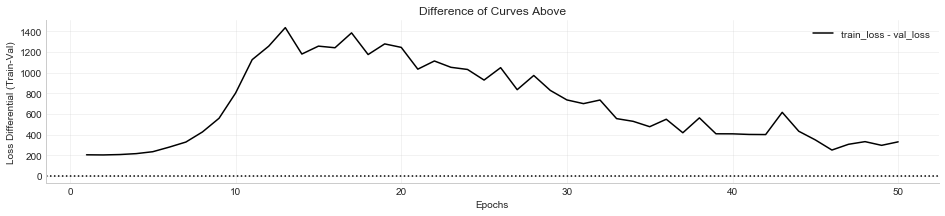


                Fully Connected Model - model 98 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 7
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.2279
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1056 (Dense)           (None, 8)                 368       
_________________________________________________________________
dense_1057 (Dense)           (None, 8)                 72        
_________________________________________________________________
dropout_722 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_1058 (Dense)           (None, 8)                 72        
__________________________________________

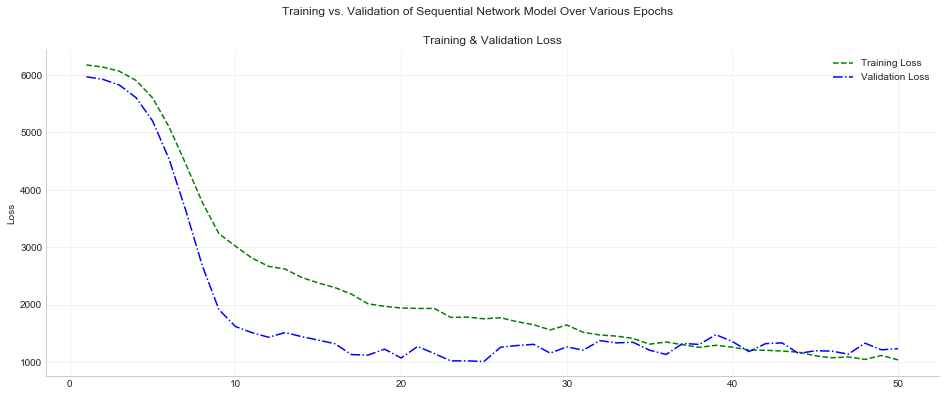

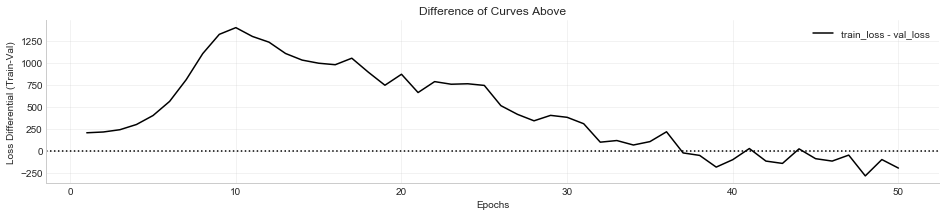


                Fully Connected Model - model 99 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 7
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.6814
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1065 (Dense)           (None, 8)                 368       
_________________________________________________________________
dense_1066 (Dense)           (None, 8)                 72        
_________________________________________________________________
dropout_729 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_1067 (Dense)           (None, 8)                 72        
__________________________________________

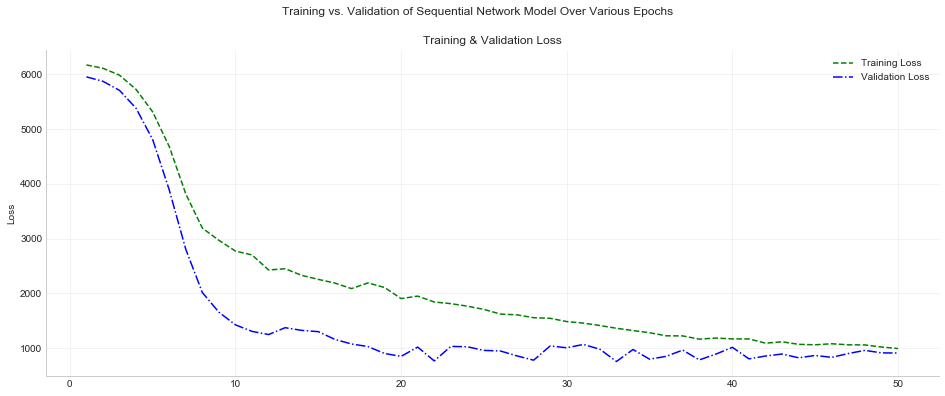

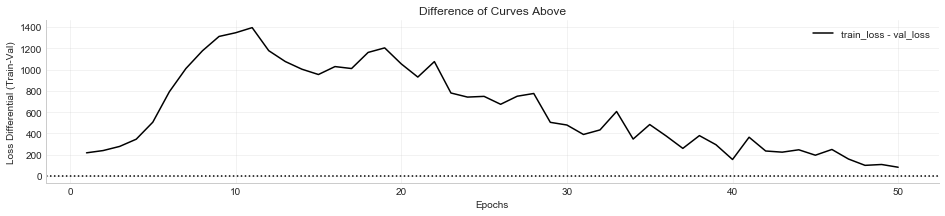


                Fully Connected Model - model 100 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 7
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.9348
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1074 (Dense)           (None, 8)                 368       
_________________________________________________________________
dense_1075 (Dense)           (None, 8)                 72        
_________________________________________________________________
dropout_736 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_1076 (Dense)           (None, 8)                 72        
_________________________________________

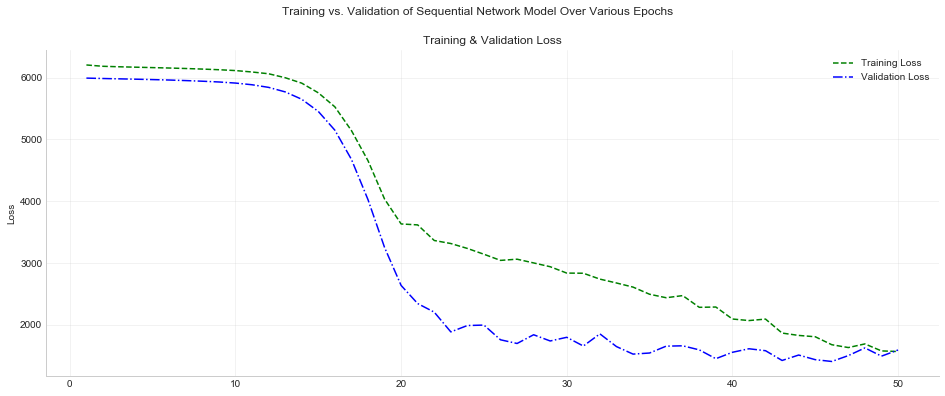

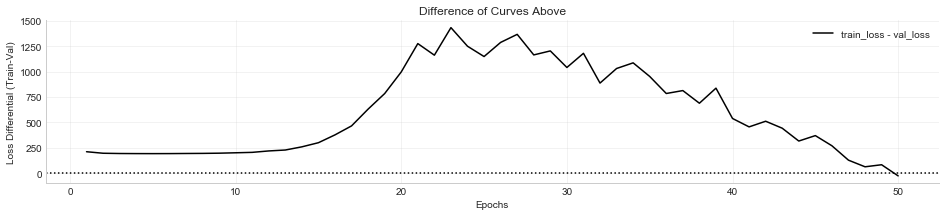


                Fully Connected Model - model 101 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 8
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.3988
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1083 (Dense)           (None, 8)                 368       
_________________________________________________________________
dense_1084 (Dense)           (None, 8)                 72        
_________________________________________________________________
dropout_743 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_1085 (Dense)           (None, 8)                 72        
_________________________________________

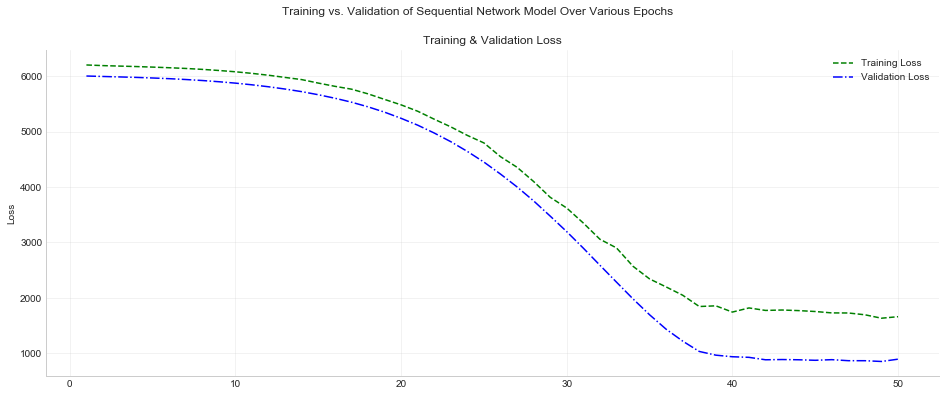

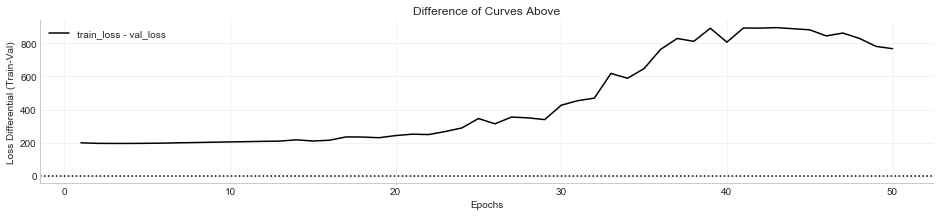


                Fully Connected Model - model 102 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 8
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.9131
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1093 (Dense)           (None, 8)                 368       
_________________________________________________________________
dense_1094 (Dense)           (None, 8)                 72        
_________________________________________________________________
dropout_751 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_1095 (Dense)           (None, 8)                 72        
_________________________________________

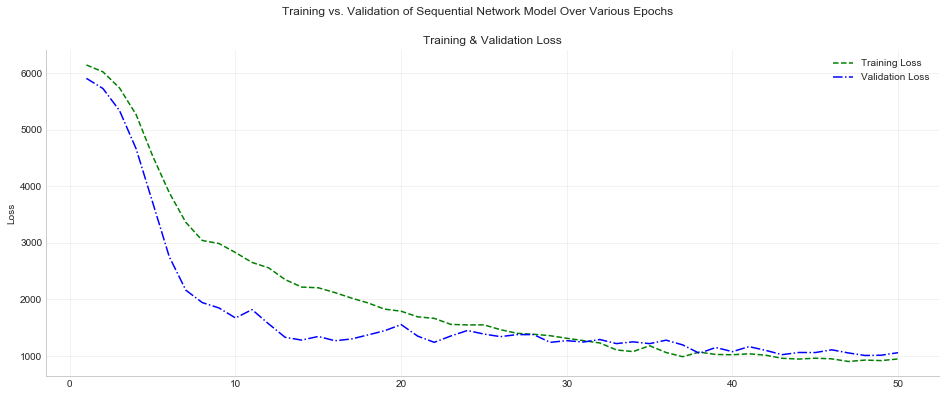

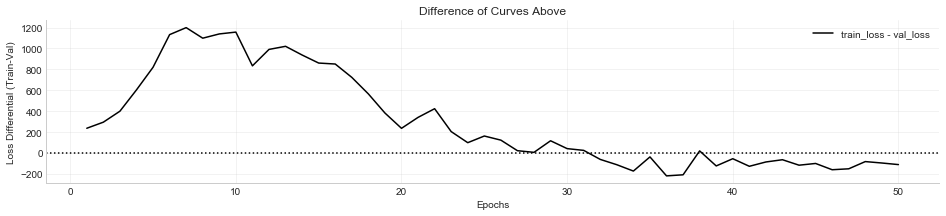


                Fully Connected Model - model 103 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 8
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.5327
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1103 (Dense)           (None, 8)                 368       
_________________________________________________________________
dense_1104 (Dense)           (None, 8)                 72        
_________________________________________________________________
dropout_759 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_1105 (Dense)           (None, 8)                 72        
_________________________________________

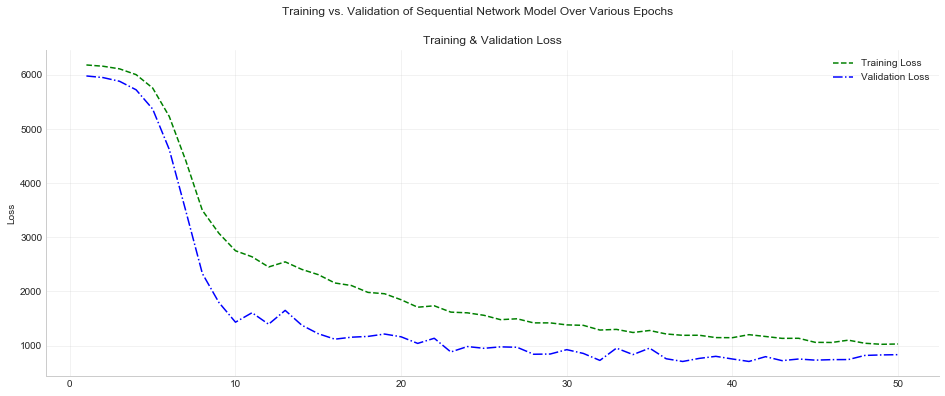

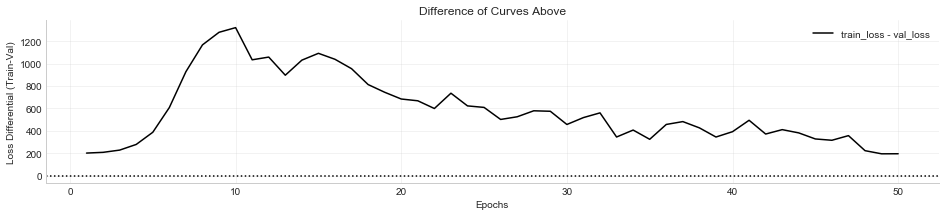


                Fully Connected Model - model 104 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 8
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.6235
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1113 (Dense)           (None, 8)                 368       
_________________________________________________________________
dense_1114 (Dense)           (None, 8)                 72        
_________________________________________________________________
dropout_767 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_1115 (Dense)           (None, 8)                 72        
_________________________________________

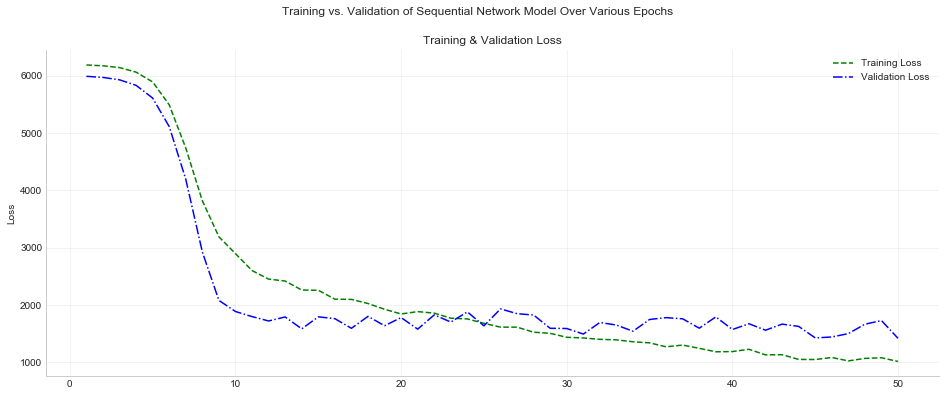

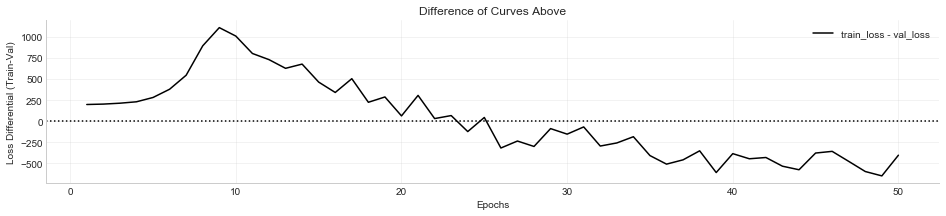


                Fully Connected Model - model 105 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 9
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.3941
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1123 (Dense)           (None, 8)                 368       
_________________________________________________________________
dense_1124 (Dense)           (None, 8)                 72        
_________________________________________________________________
dropout_775 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_1125 (Dense)           (None, 8)                 72        
__________________________________________

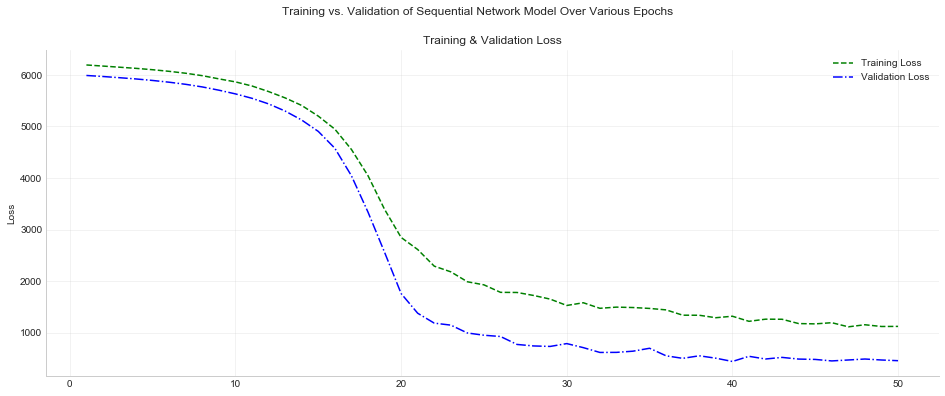

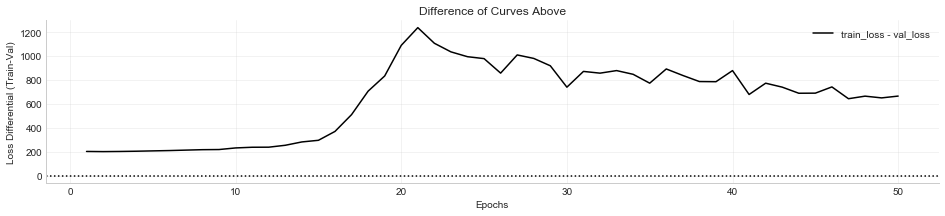


                Fully Connected Model - model 106 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 9
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.8581
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1134 (Dense)           (None, 8)                 368       
_________________________________________________________________
dense_1135 (Dense)           (None, 8)                 72        
_________________________________________________________________
dropout_784 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_1136 (Dense)           (None, 8)                 72        
_________________________________________

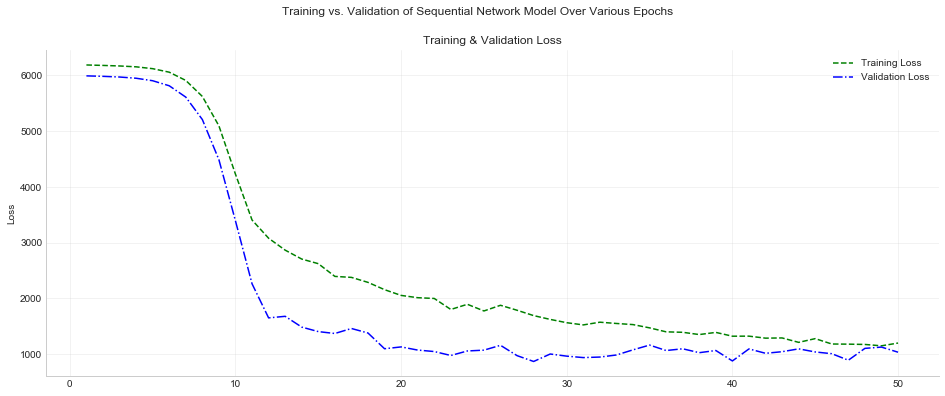

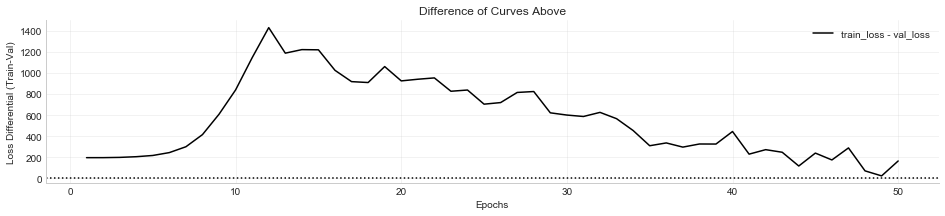


                Fully Connected Model - model 107 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 9
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.8770
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1145 (Dense)           (None, 8)                 368       
_________________________________________________________________
dense_1146 (Dense)           (None, 8)                 72        
_________________________________________________________________
dropout_793 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_1147 (Dense)           (None, 8)                 72        
_________________________________________

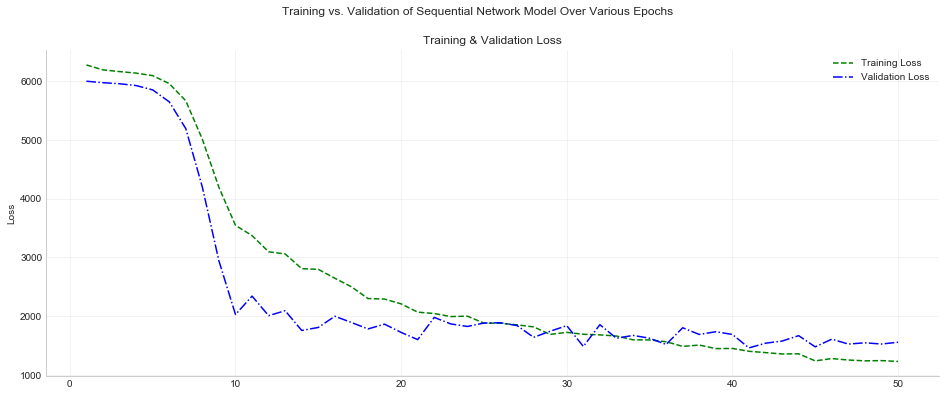

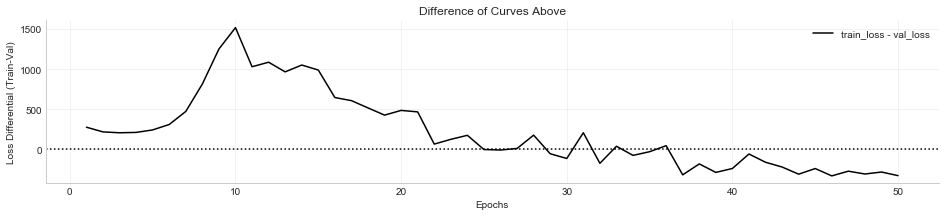


                Fully Connected Model - model 108 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 9
                 - Neurons per Layer:   8
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.5882
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1156 (Dense)           (None, 8)                 368       
_________________________________________________________________
dense_1157 (Dense)           (None, 8)                 72        
_________________________________________________________________
dropout_802 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_1158 (Dense)           (None, 8)                 72        
_________________________________________

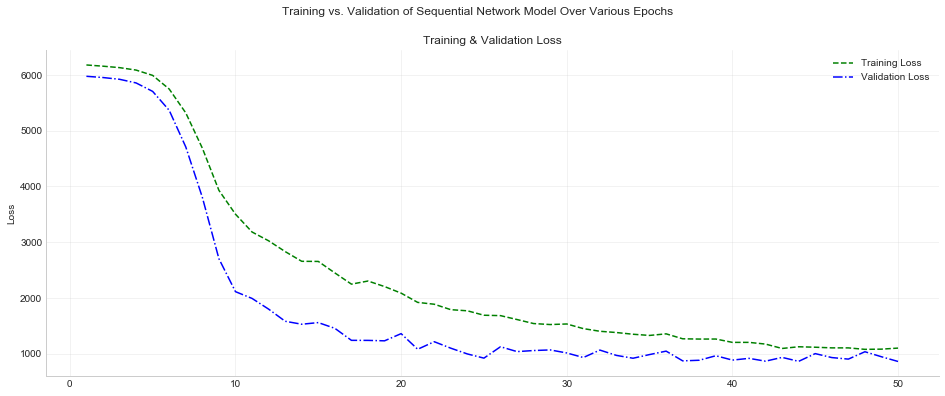

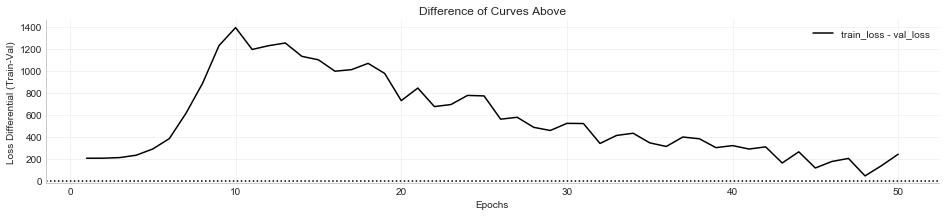


                Fully Connected Model - model 109 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 1
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.8665
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1167 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1168 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_811 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1169 (Dense)           (None, 1)                 11        
Total params: 581
Trainable params: 581
N

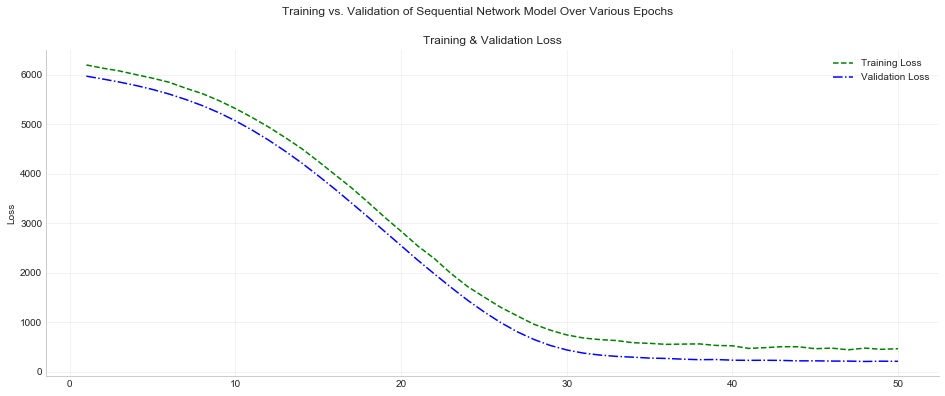

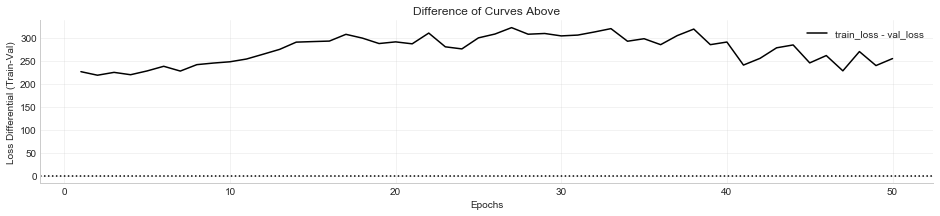


                Fully Connected Model - model 110 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 1
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.8645
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1170 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1171 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_812 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1172 (Dense)           (None, 1)                 11        
Total params: 581
Trainable params: 581
N

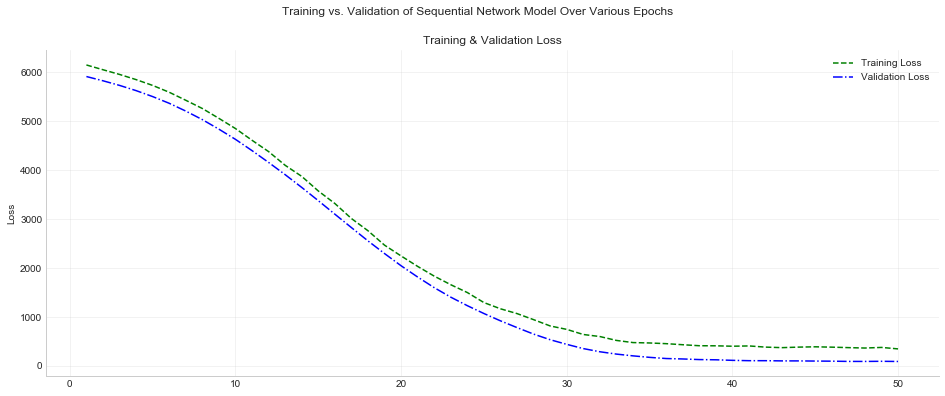

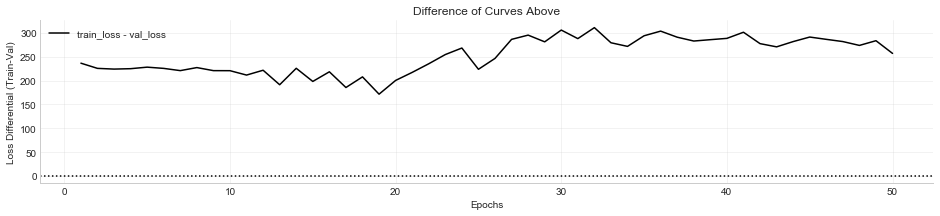


                Fully Connected Model - model 111 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 1
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.8504
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1173 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1174 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_813 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1175 (Dense)           (None, 1)                 11        
Total params: 581
Trainable params: 581
N

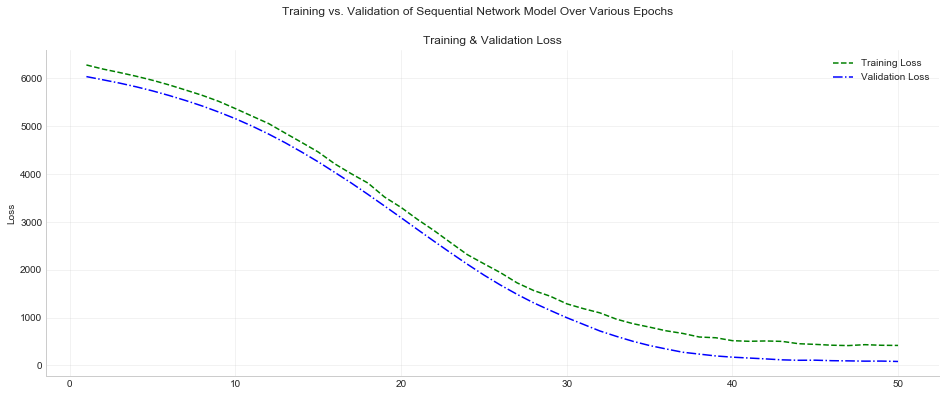

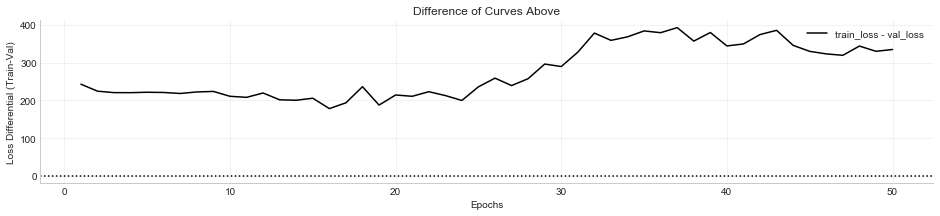


                Fully Connected Model - model 112 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 1
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.8952
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1176 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1177 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_814 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1178 (Dense)           (None, 1)                 11        
Total params: 581
Trainable params: 581
N

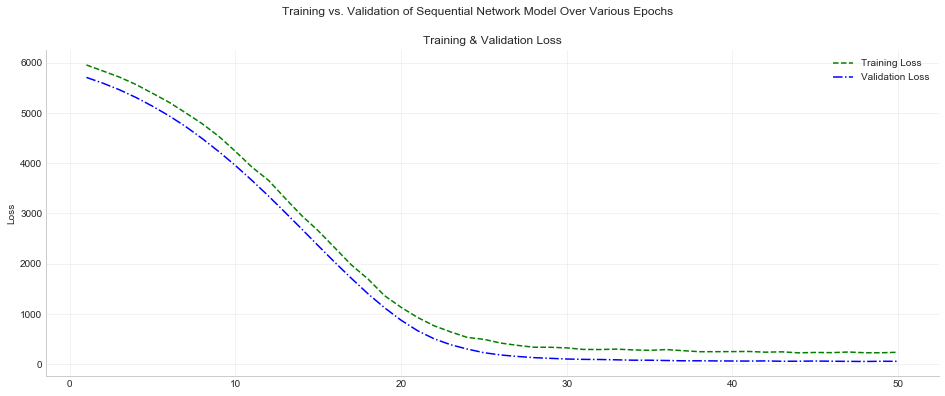

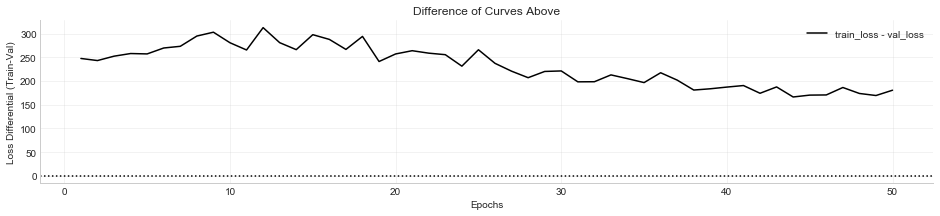


                Fully Connected Model - model 113 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 2
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.8362
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1179 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1180 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_815 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1181 (Dense)           (None, 10)                110       
_________________________________________

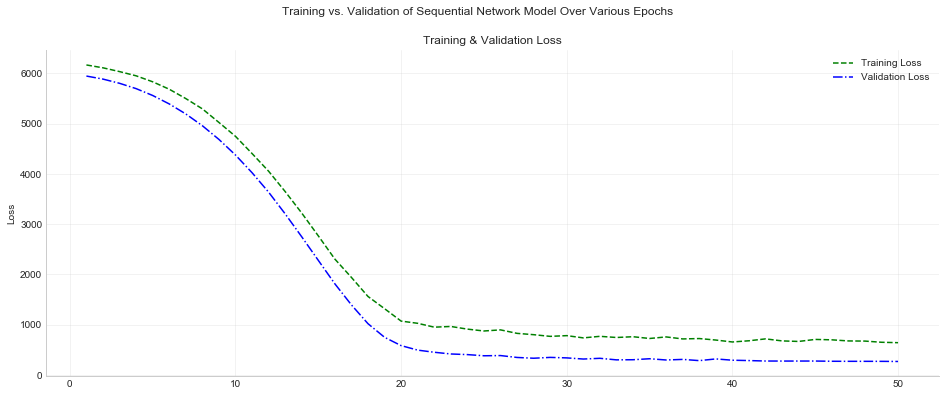

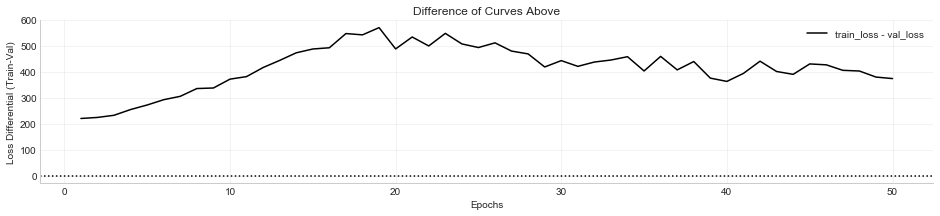


                Fully Connected Model - model 114 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 2
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.7770
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1183 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1184 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_817 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1185 (Dense)           (None, 10)                110       
_________________________________________

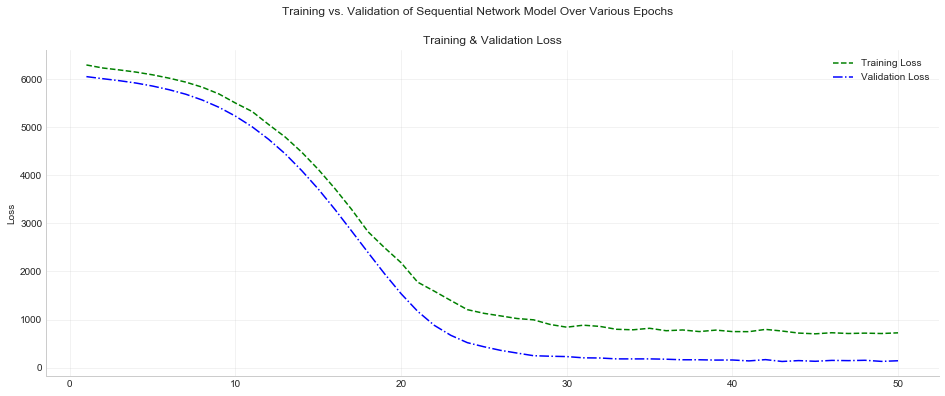

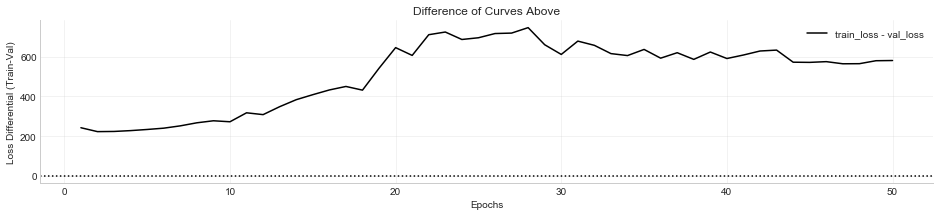


                Fully Connected Model - model 115 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 2
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.8818
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1187 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1188 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_819 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1189 (Dense)           (None, 10)                110       
_________________________________________

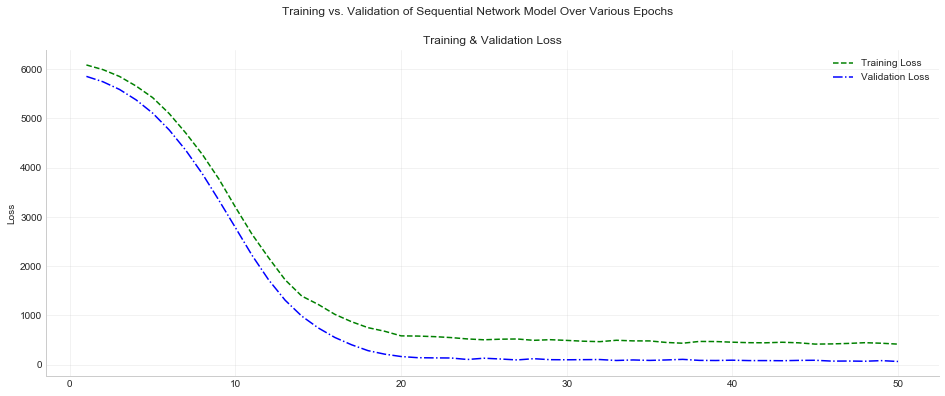

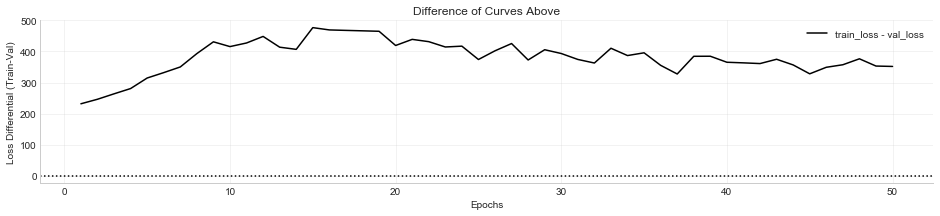


                Fully Connected Model - model 116 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 2
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.7813
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1191 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1192 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_821 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1193 (Dense)           (None, 10)                110       
_________________________________________

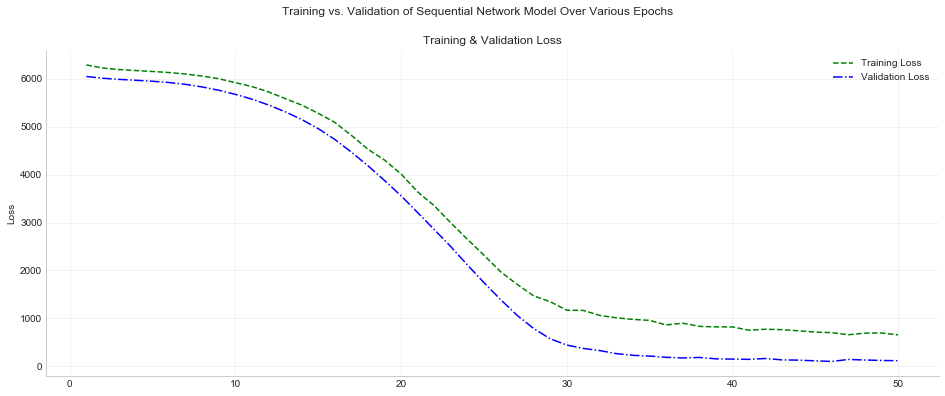

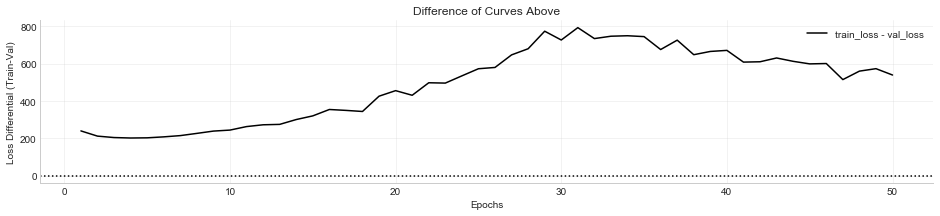


                Fully Connected Model - model 117 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 3
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.8353
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1195 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1196 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_823 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1197 (Dense)           (None, 10)                110       
_________________________________________

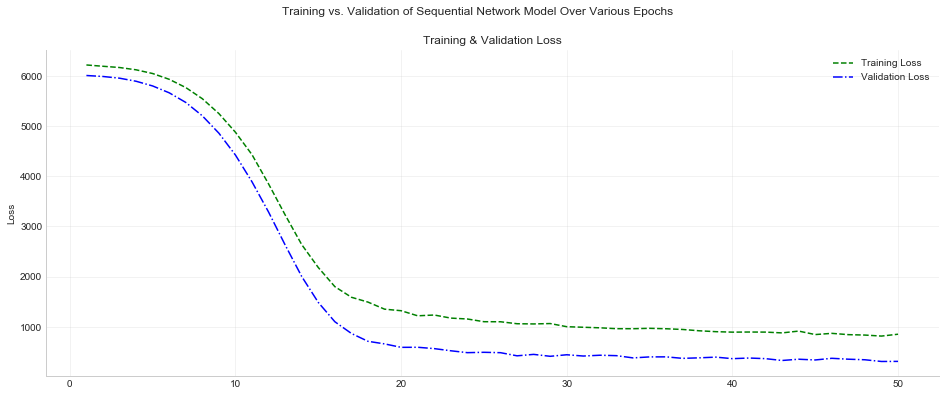

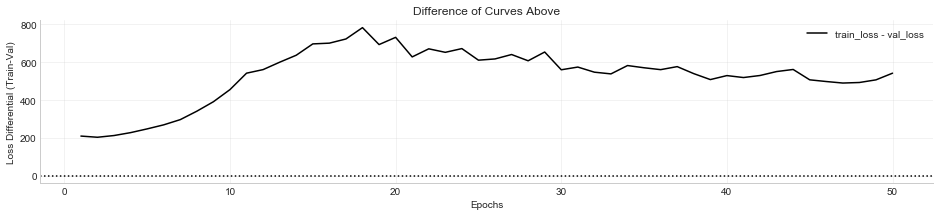


                Fully Connected Model - model 118 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 3
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.7176
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1200 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1201 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_826 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1202 (Dense)           (None, 10)                110       
_________________________________________

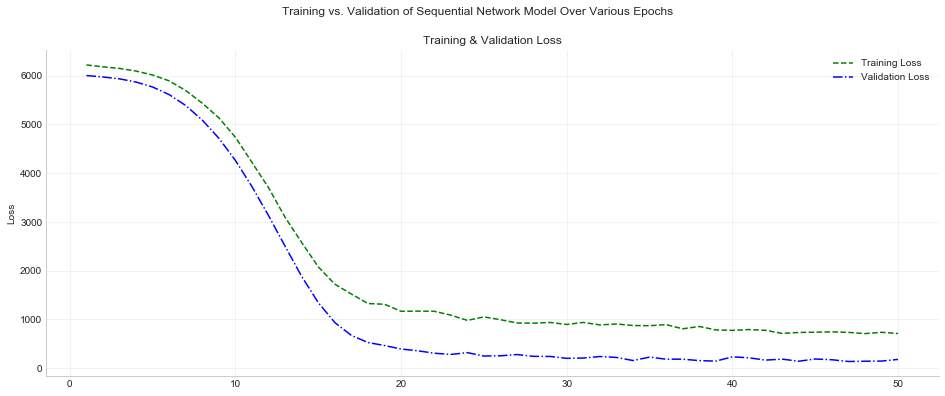

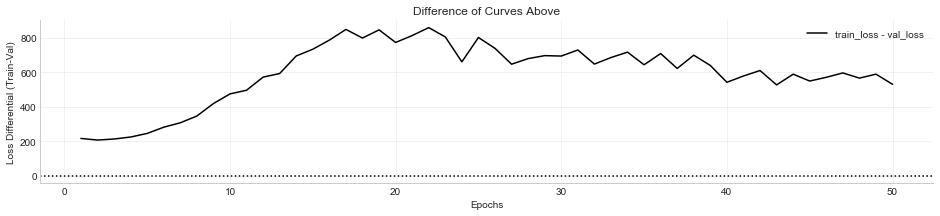


                Fully Connected Model - model 119 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 3
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.7056
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1205 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1206 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_829 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1207 (Dense)           (None, 10)                110       
_________________________________________

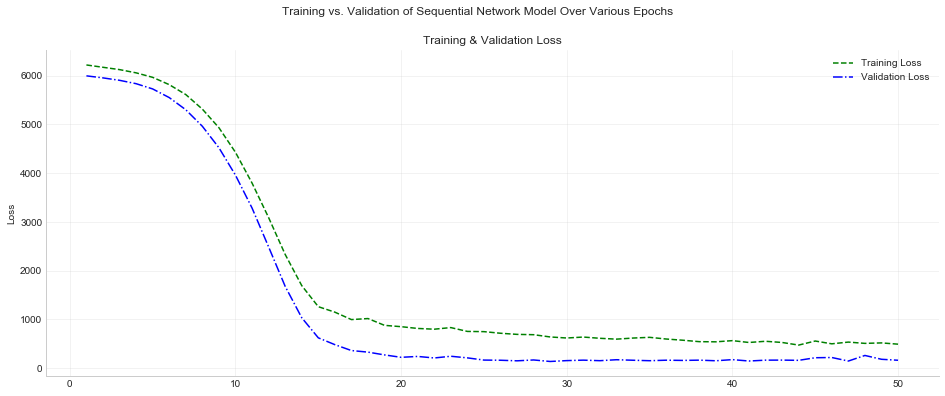

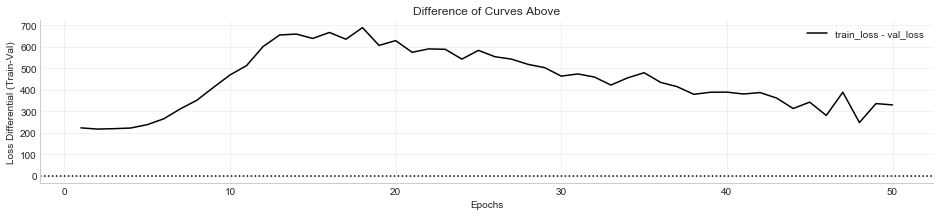


                Fully Connected Model - model 120 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 3
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.7407
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1210 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1211 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_832 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1212 (Dense)           (None, 10)                110       
_________________________________________

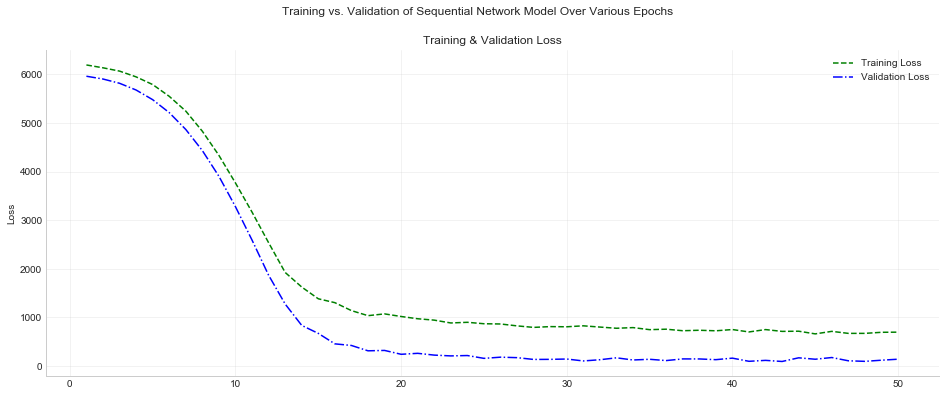

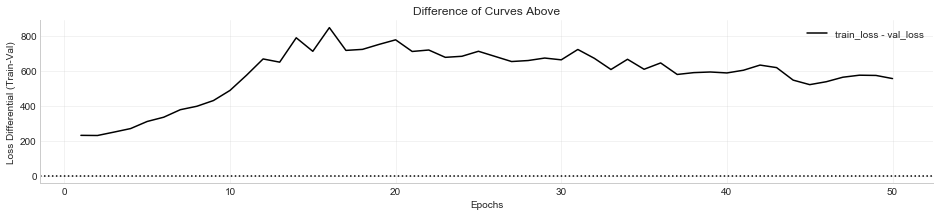


                Fully Connected Model - model 121 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 4
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.5229
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1215 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1216 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_835 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1217 (Dense)           (None, 10)                110       
_________________________________________

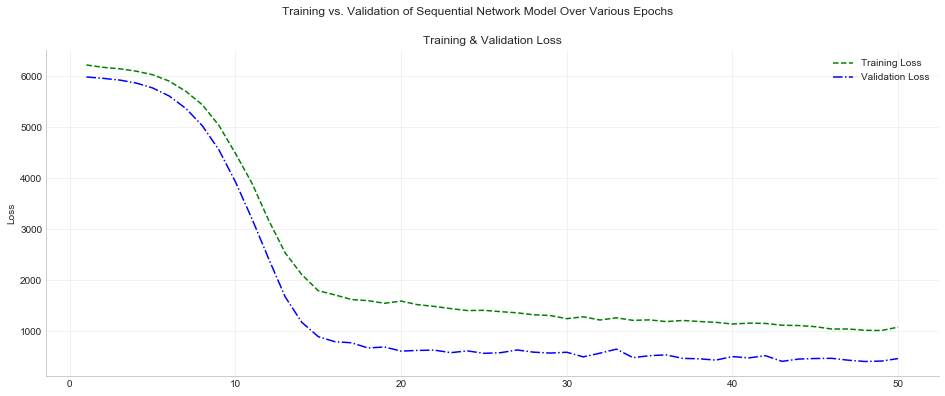

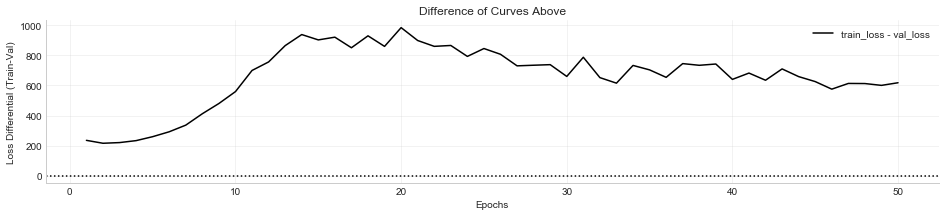


                Fully Connected Model - model 122 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 4
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.0043
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1221 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1222 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_839 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1223 (Dense)           (None, 10)                110       
________________________________________

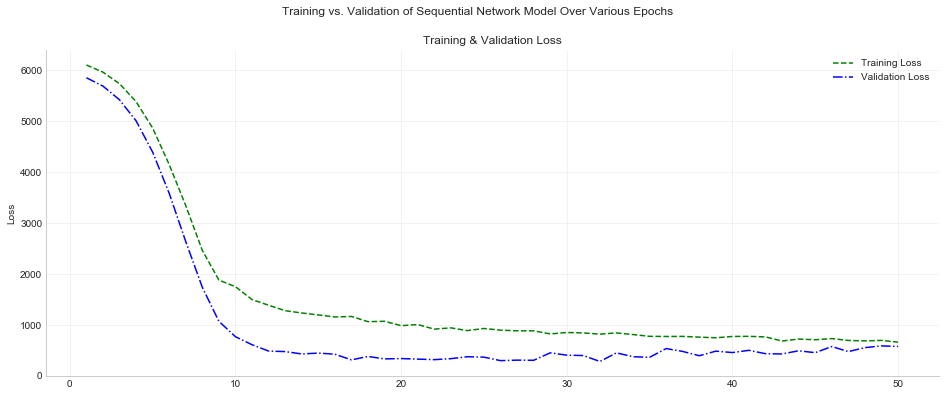

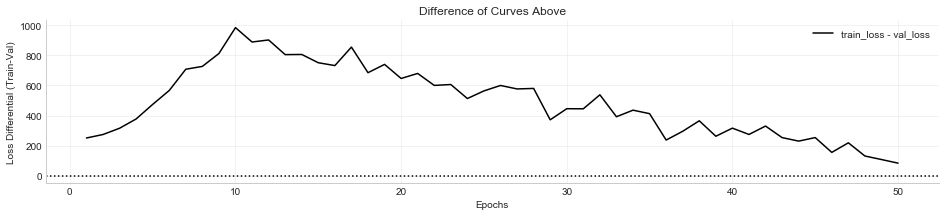


                Fully Connected Model - model 123 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 4
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.1513
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1227 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1228 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_843 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1229 (Dense)           (None, 10)                110       
________________________________________

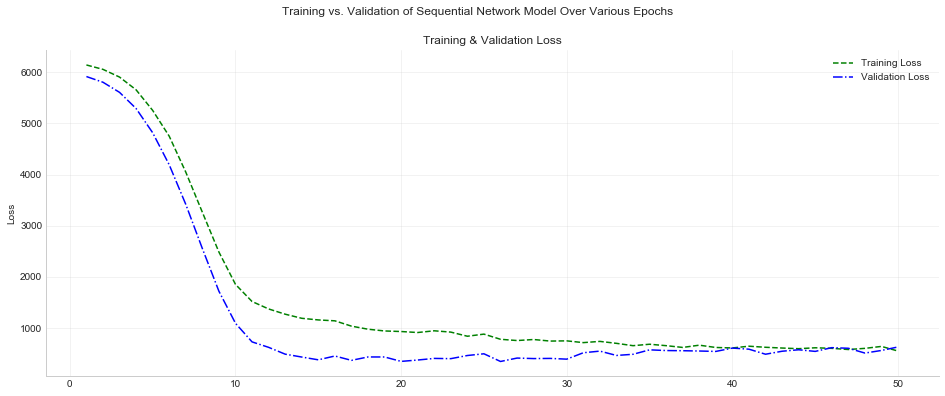

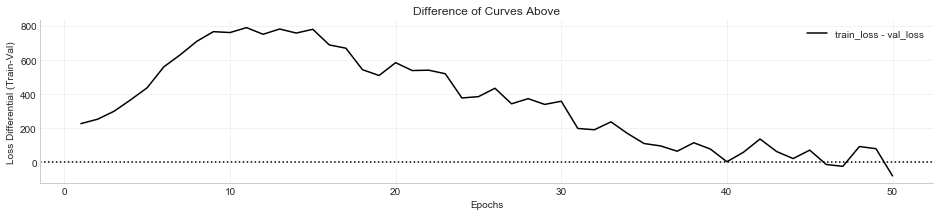


                Fully Connected Model - model 124 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 4
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.1812
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1233 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1234 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_847 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1235 (Dense)           (None, 10)                110       
_________________________________________

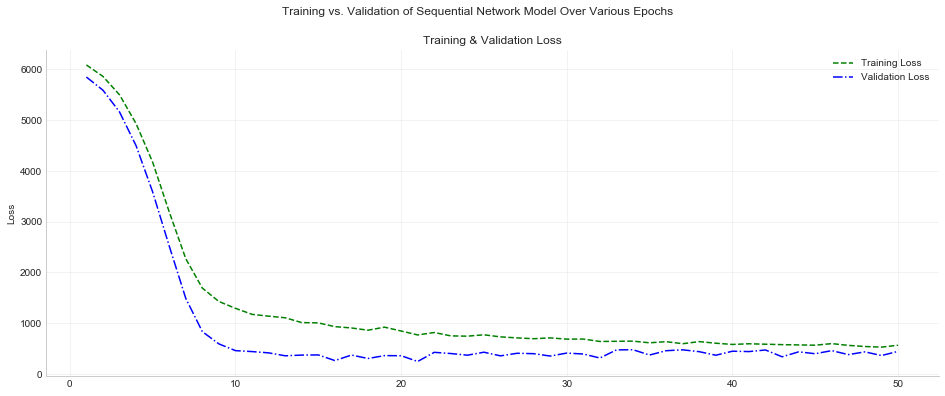

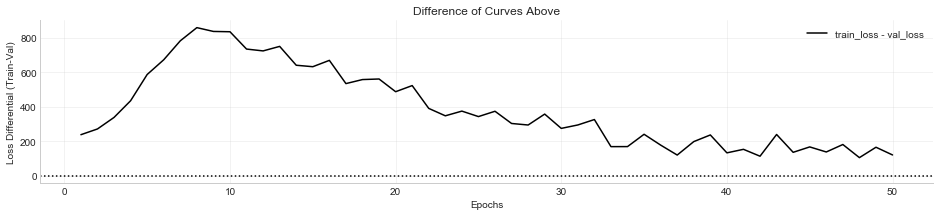


                Fully Connected Model - model 125 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 5
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.0437
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1239 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1240 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_851 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1241 (Dense)           (None, 10)                110       
________________________________________

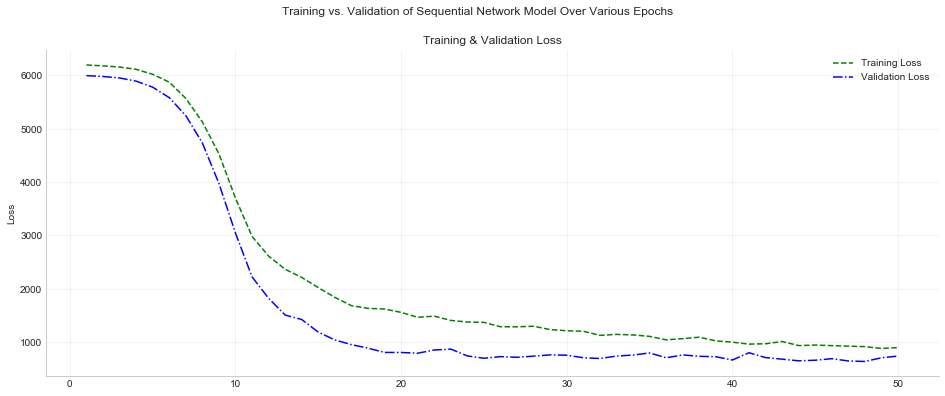

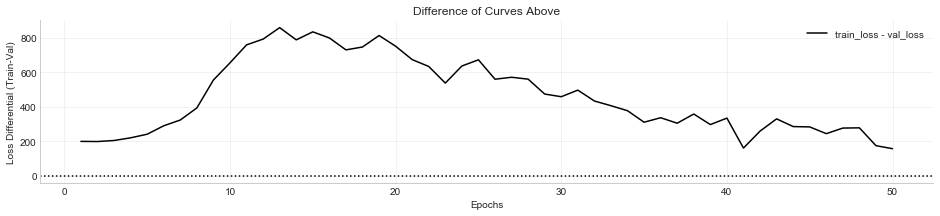


                Fully Connected Model - model 126 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 5
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.1496
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1246 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1247 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_856 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1248 (Dense)           (None, 10)                110       
_________________________________________

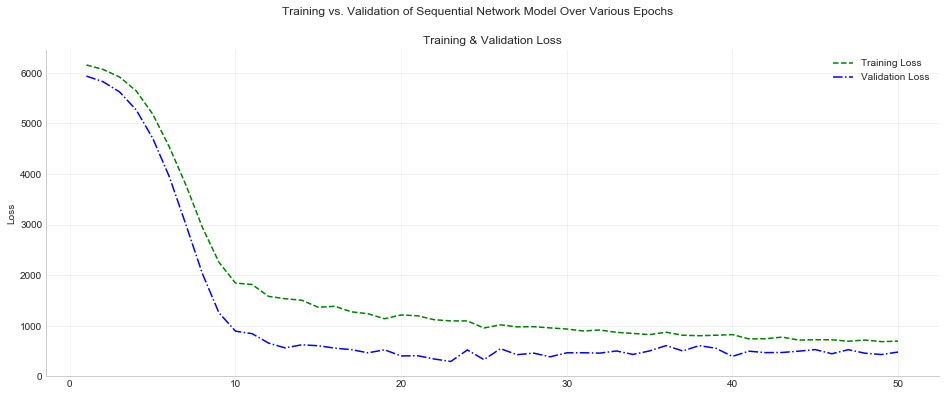

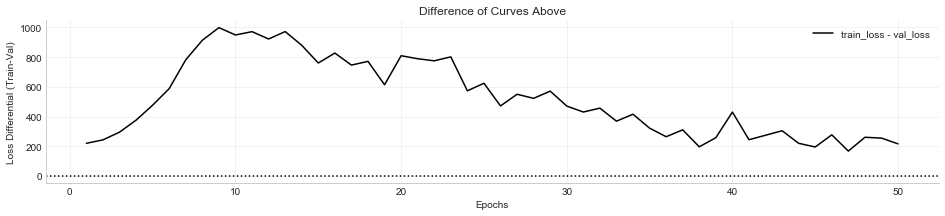


                Fully Connected Model - model 127 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 5
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.0781
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1253 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1254 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_861 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1255 (Dense)           (None, 10)                110       
_________________________________________

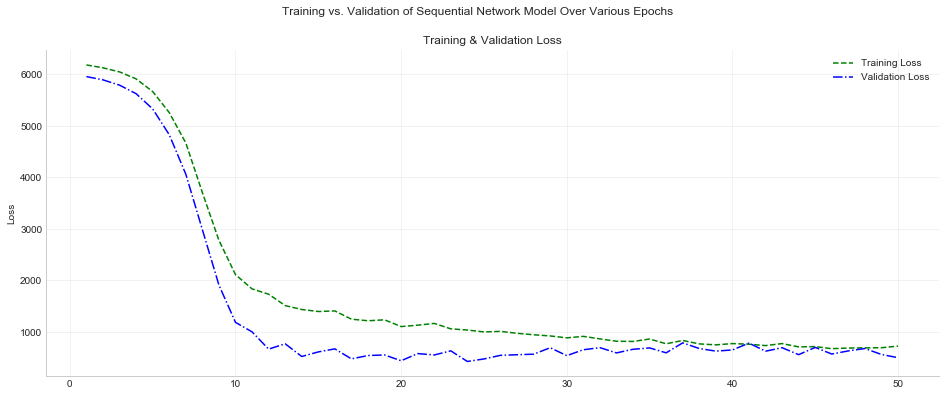

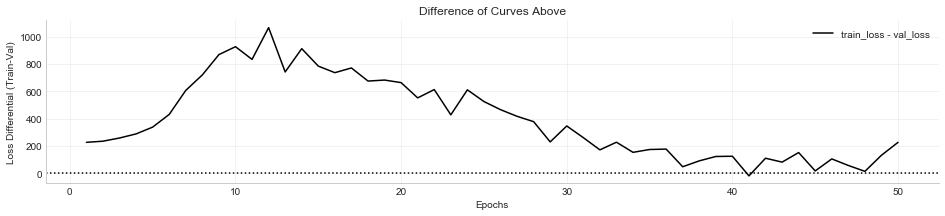


                Fully Connected Model - model 128 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 5
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.1837
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1260 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1261 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_866 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1262 (Dense)           (None, 10)                110       
________________________________________

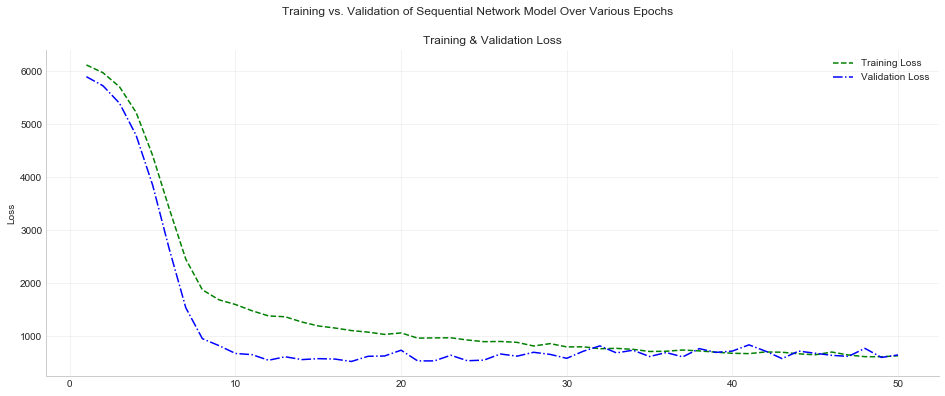

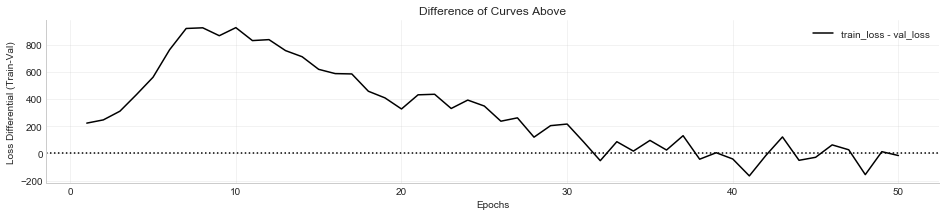


                Fully Connected Model - model 129 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 6
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.4280
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1267 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1268 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_871 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1269 (Dense)           (None, 10)                110       
_________________________________________

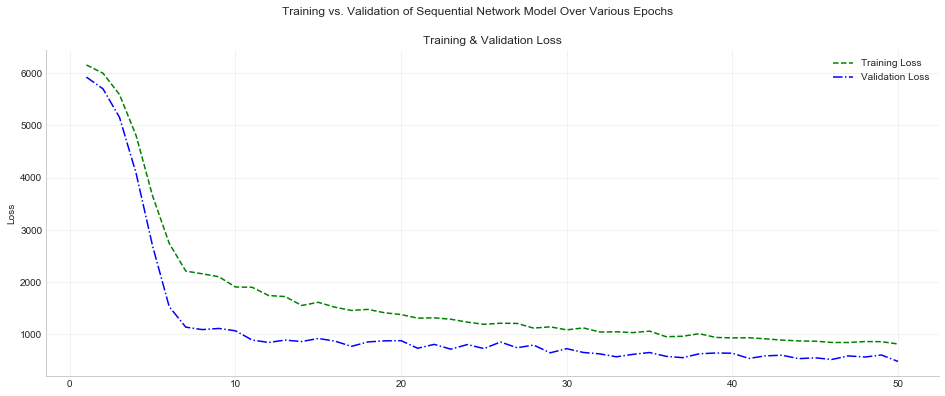

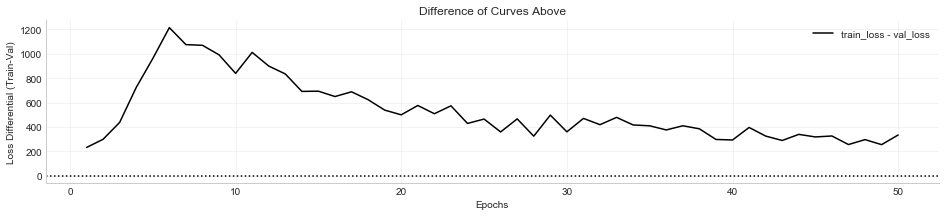


                Fully Connected Model - model 130 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 6
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.1234
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1275 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1276 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_877 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1277 (Dense)           (None, 10)                110       
_________________________________________

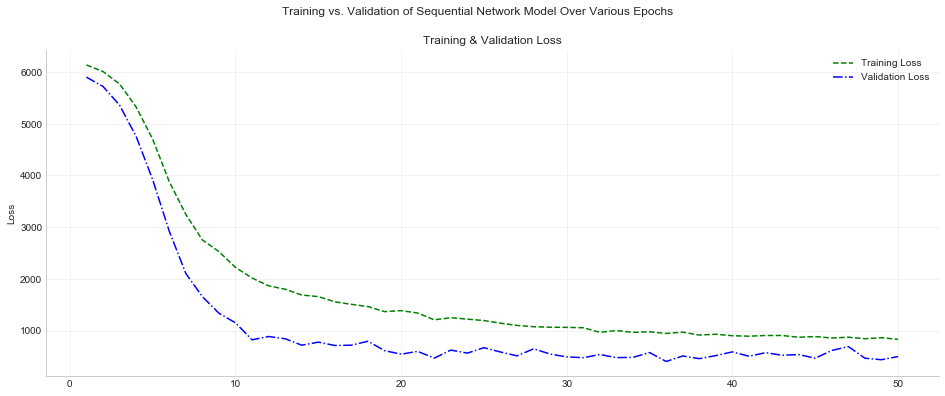

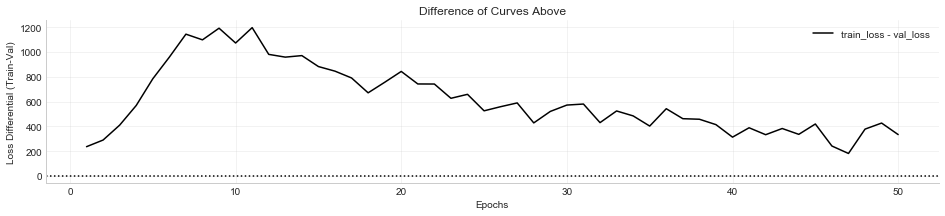


                Fully Connected Model - model 131 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 6
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.6288
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1283 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1284 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_883 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1285 (Dense)           (None, 10)                110       
________________________________________

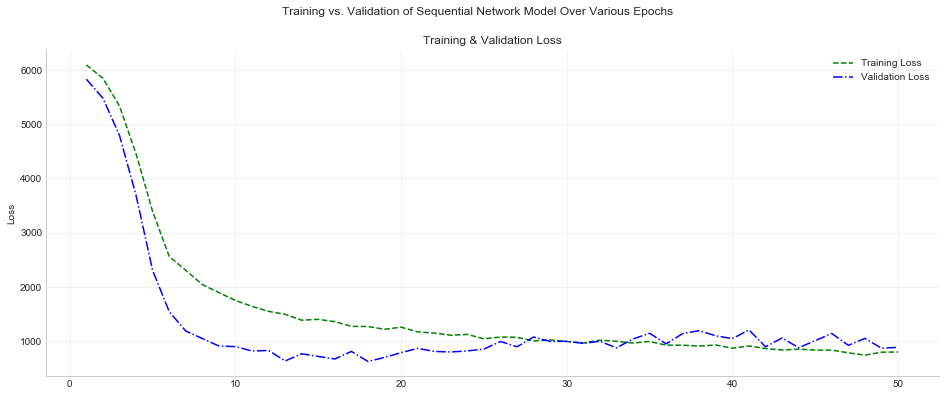

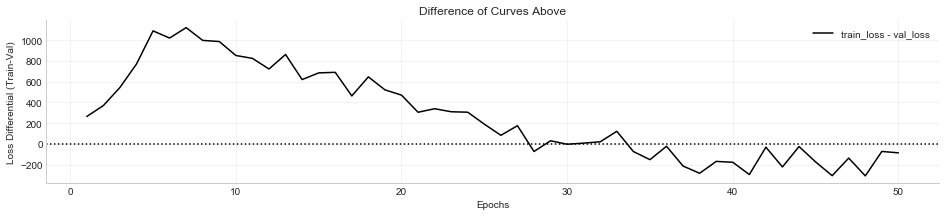


                Fully Connected Model - model 132 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 6
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.9004
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1291 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1292 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_889 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1293 (Dense)           (None, 10)                110       
________________________________________

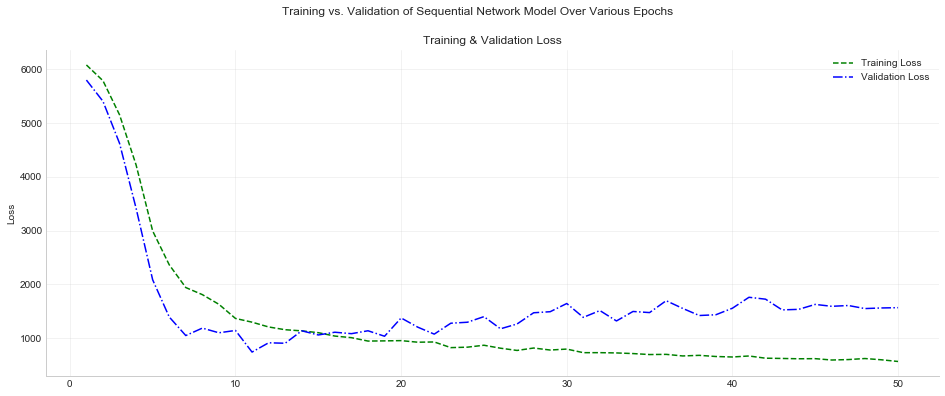

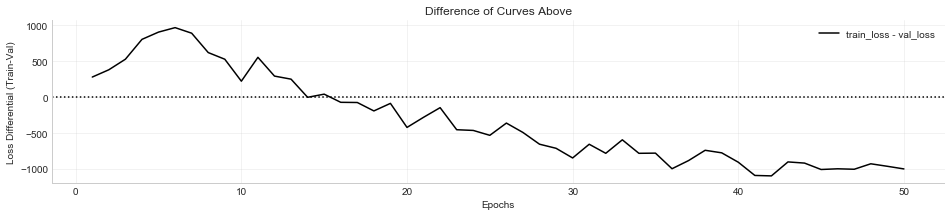


                Fully Connected Model - model 133 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 7
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.0492
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1299 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1300 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_895 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1301 (Dense)           (None, 10)                110       
________________________________________

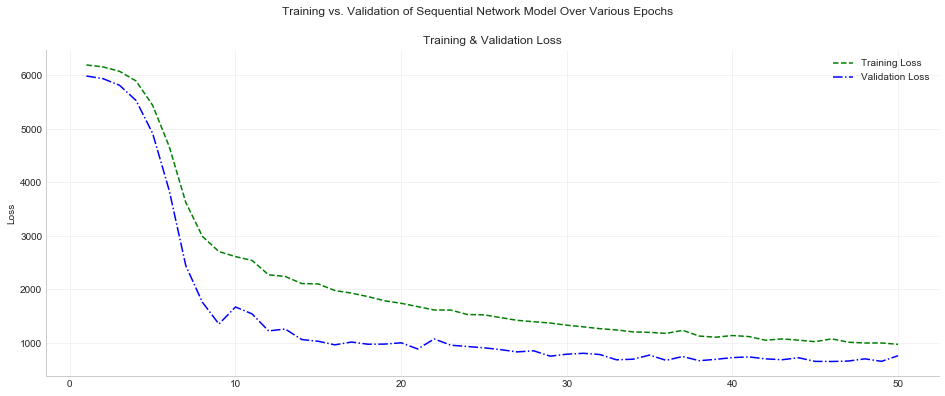

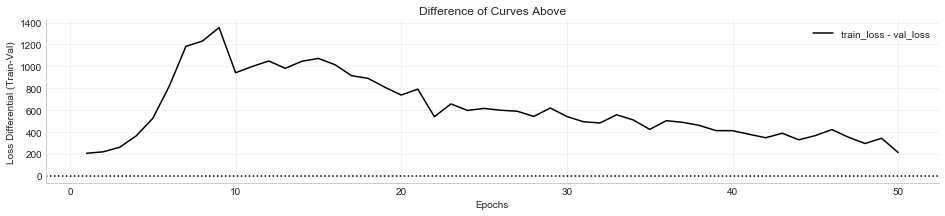


                Fully Connected Model - model 134 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 7
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.0795
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1308 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1309 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_902 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1310 (Dense)           (None, 10)                110       
________________________________________

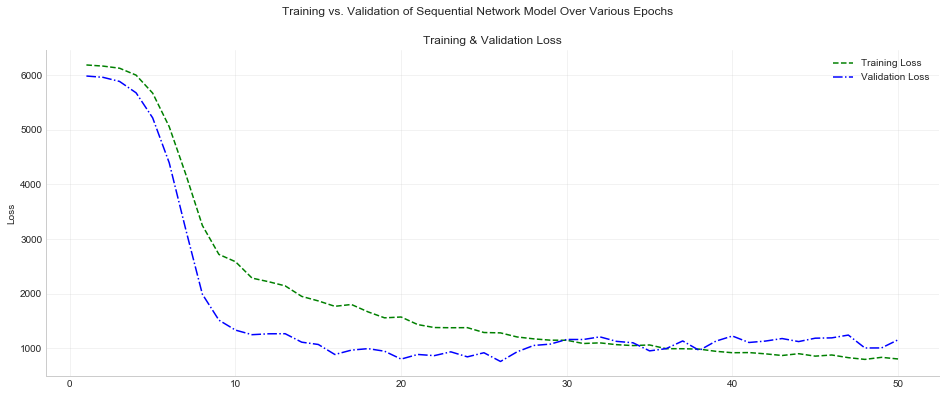

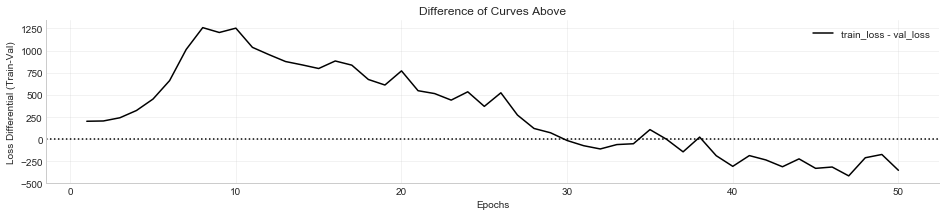


                Fully Connected Model - model 135 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 7
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.1470
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1317 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1318 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_909 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1319 (Dense)           (None, 10)                110       
________________________________________

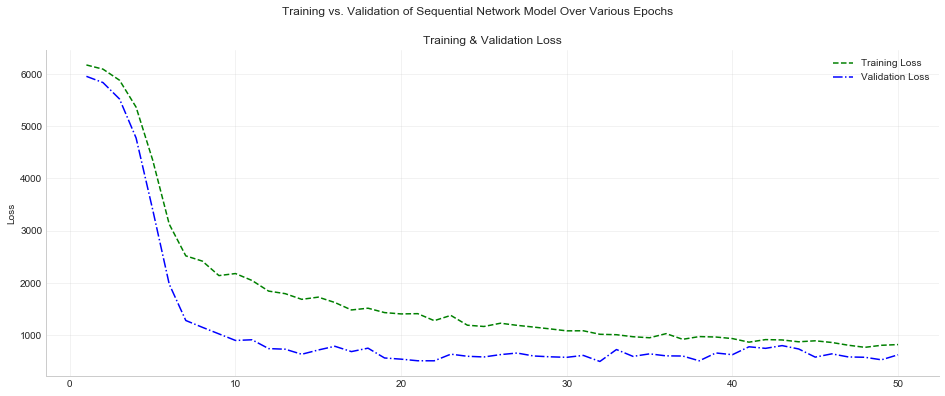

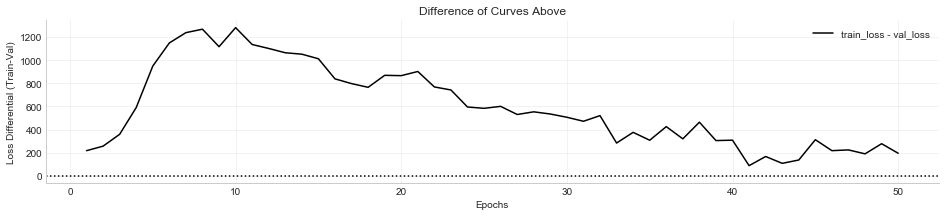


                Fully Connected Model - model 136 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 7
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.3489
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1326 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1327 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_916 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1328 (Dense)           (None, 10)                110       
________________________________________

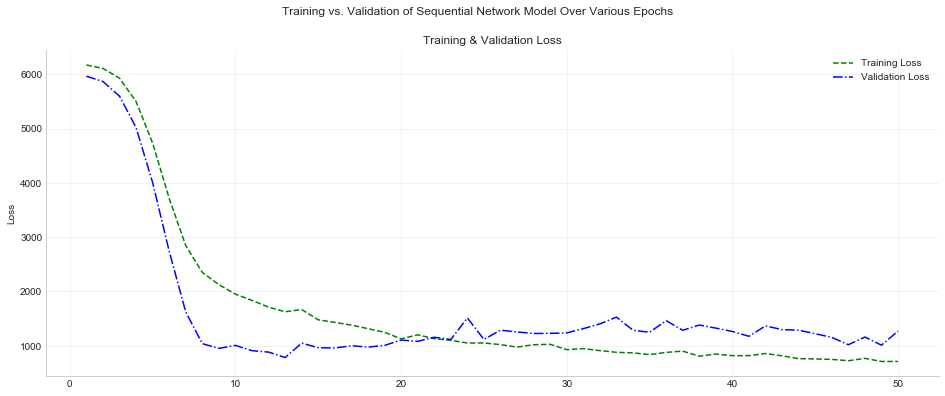

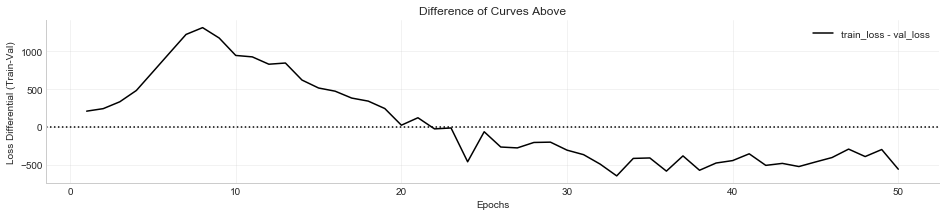


                Fully Connected Model - model 137 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 8
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.0949
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1335 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1336 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_923 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1337 (Dense)           (None, 10)                110       
_________________________________________

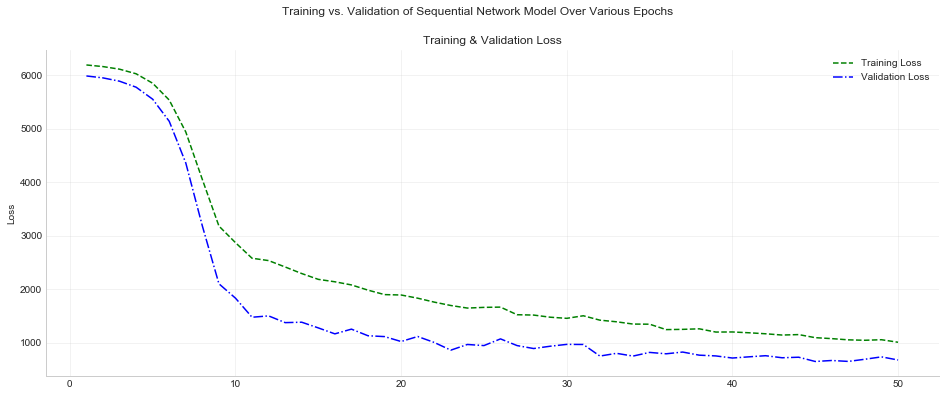

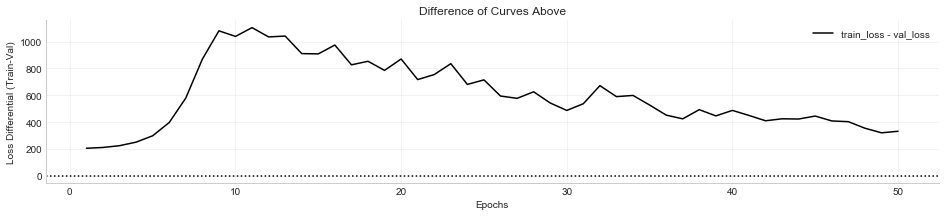


                Fully Connected Model - model 138 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 8
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.7768
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1345 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1346 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_931 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1347 (Dense)           (None, 10)                110       
________________________________________

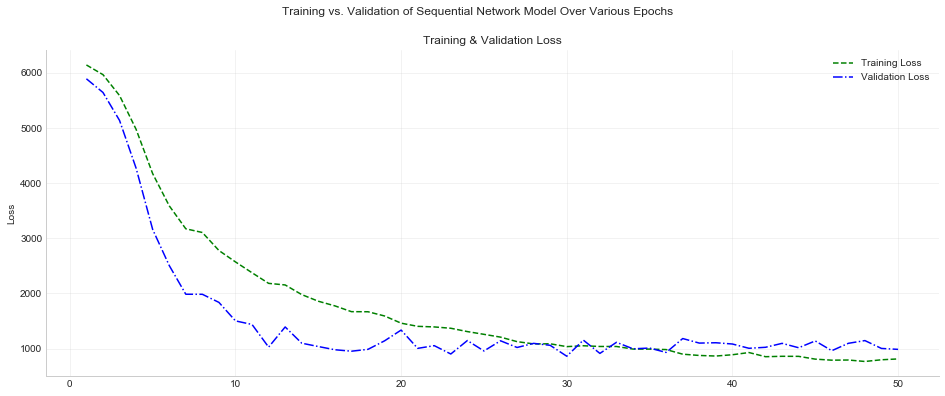

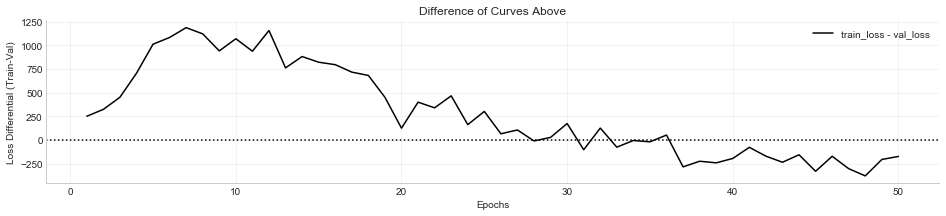


                Fully Connected Model - model 139 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 8
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.1005
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1355 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1356 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_939 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1357 (Dense)           (None, 10)                110       
________________________________________

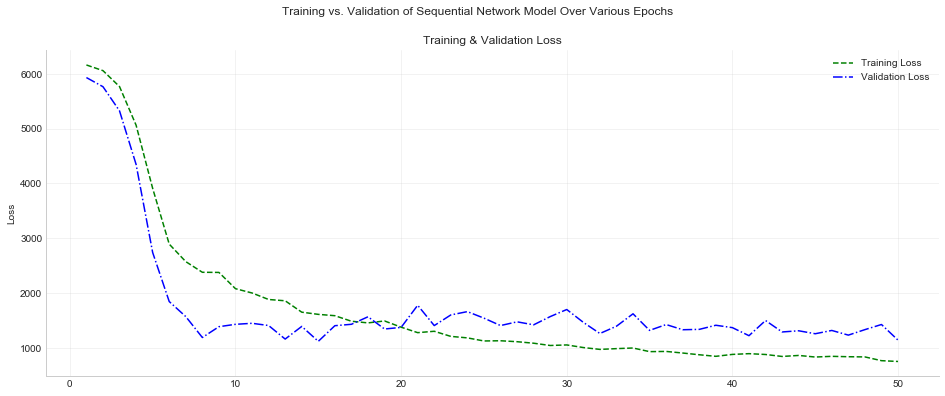

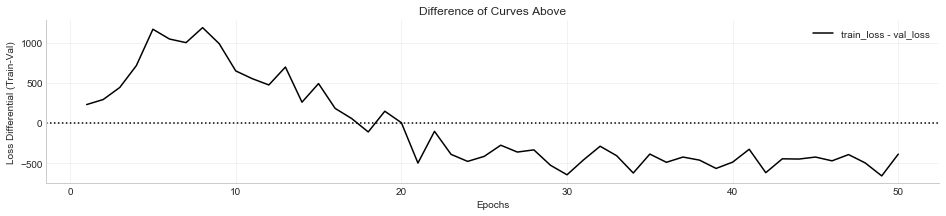


                Fully Connected Model - model 140 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 8
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.6859
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1365 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1366 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_947 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1367 (Dense)           (None, 10)                110       
________________________________________

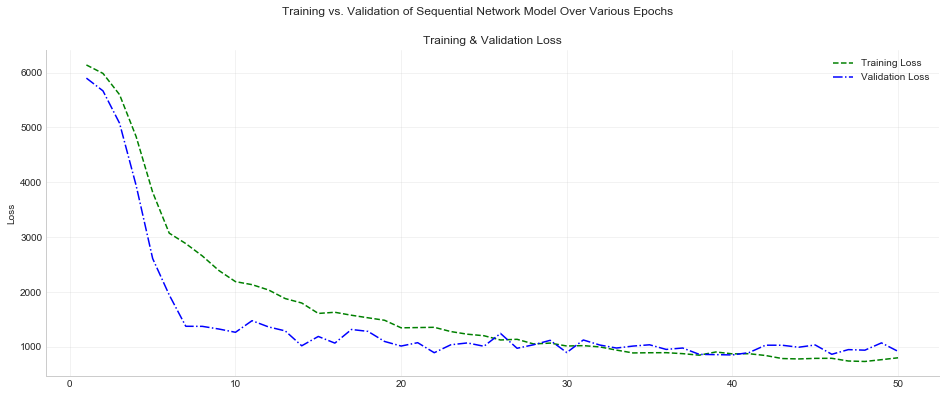

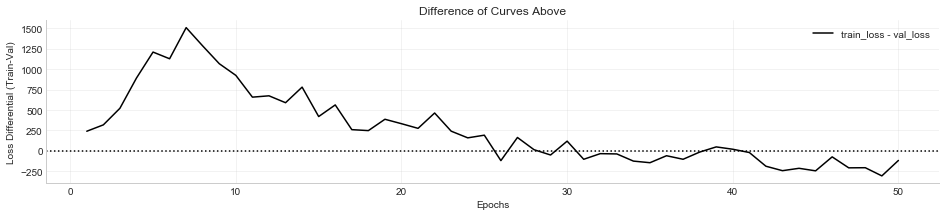


                Fully Connected Model - model 141 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 9
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.1268
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1375 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1376 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_955 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1377 (Dense)           (None, 10)                110       
_________________________________________

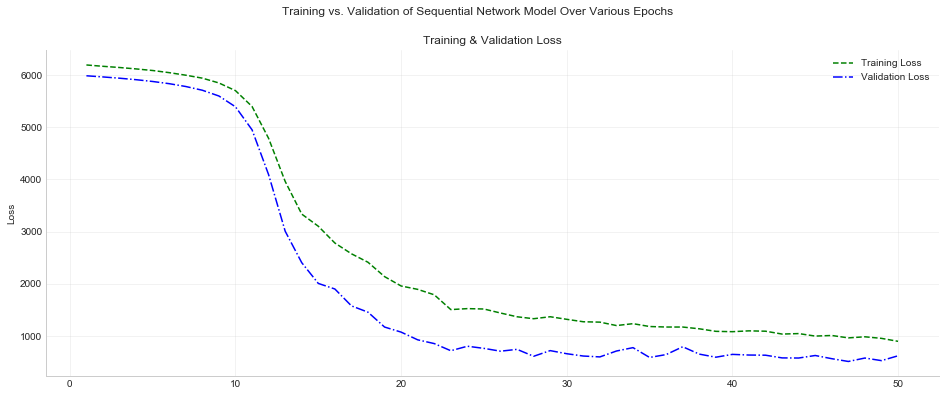

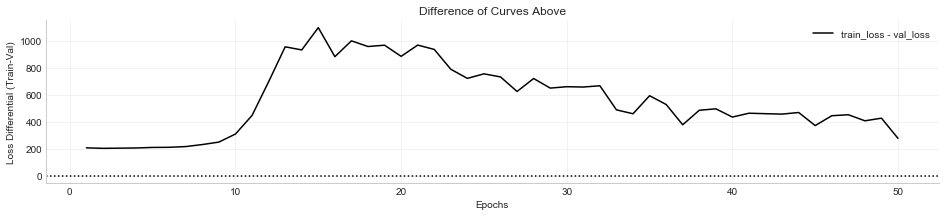


                Fully Connected Model - model 142 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 9
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.6627
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1386 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1387 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_964 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1388 (Dense)           (None, 10)                110       
________________________________________

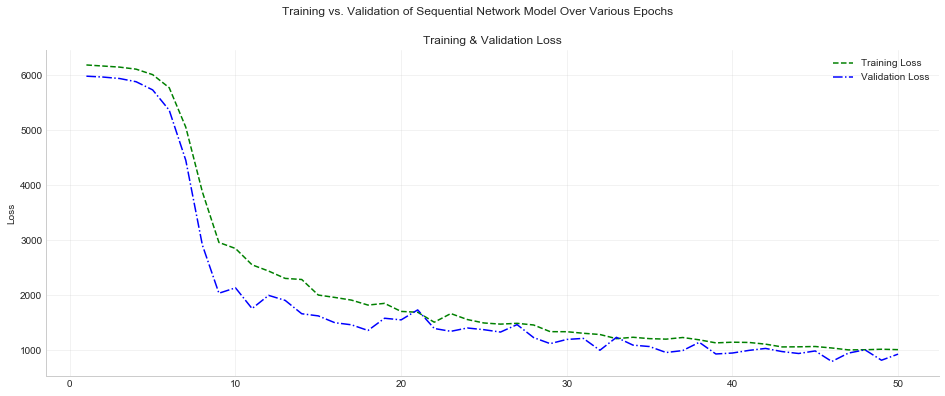

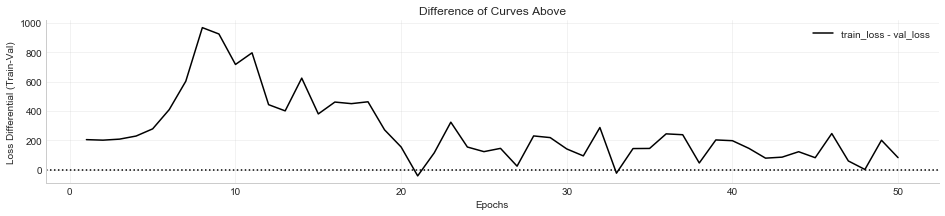


                Fully Connected Model - model 143 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 9
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.7183
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1397 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1398 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_973 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1399 (Dense)           (None, 10)                110       
________________________________________

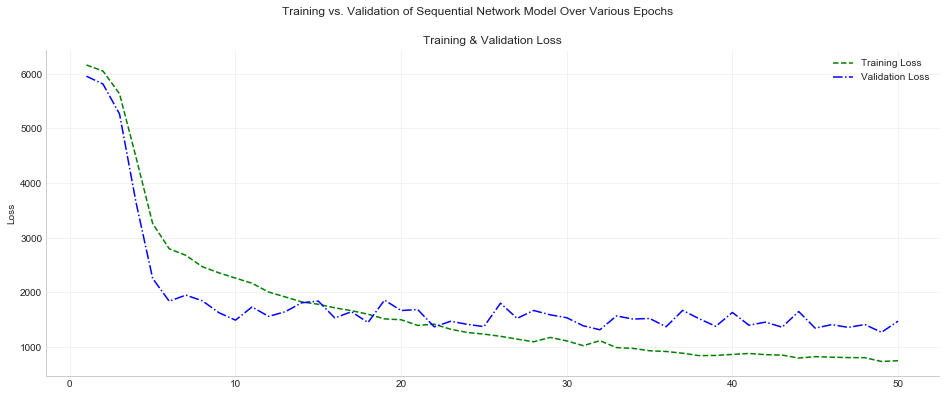

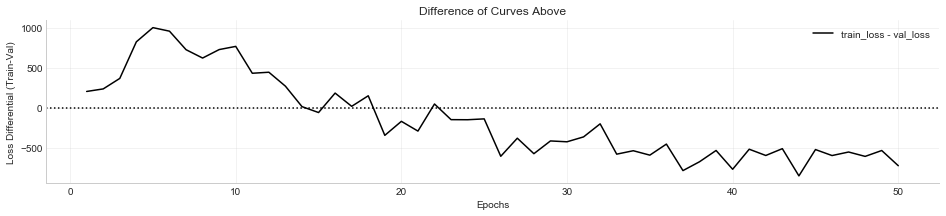


                Fully Connected Model - model 144 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 9
                 - Neurons per Layer:   10
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.0714
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1408 (Dense)           (None, 10)                460       
_________________________________________________________________
dense_1409 (Dense)           (None, 10)                110       
_________________________________________________________________
dropout_982 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_1410 (Dense)           (None, 10)                110       
________________________________________

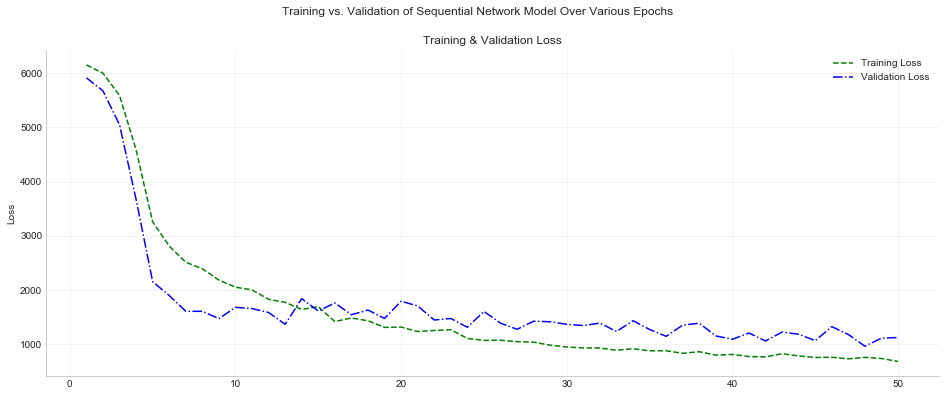

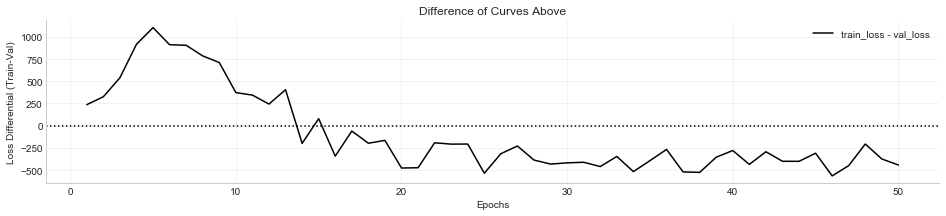


                Fully Connected Model - model 145 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 1
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.8959
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1419 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1420 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_991 (Dropout)        (None, 12)                0         
_________________________________________________________________
dense_1421 (Dense)           (None, 1)                 13        
Total params: 721
Trainable params: 721
N

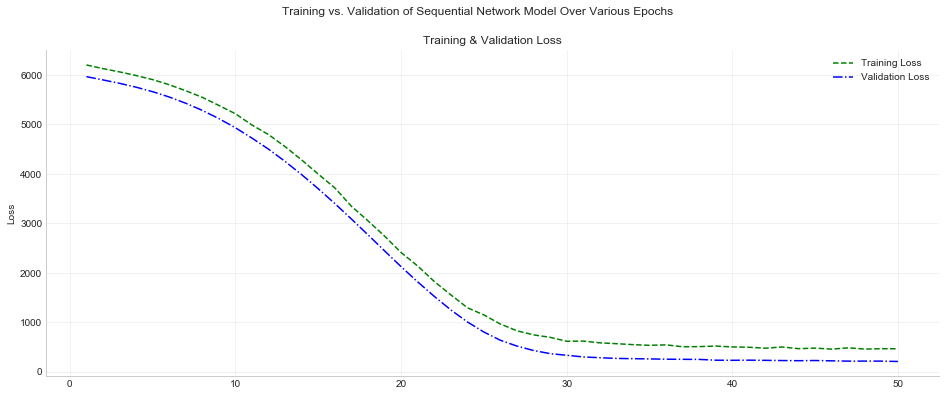

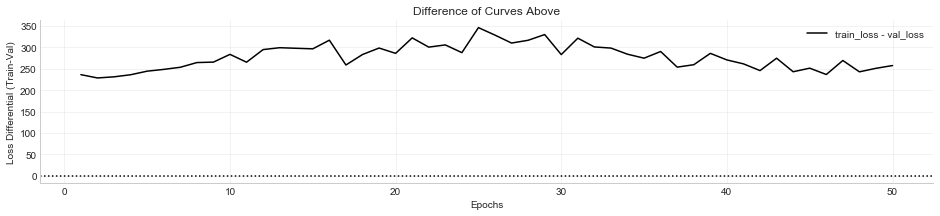


                Fully Connected Model - model 146 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 1
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.8960
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1422 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1423 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_992 (Dropout)        (None, 12)                0         
_________________________________________________________________
dense_1424 (Dense)           (None, 1)                 13        
Total params: 721
Trainable params: 721
N

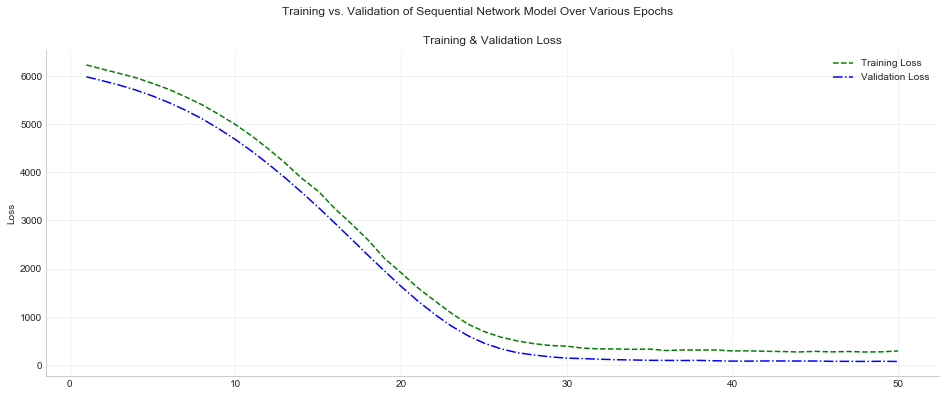

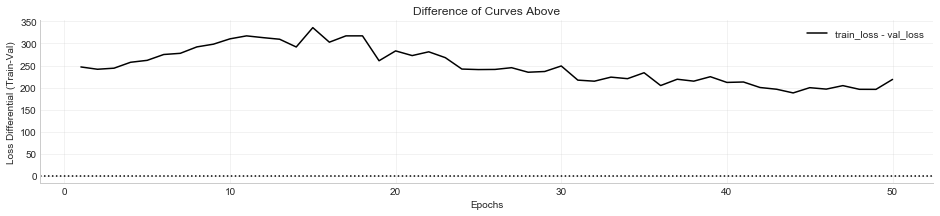


                Fully Connected Model - model 147 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 1
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.9163
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1425 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1426 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_993 (Dropout)        (None, 12)                0         
_________________________________________________________________
dense_1427 (Dense)           (None, 1)                 13        
Total params: 721
Trainable params: 721
N

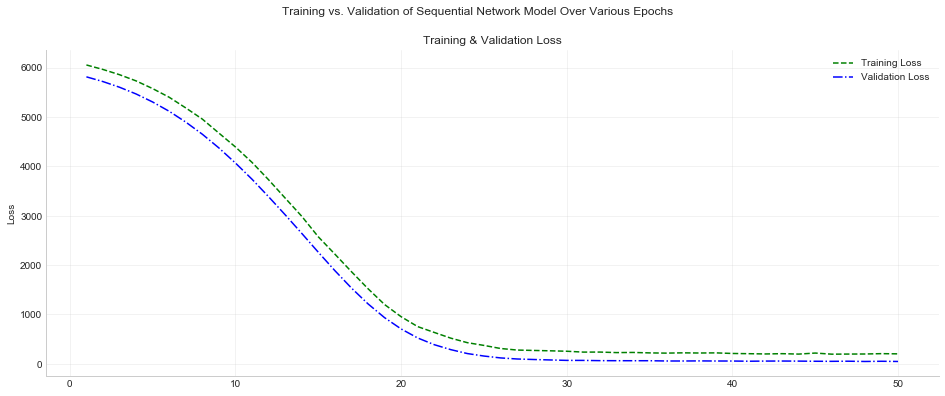

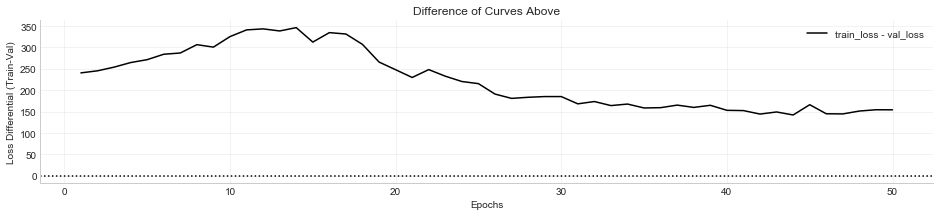


                Fully Connected Model - model 148 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 1
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.9006
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1428 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1429 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_994 (Dropout)        (None, 12)                0         
_________________________________________________________________
dense_1430 (Dense)           (None, 1)                 13        
Total params: 721
Trainable params: 721
N

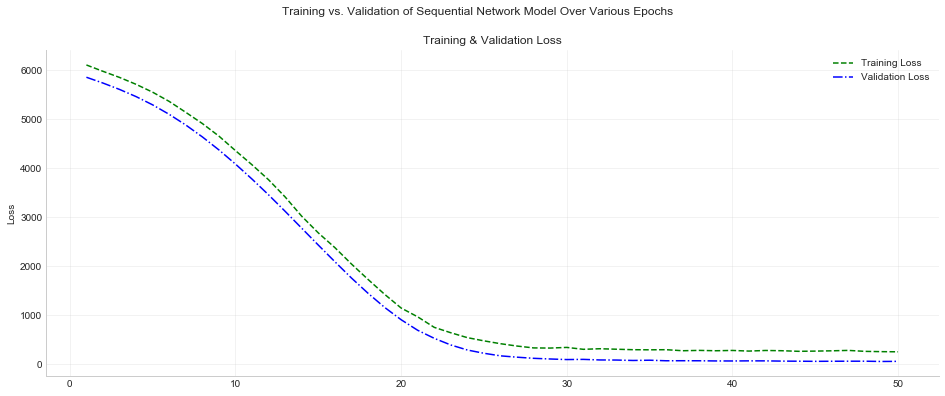

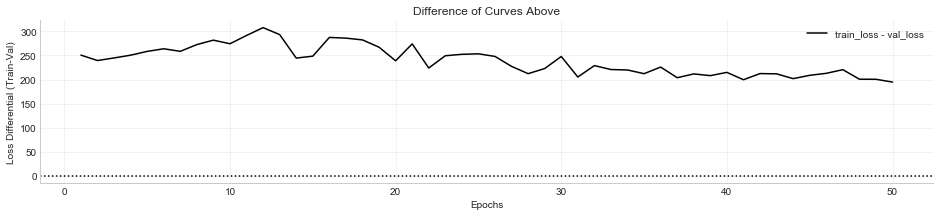


                Fully Connected Model - model 149 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 2
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.8890
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1431 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1432 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_995 (Dropout)        (None, 12)                0         
_________________________________________________________________
dense_1433 (Dense)           (None, 12)                156       
_________________________________________

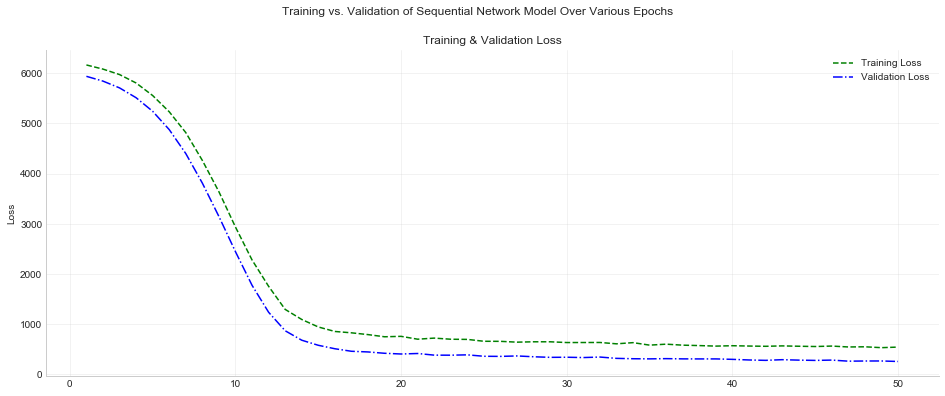

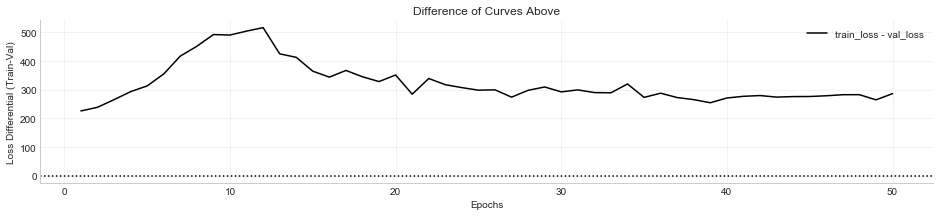


                Fully Connected Model - model 150 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 2
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.8715
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1435 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1436 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_997 (Dropout)        (None, 12)                0         
_________________________________________________________________
dense_1437 (Dense)           (None, 12)                156       
_________________________________________

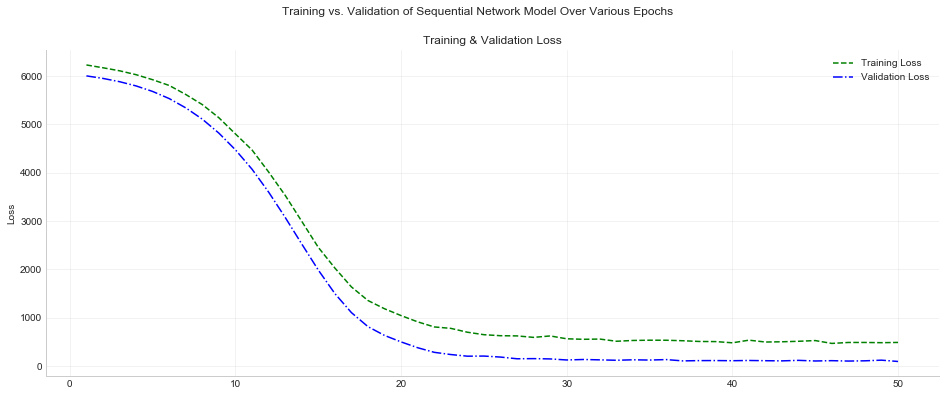

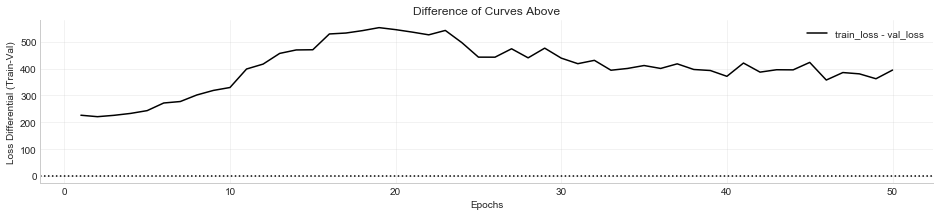


                Fully Connected Model - model 151 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 2
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.8931
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1439 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1440 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_999 (Dropout)        (None, 12)                0         
_________________________________________________________________
dense_1441 (Dense)           (None, 12)                156       
_________________________________________

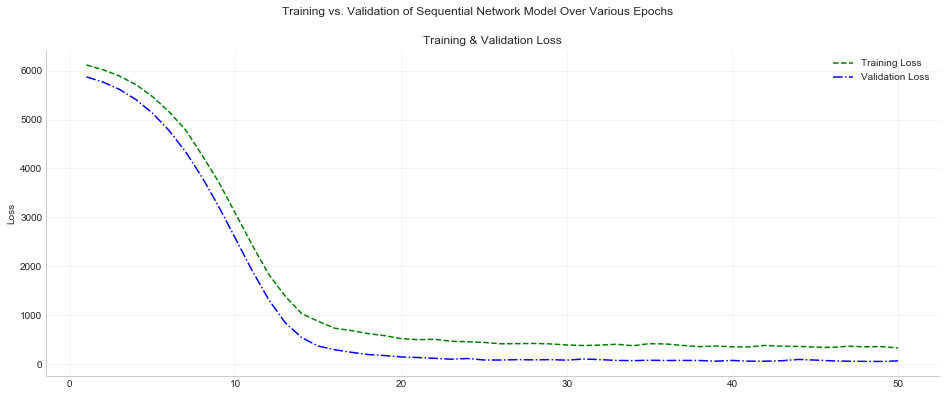

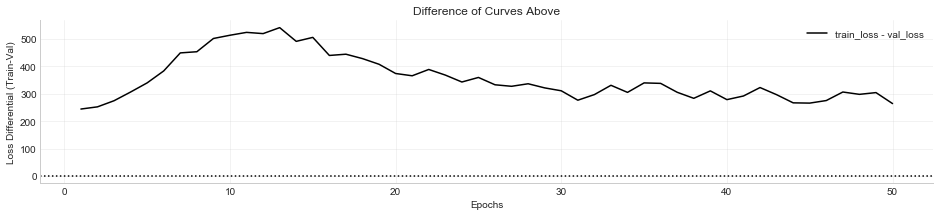


                Fully Connected Model - model 152 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 2
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.8704
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1443 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1444 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1001 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1445 (Dense)           (None, 12)                156       
_________________________________________

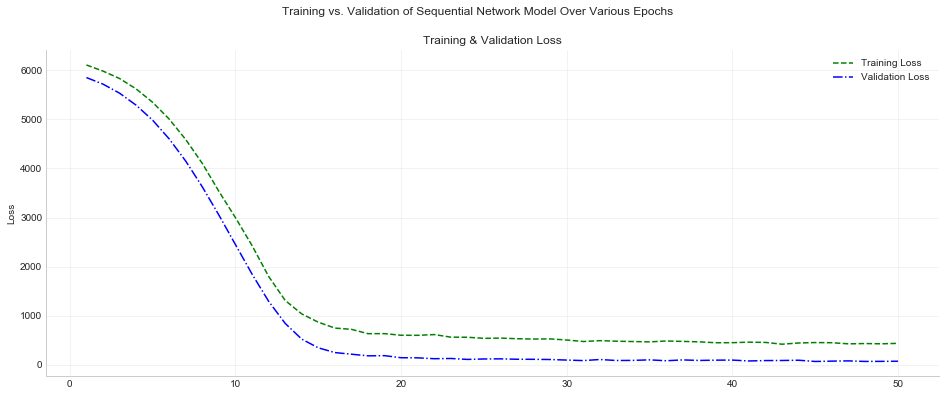

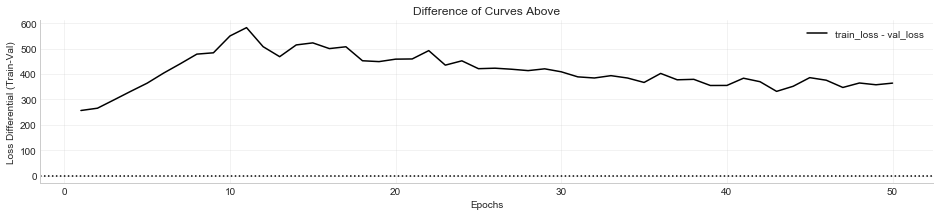


                Fully Connected Model - model 153 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 3
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.8430
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1447 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1448 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1003 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1449 (Dense)           (None, 12)                156       
_________________________________________

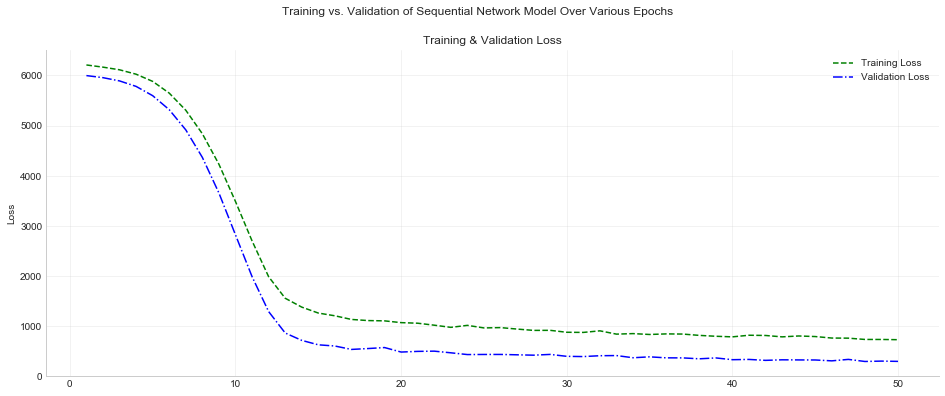

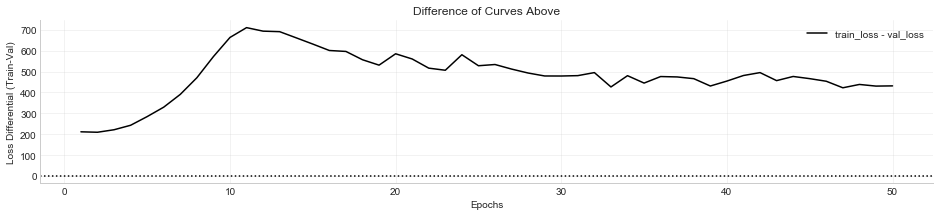


                Fully Connected Model - model 154 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 3
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.8437
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1452 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1453 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1006 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1454 (Dense)           (None, 12)                156       
_________________________________________

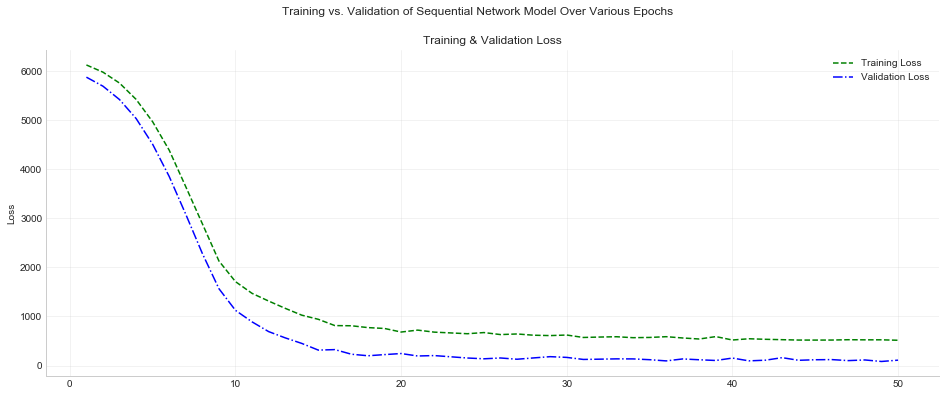

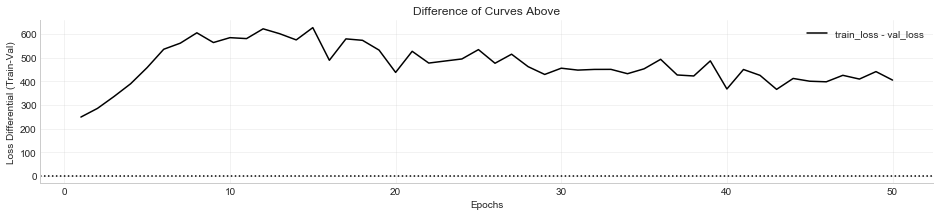


                Fully Connected Model - model 155 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 3
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.8701
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1457 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1458 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1009 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1459 (Dense)           (None, 12)                156       
_________________________________________

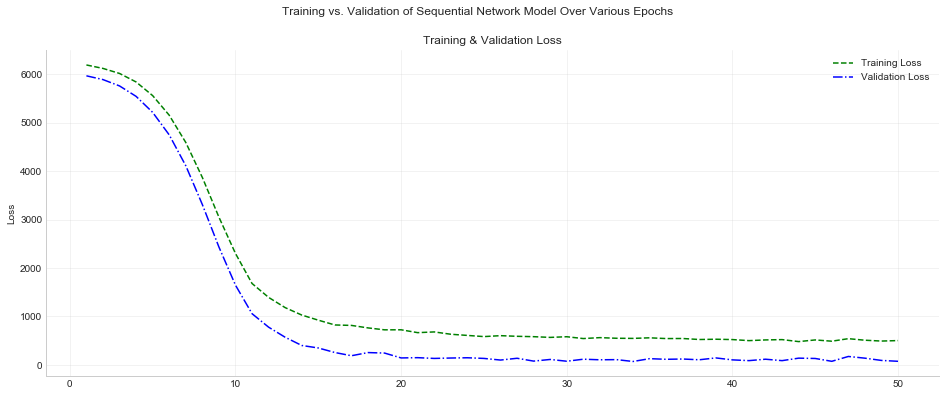

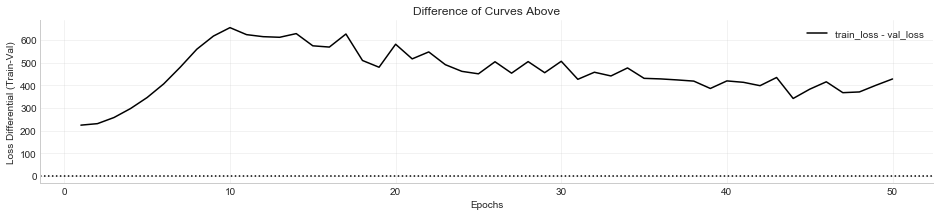


                Fully Connected Model - model 156 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 3
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.8662
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1462 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1463 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1012 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1464 (Dense)           (None, 12)                156       
_________________________________________

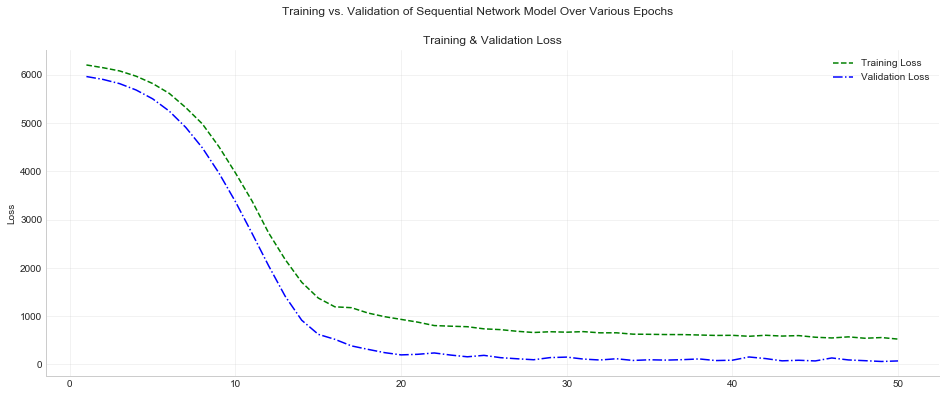

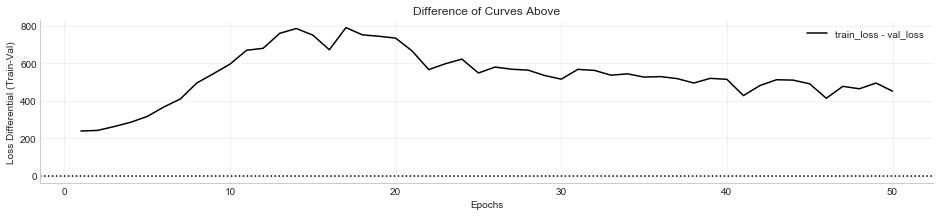


                Fully Connected Model - model 157 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 4
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.6479
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1467 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1468 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1015 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1469 (Dense)           (None, 12)                156       
_________________________________________

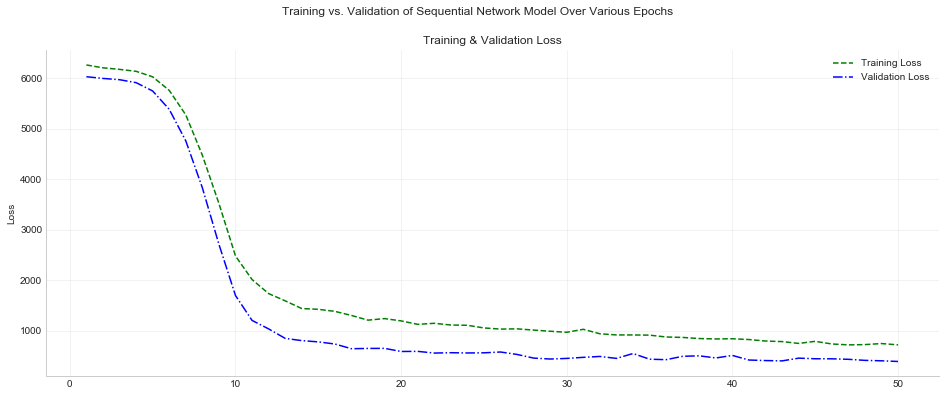

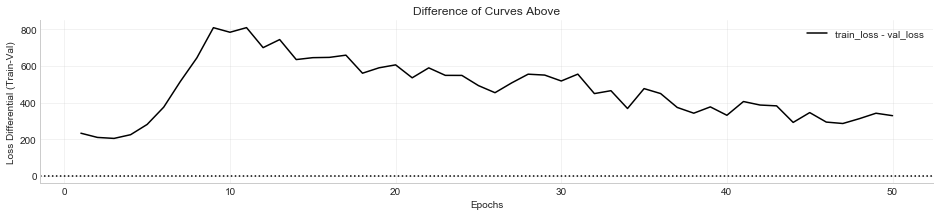


                Fully Connected Model - model 158 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 4
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.6634
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1473 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1474 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1019 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1475 (Dense)           (None, 12)                156       
_________________________________________

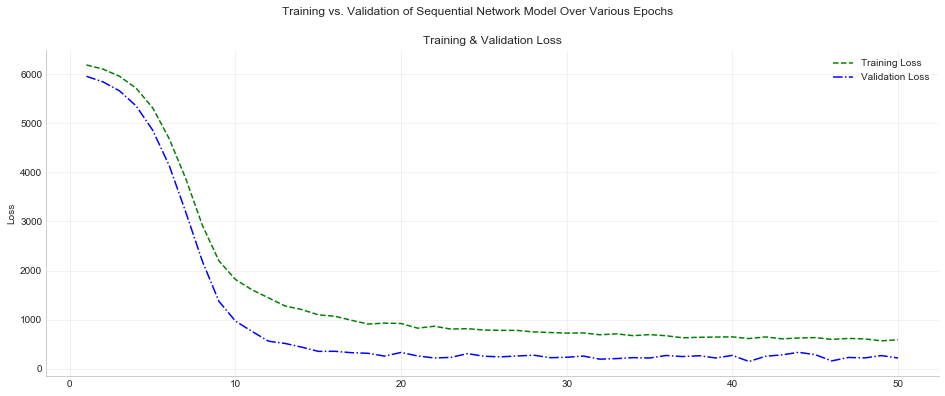

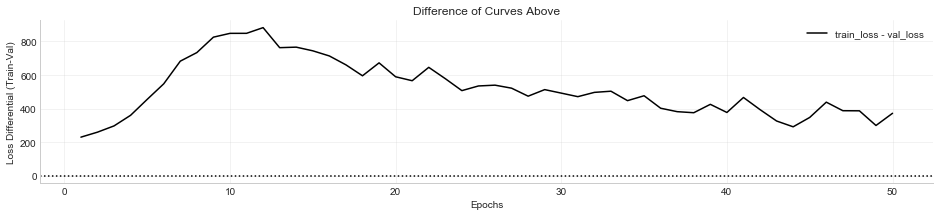


                Fully Connected Model - model 159 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 4
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.5650
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1479 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1480 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1023 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1481 (Dense)           (None, 12)                156       
_________________________________________

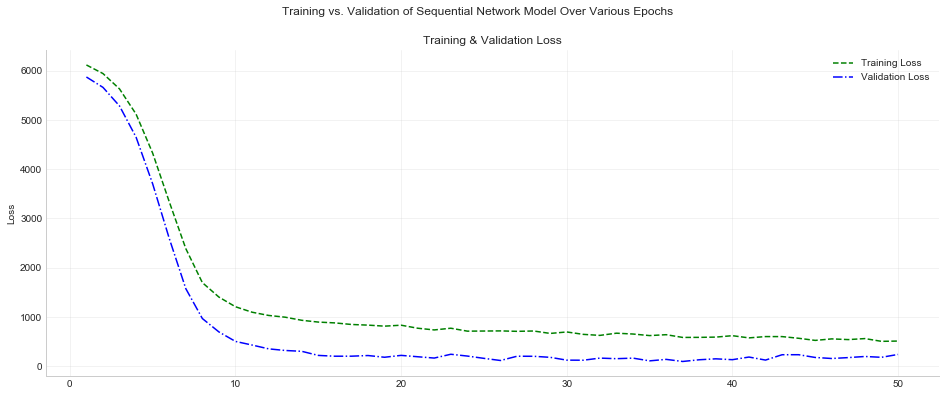

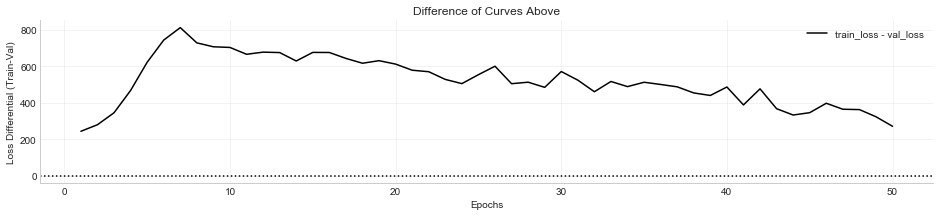


                Fully Connected Model - model 160 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 4
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.4022
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1485 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1486 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1027 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1487 (Dense)           (None, 12)                156       
_________________________________________

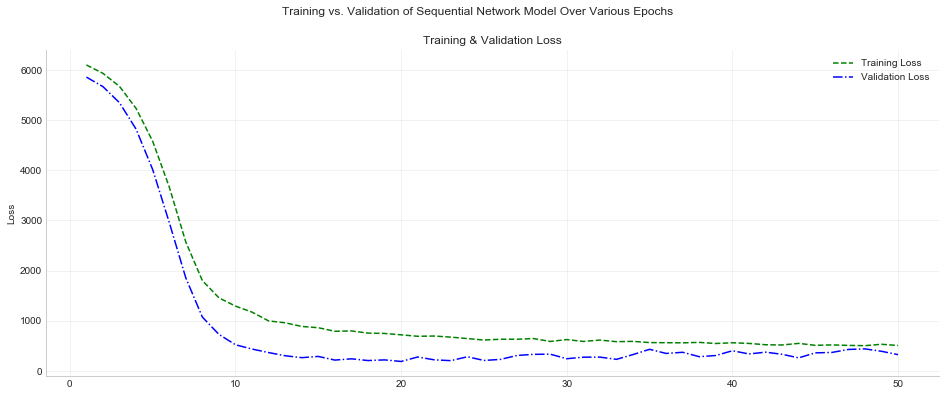

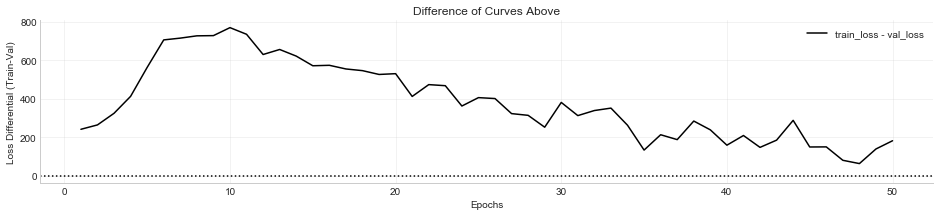


                Fully Connected Model - model 161 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 5
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.6757
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1491 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1492 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1031 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1493 (Dense)           (None, 12)                156       
_________________________________________

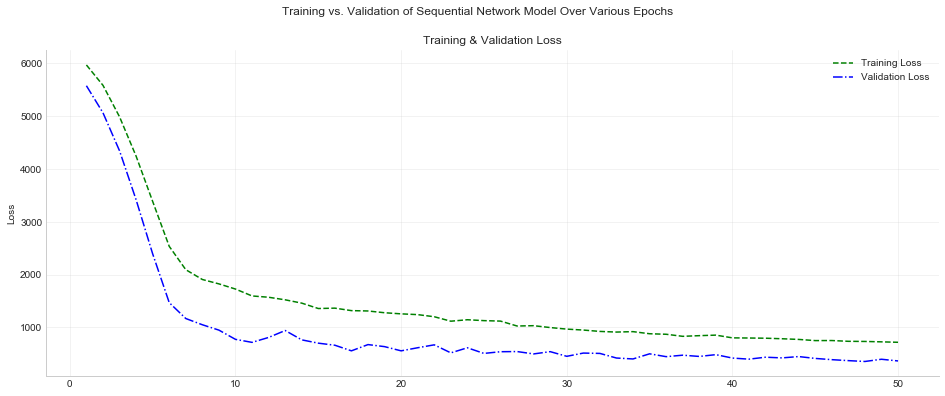

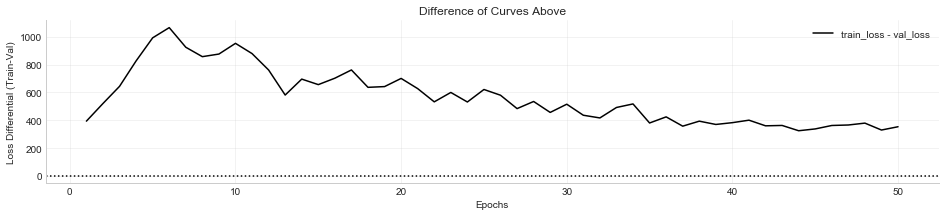


                Fully Connected Model - model 162 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 5
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.1344
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1498 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1499 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1036 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1500 (Dense)           (None, 12)                156       
________________________________________

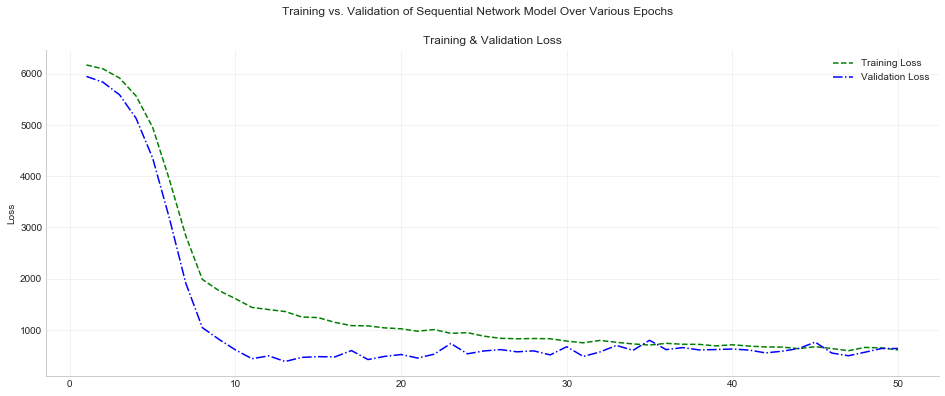

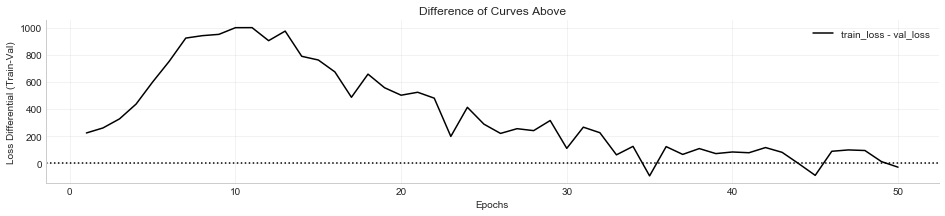


                Fully Connected Model - model 163 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 5
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.0894
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1505 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1506 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1041 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1507 (Dense)           (None, 12)                156       
_________________________________________

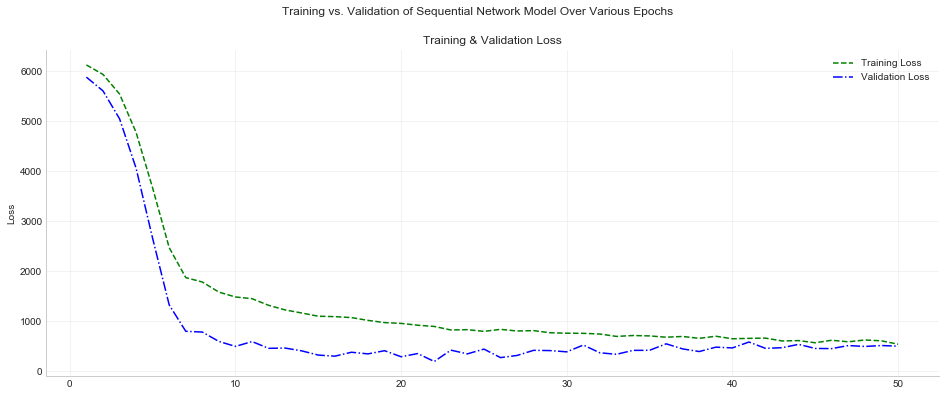

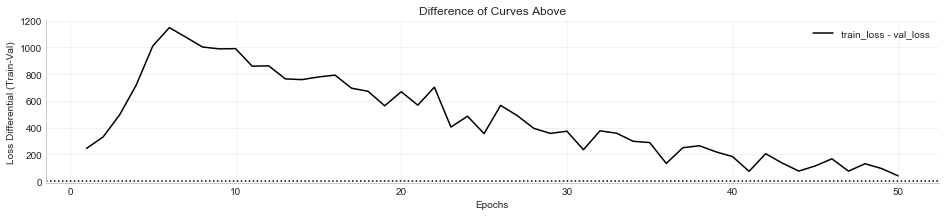


                Fully Connected Model - model 164 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 5
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.2292
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1512 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1513 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1046 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1514 (Dense)           (None, 12)                156       
_________________________________________

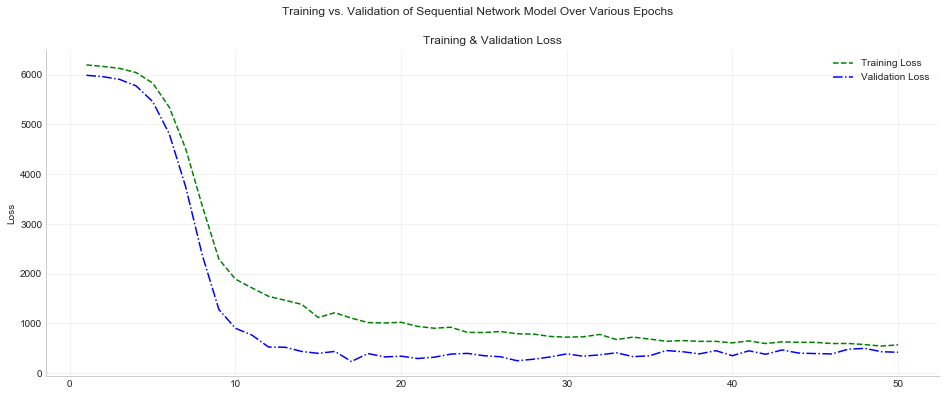

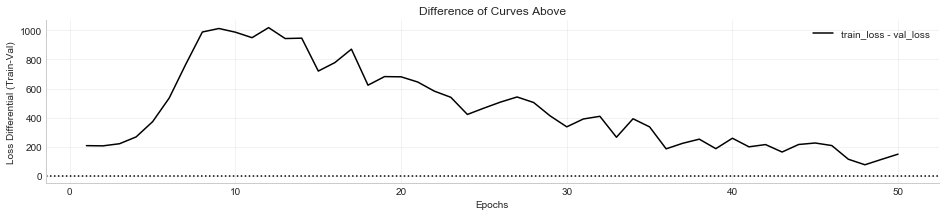


                Fully Connected Model - model 165 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 6
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.3010
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1519 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1520 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1051 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1521 (Dense)           (None, 12)                156       
_________________________________________

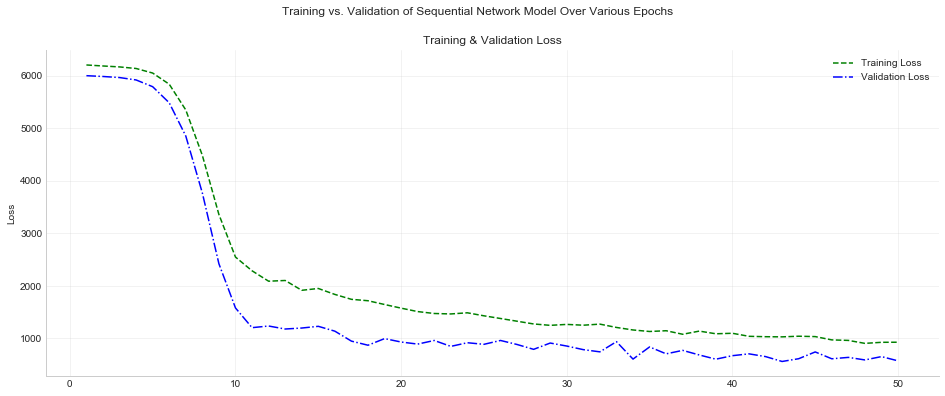

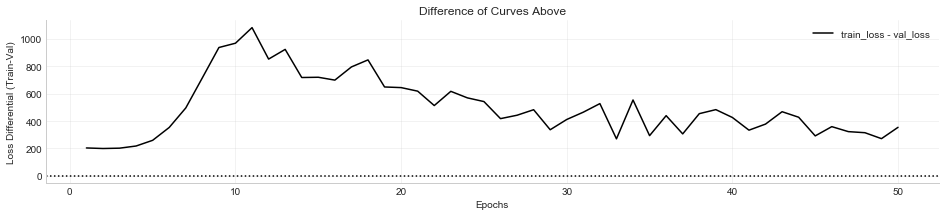


                Fully Connected Model - model 166 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 6
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.2831
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1527 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1528 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1057 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1529 (Dense)           (None, 12)                156       
________________________________________

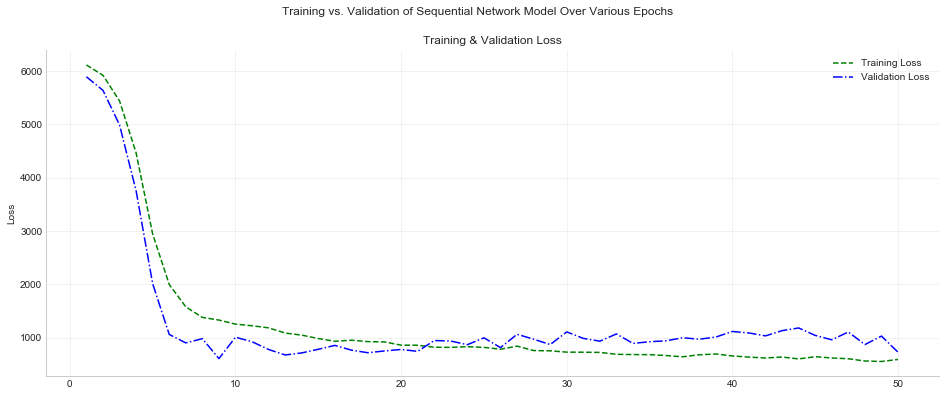

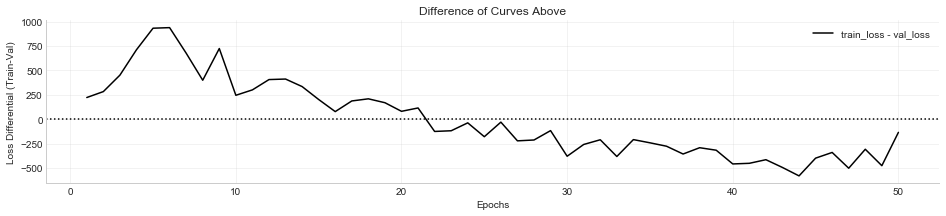


                Fully Connected Model - model 167 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 6
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.6766
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1535 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1536 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1063 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1537 (Dense)           (None, 12)                156       
________________________________________

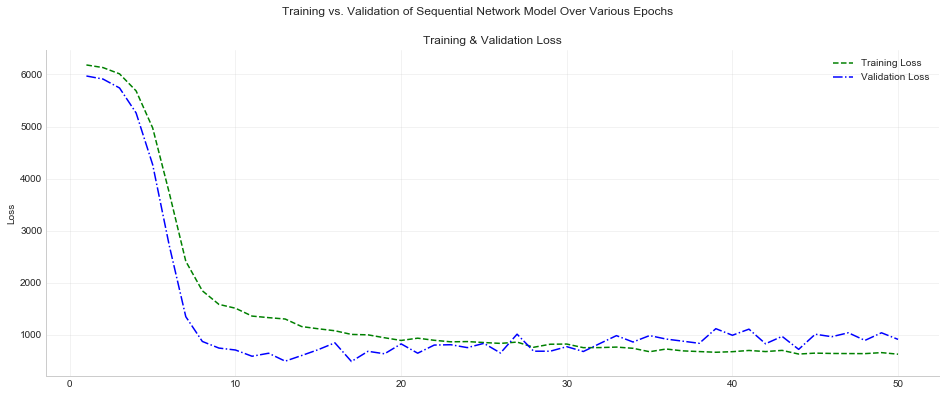

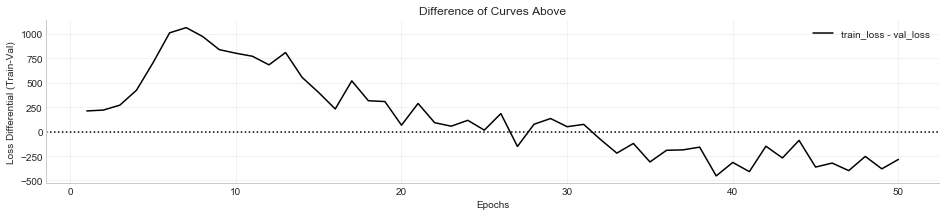


                Fully Connected Model - model 168 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 6
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.2580
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1543 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1544 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1069 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1545 (Dense)           (None, 12)                156       
_________________________________________

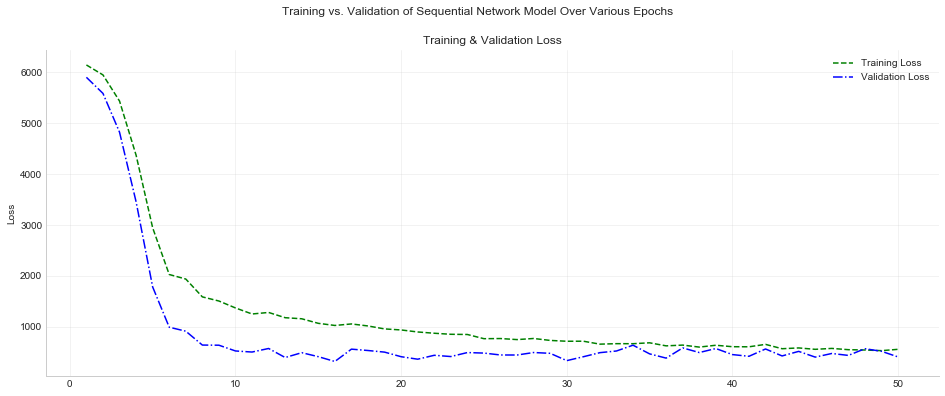

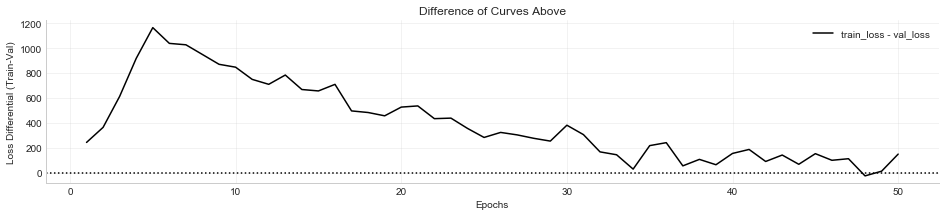


                Fully Connected Model - model 169 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 7
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.1122
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1551 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1552 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1075 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1553 (Dense)           (None, 12)                156       
_________________________________________

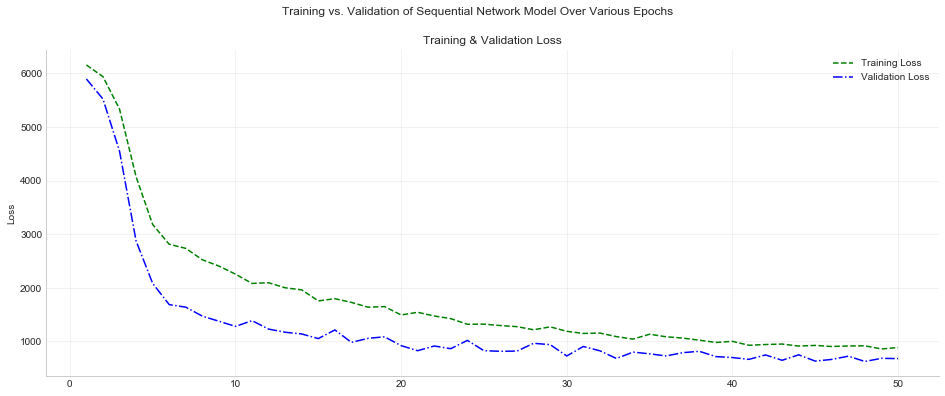

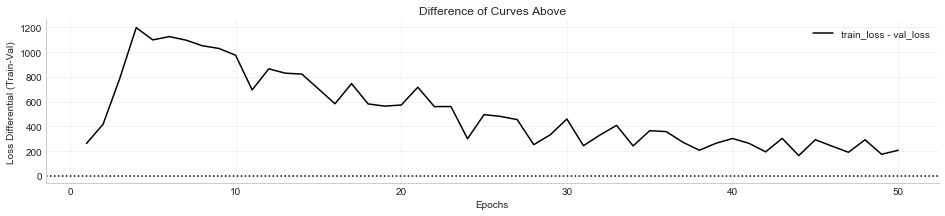


                Fully Connected Model - model 170 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 7
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.0099
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1560 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1561 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1082 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1562 (Dense)           (None, 12)                156       
________________________________________

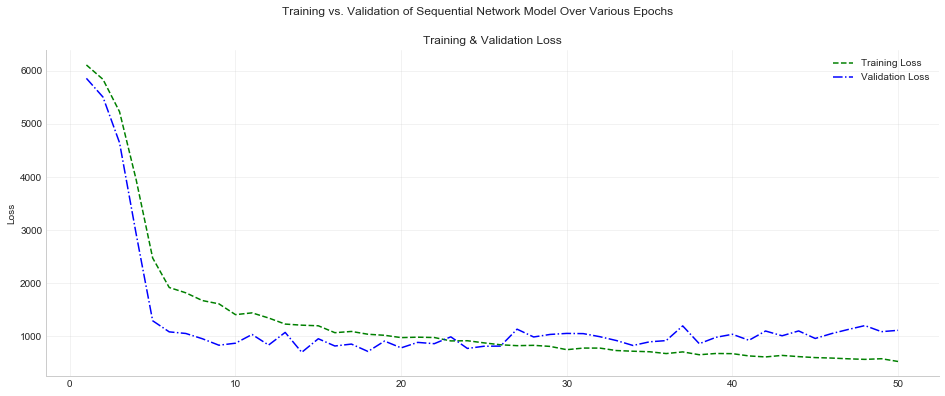

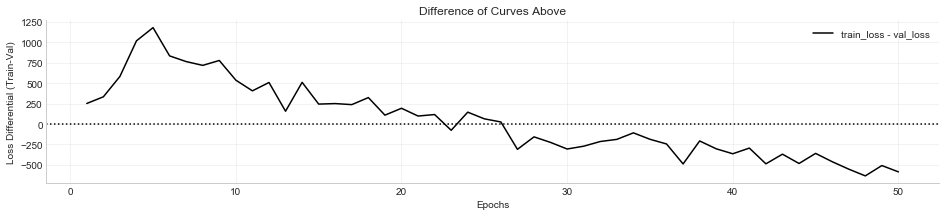


                Fully Connected Model - model 171 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 7
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.0145
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1569 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1570 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1089 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1571 (Dense)           (None, 12)                156       
________________________________________

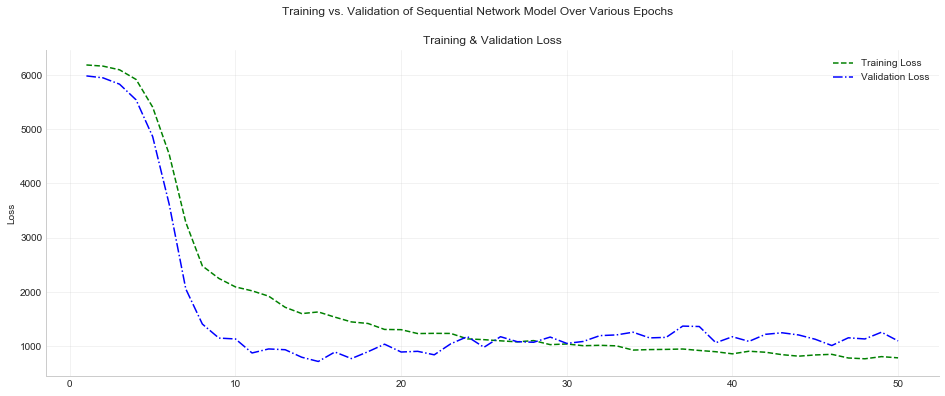

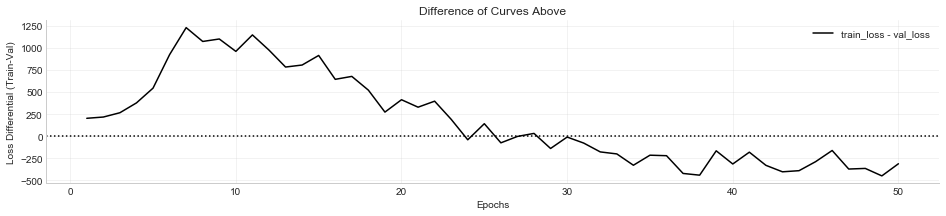


                Fully Connected Model - model 172 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 7
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.8451
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1578 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1579 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1096 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1580 (Dense)           (None, 12)                156       
________________________________________

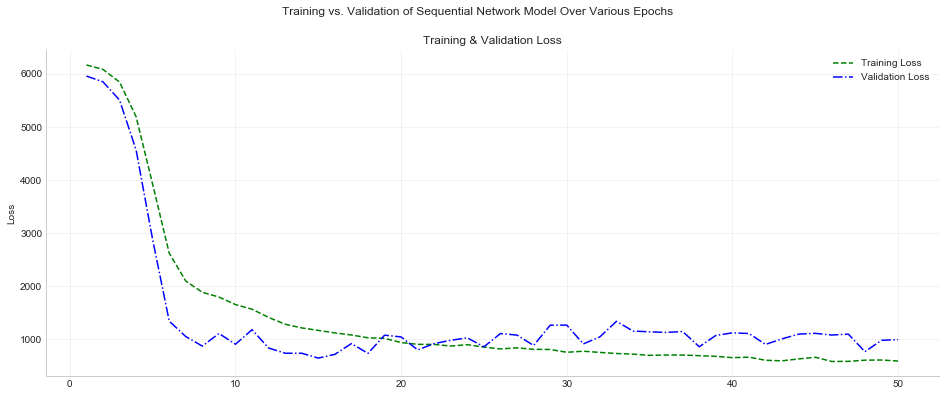

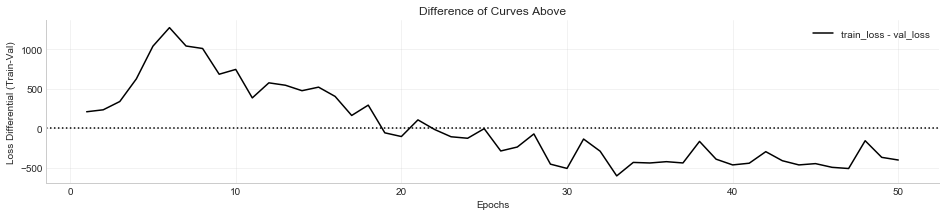


                Fully Connected Model - model 173 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 8
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.0005
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1587 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1588 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1103 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1589 (Dense)           (None, 12)                156       
________________________________________

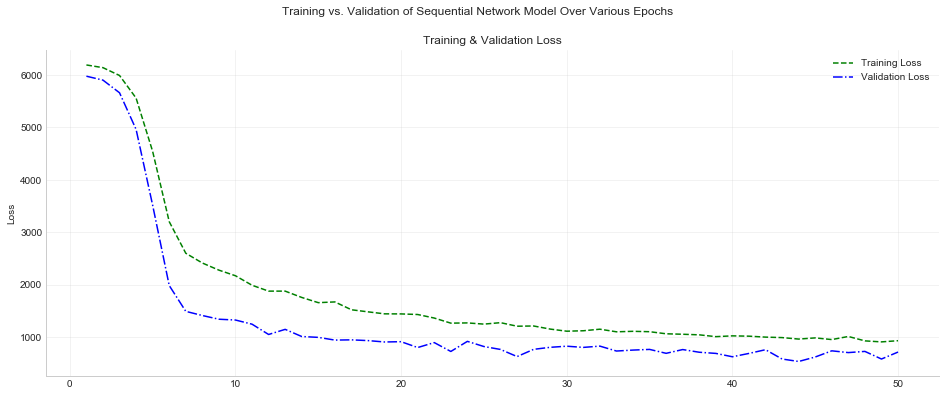

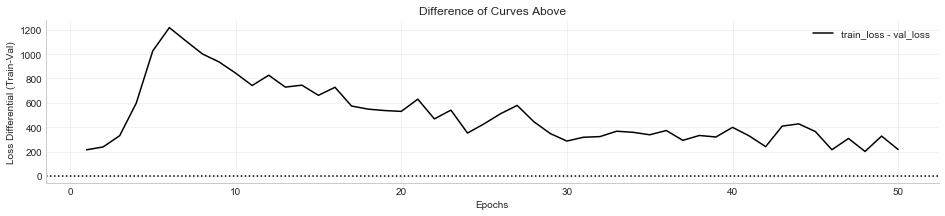


                Fully Connected Model - model 174 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 8
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.6168
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1597 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1598 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1111 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1599 (Dense)           (None, 12)                156       
________________________________________

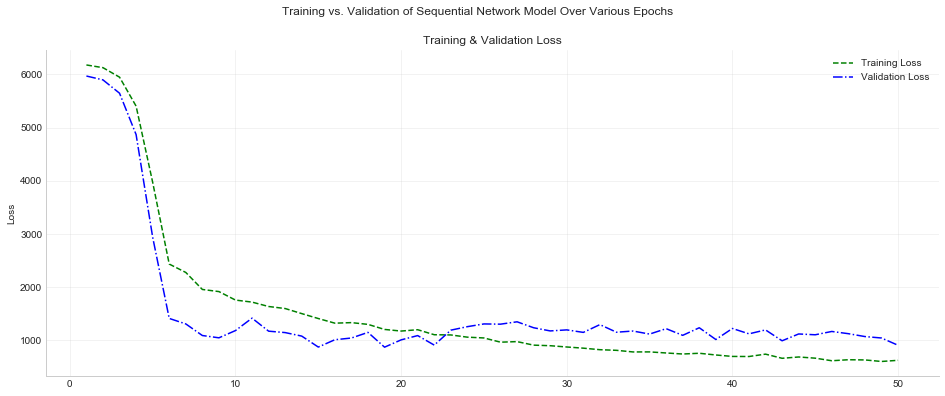

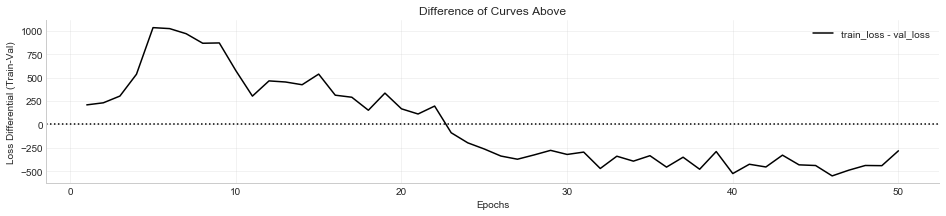


                Fully Connected Model - model 175 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 8
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.6655
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1607 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1608 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1119 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1609 (Dense)           (None, 12)                156       
________________________________________

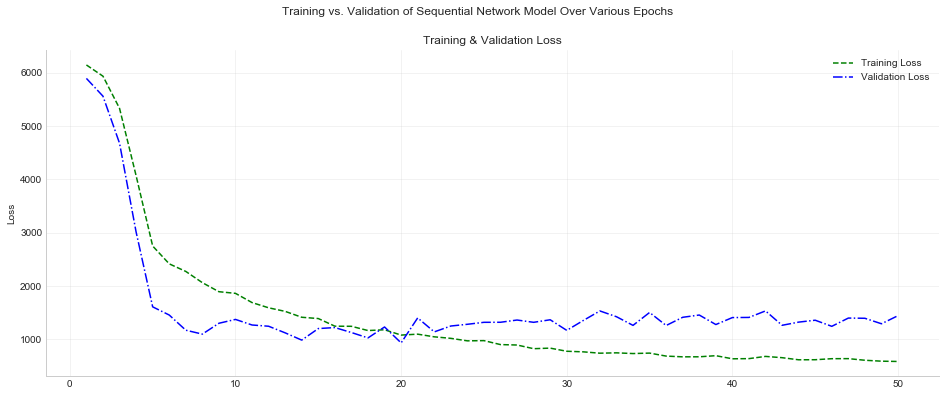

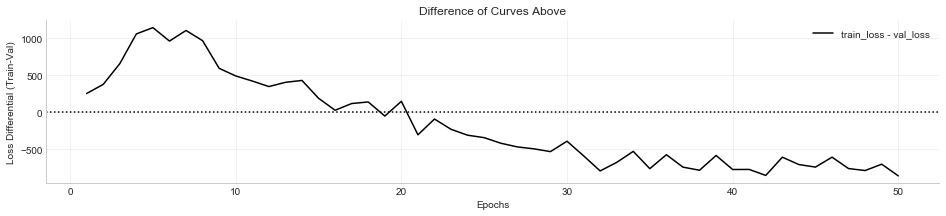


                Fully Connected Model - model 176 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 8
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = -1.0143
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1617 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1618 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1127 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1619 (Dense)           (None, 12)                156       
________________________________________

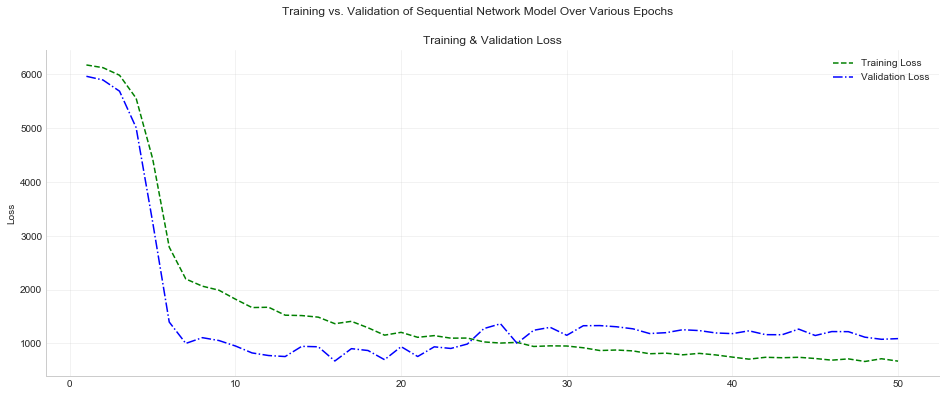

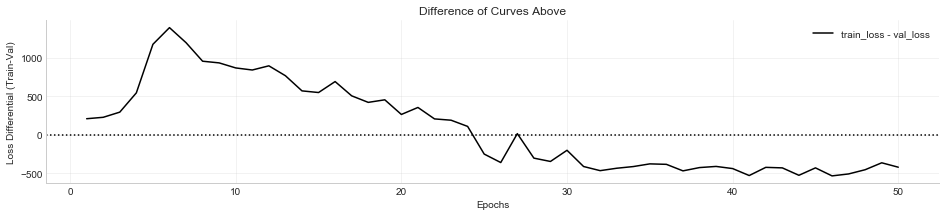


                Fully Connected Model - model 177 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 9
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.6935
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1627 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1628 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1135 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1629 (Dense)           (None, 12)                156       
________________________________________

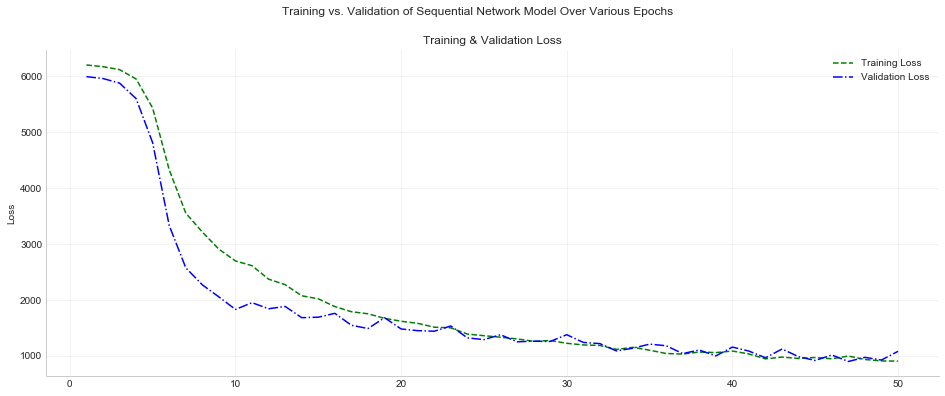

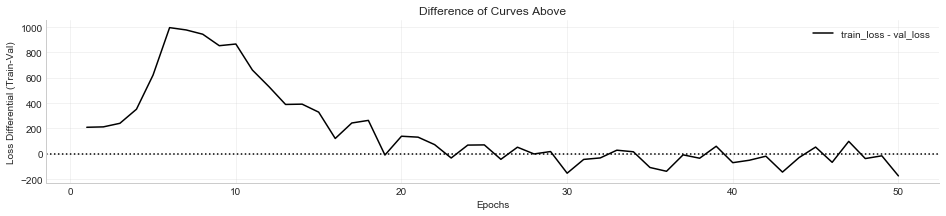


                Fully Connected Model - model 178 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 9
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.6737
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1638 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1639 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1144 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1640 (Dense)           (None, 12)                156       
________________________________________

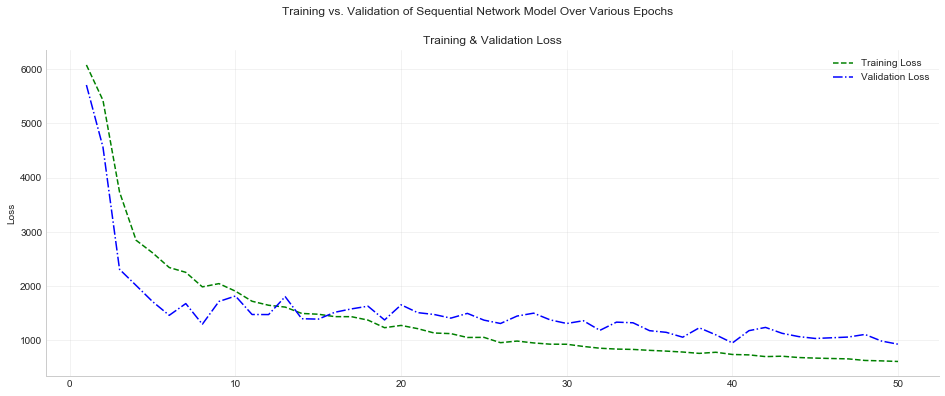

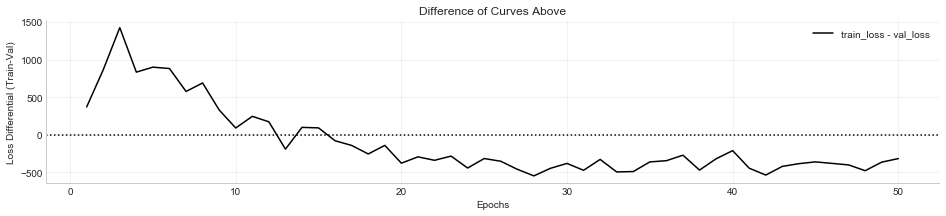


                Fully Connected Model - model 179 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 9
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = -2.0112
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1649 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1650 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1153 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1651 (Dense)           (None, 12)                156       
________________________________________

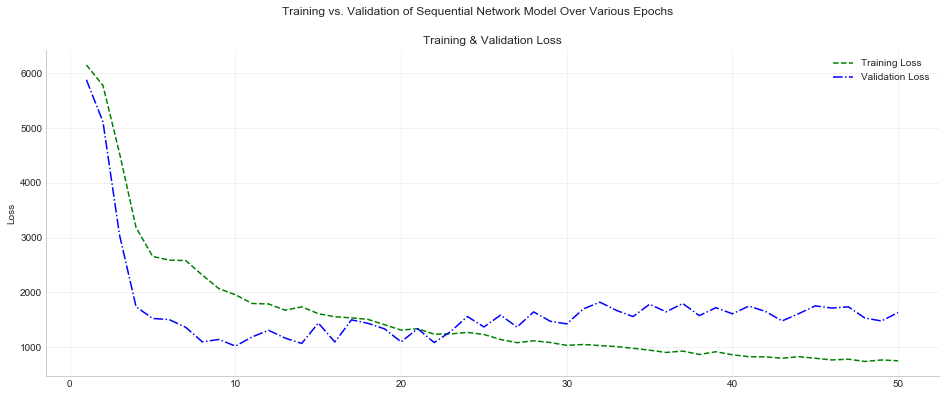

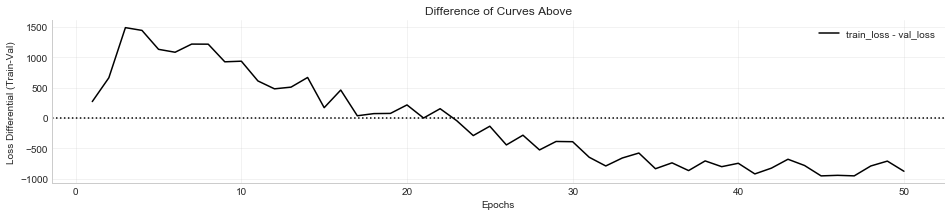


                Fully Connected Model - model 180 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 9
                 - Neurons per Layer:   12
                 

--------------------------------------------------------------------------------
R-squared on test data = -0.0825
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1660 (Dense)           (None, 12)                552       
_________________________________________________________________
dense_1661 (Dense)           (None, 12)                156       
_________________________________________________________________
dropout_1162 (Dropout)       (None, 12)                0         
_________________________________________________________________
dense_1662 (Dense)           (None, 12)                156       
________________________________________

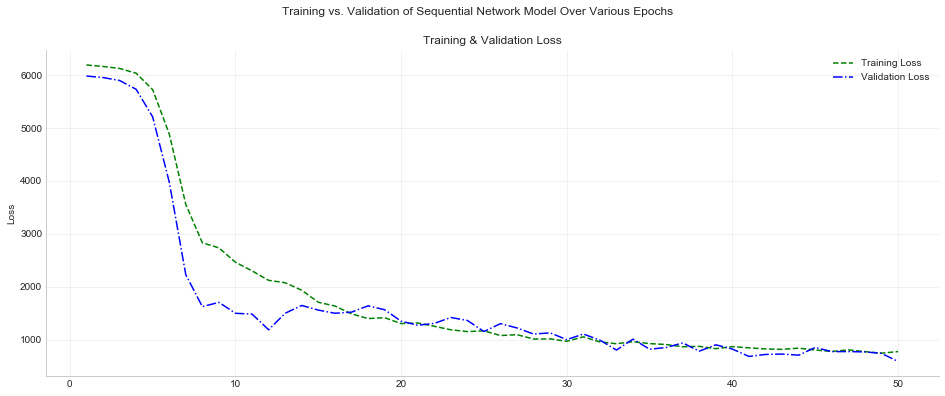

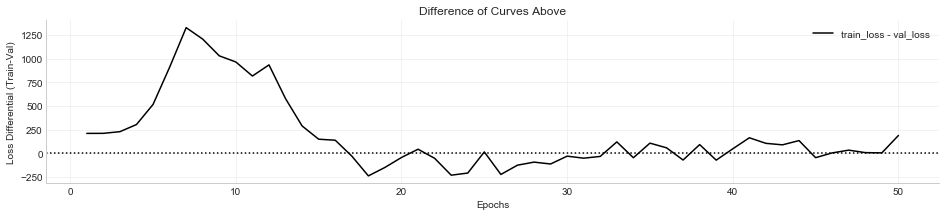


                Fully Connected Model - model 181 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 1
                 - Neurons per Layer:   14
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.9178
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1671 (Dense)           (None, 14)                644       
_________________________________________________________________
dense_1672 (Dense)           (None, 14)                210       
_________________________________________________________________
dropout_1171 (Dropout)       (None, 14)                0         
_________________________________________________________________
dense_1673 (Dense)           (None, 1)                 15        
Total params: 869
Trainable params: 869
N

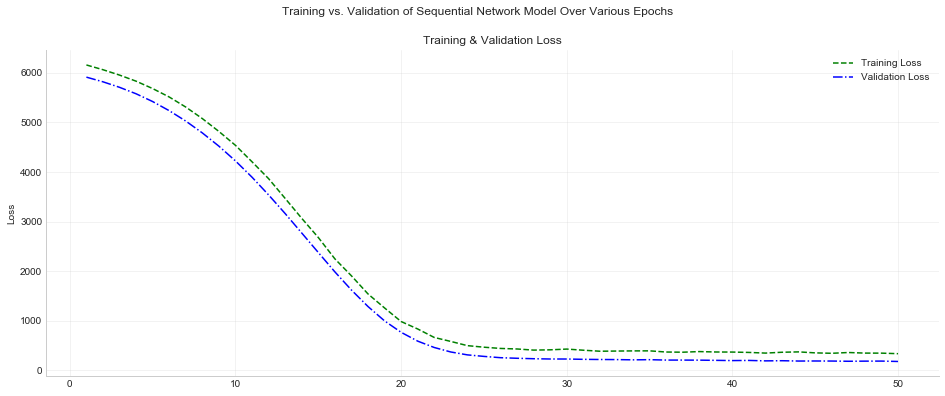

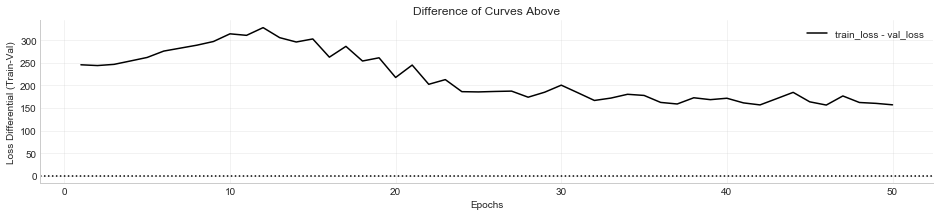


                Fully Connected Model - model 182 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 1
                 - Neurons per Layer:   14
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.9297
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1674 (Dense)           (None, 14)                644       
_________________________________________________________________
dense_1675 (Dense)           (None, 14)                210       
_________________________________________________________________
dropout_1172 (Dropout)       (None, 14)                0         
_________________________________________________________________
dense_1676 (Dense)           (None, 1)                 15        
Total params: 869
Trainable params: 869
N

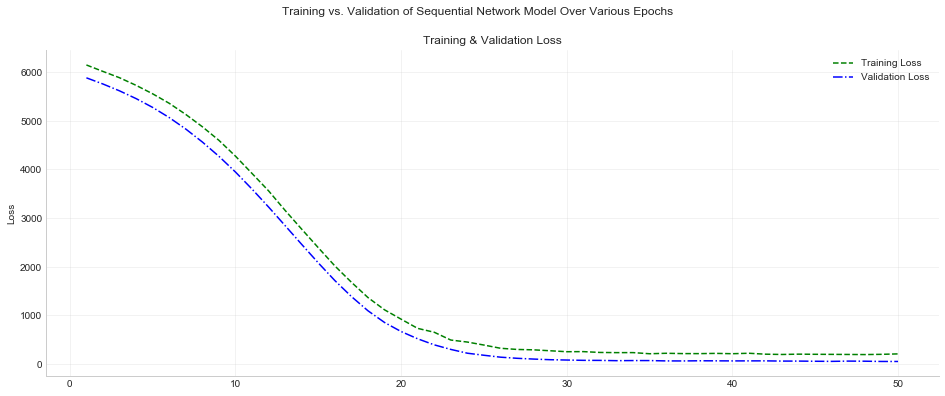

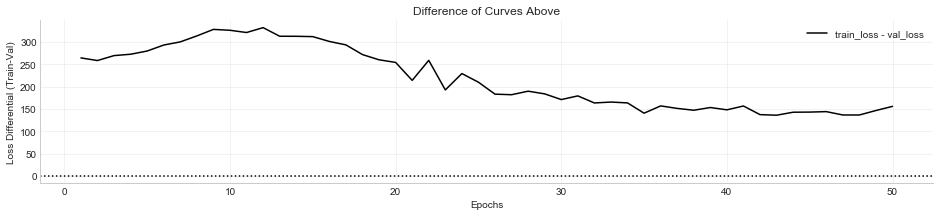


                Fully Connected Model - model 183 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 1
                 - Neurons per Layer:   14
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.8983
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1677 (Dense)           (None, 14)                644       
_________________________________________________________________
dense_1678 (Dense)           (None, 14)                210       
_________________________________________________________________
dropout_1173 (Dropout)       (None, 14)                0         
_________________________________________________________________
dense_1679 (Dense)           (None, 1)                 15        
Total params: 869
Trainable params: 869
N

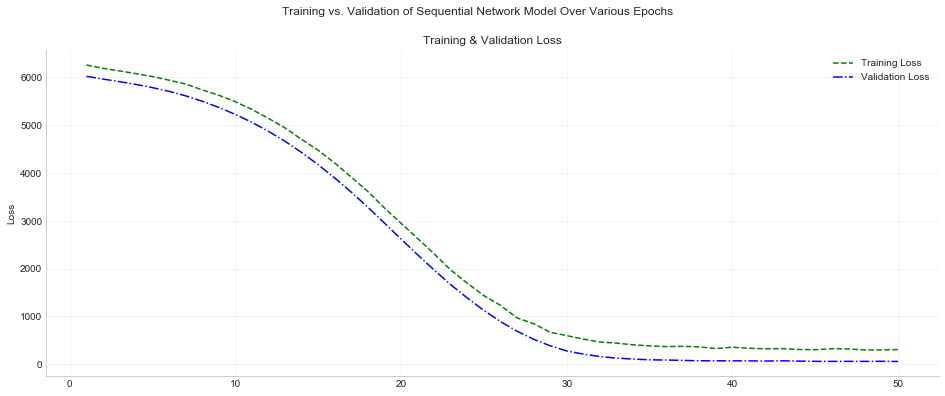

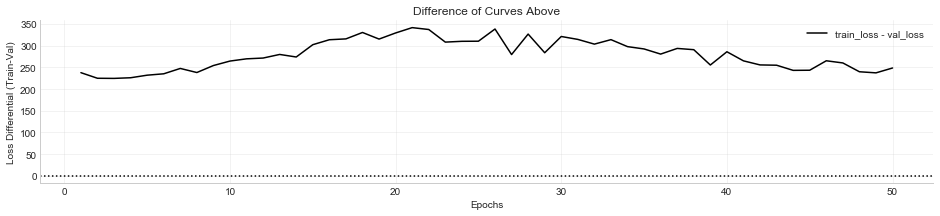


                Fully Connected Model - model 184 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 1
                 - Neurons per Layer:   14
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.9124
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1680 (Dense)           (None, 14)                644       
_________________________________________________________________
dense_1681 (Dense)           (None, 14)                210       
_________________________________________________________________
dropout_1174 (Dropout)       (None, 14)                0         
_________________________________________________________________
dense_1682 (Dense)           (None, 1)                 15        
Total params: 869
Trainable params: 869
N

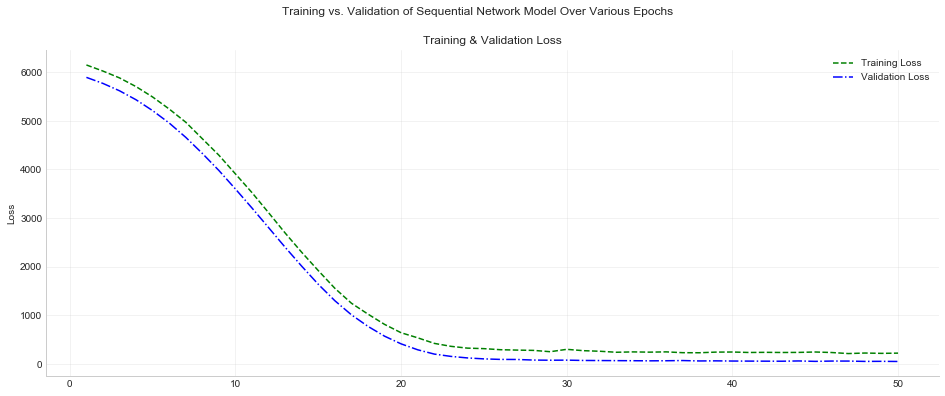

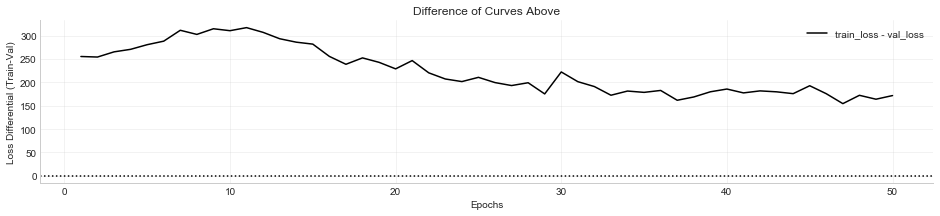


                Fully Connected Model - model 185 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 2
                 - Neurons per Layer:   14
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.9244
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1683 (Dense)           (None, 14)                644       
_________________________________________________________________
dense_1684 (Dense)           (None, 14)                210       
_________________________________________________________________
dropout_1175 (Dropout)       (None, 14)                0         
_________________________________________________________________
dense_1685 (Dense)           (None, 14)                210       
_________________________________________

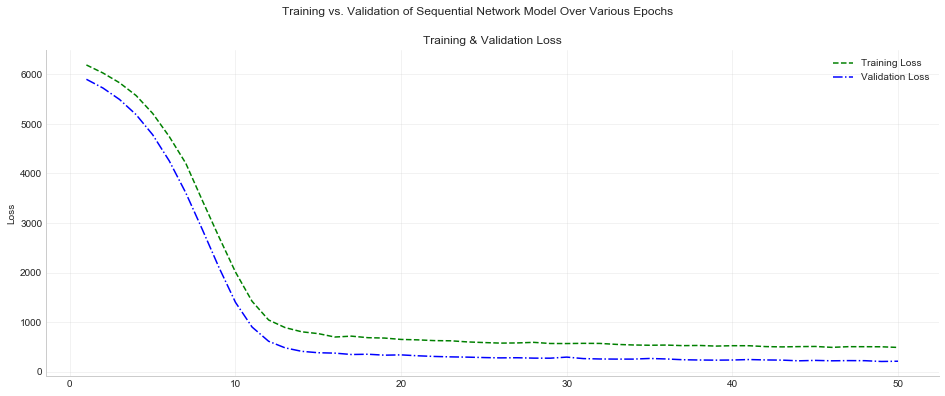

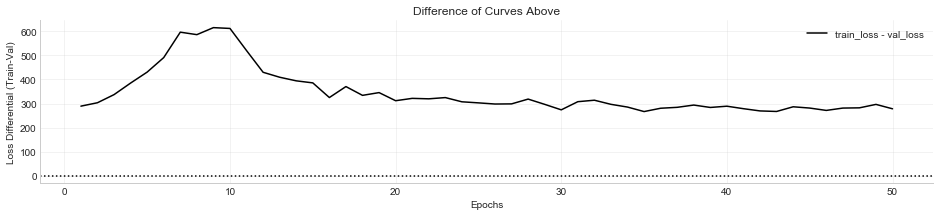


                Fully Connected Model - model 186 
                 - Regularizer Rate:    0.0010000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 2
                 - Neurons per Layer:   14
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.9151
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1687 (Dense)           (None, 14)                644       
_________________________________________________________________
dense_1688 (Dense)           (None, 14)                210       
_________________________________________________________________
dropout_1177 (Dropout)       (None, 14)                0         
_________________________________________________________________
dense_1689 (Dense)           (None, 14)                210       
_________________________________________

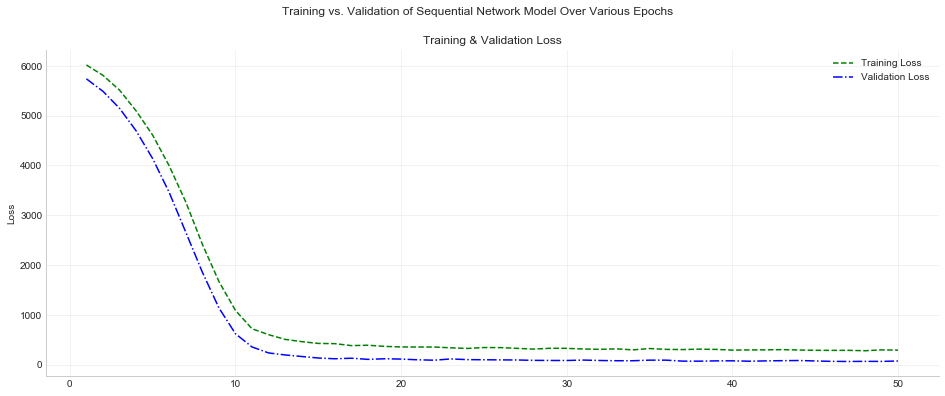

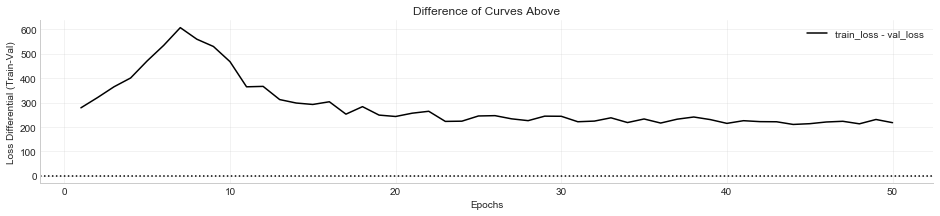


                Fully Connected Model - model 187 
                 - Regularizer Rate:    0.0001000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 2
                 - Neurons per Layer:   14
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.9192
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1691 (Dense)           (None, 14)                644       
_________________________________________________________________
dense_1692 (Dense)           (None, 14)                210       
_________________________________________________________________
dropout_1179 (Dropout)       (None, 14)                0         
_________________________________________________________________
dense_1693 (Dense)           (None, 14)                210       
_________________________________________

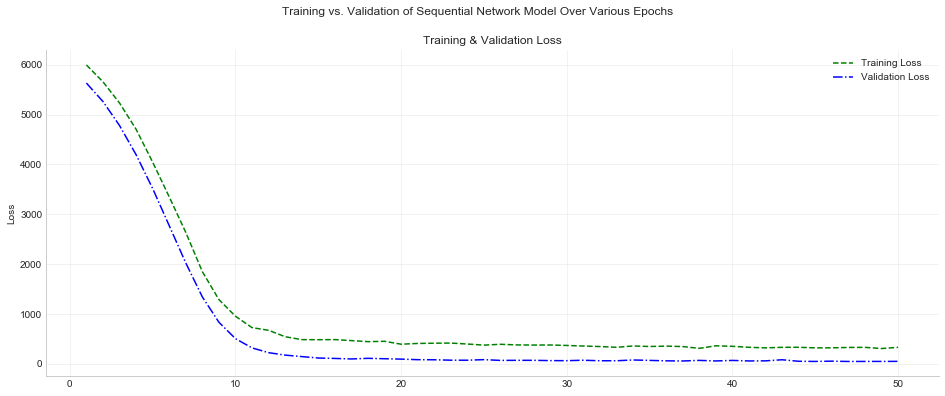

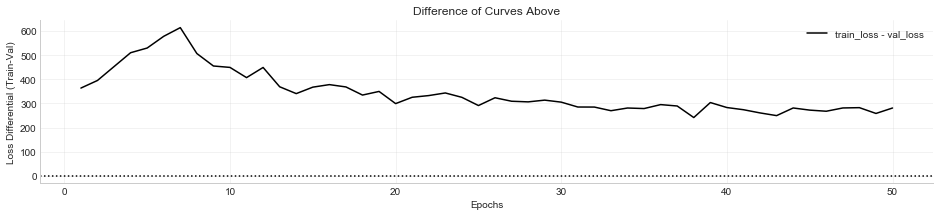


                Fully Connected Model - model 188 
                 - Regularizer Rate:    0.0000100
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 2
                 - Neurons per Layer:   14
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.9010
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1695 (Dense)           (None, 14)                644       
_________________________________________________________________
dense_1696 (Dense)           (None, 14)                210       
_________________________________________________________________
dropout_1181 (Dropout)       (None, 14)                0         
_________________________________________________________________
dense_1697 (Dense)           (None, 14)                210       
_________________________________________

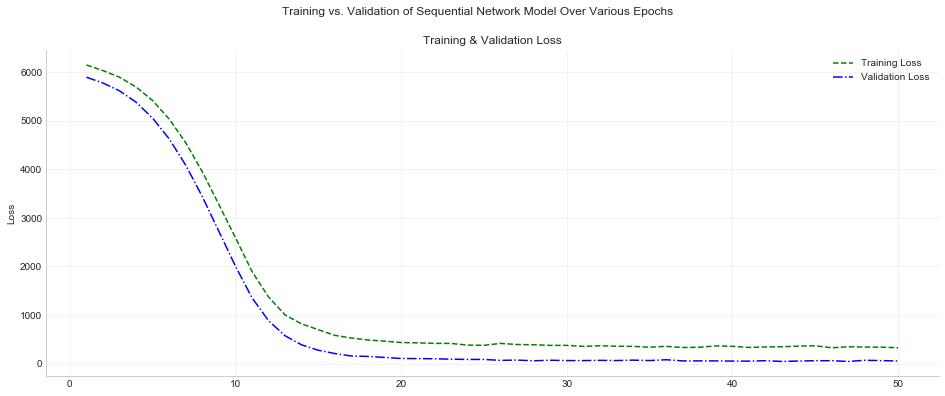

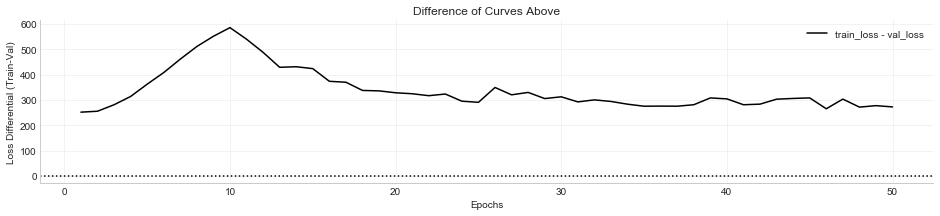


                Fully Connected Model - model 189 
                 - Regularizer Rate:    0.0100000
                 - Dropout Rate:        0.200
                 - Number Dense Layers: 3
                 - Neurons per Layer:   14
                 

--------------------------------------------------------------------------------
R-squared on test data = 0.7870
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1699 (Dense)           (None, 14)                644       
_________________________________________________________________
dense_1700 (Dense)           (None, 14)                210       
_________________________________________________________________
dropout_1183 (Dropout)       (None, 14)                0         
_________________________________________________________________
dense_1701 (Dense)           (None, 14)                210       
_________________________________________

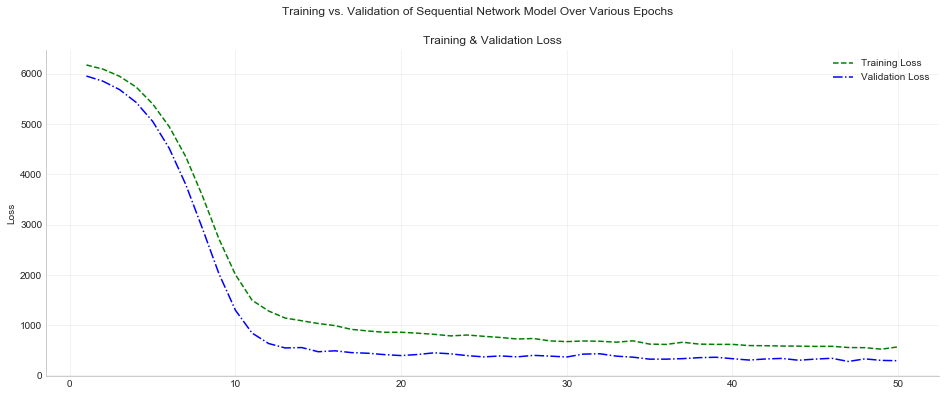

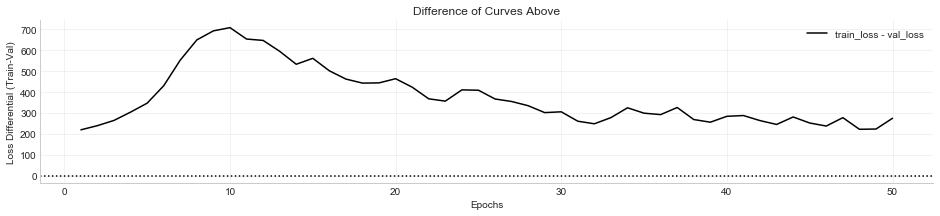

In [ ]:
from keras.models import *
from keras.layers import *
from keras.regularizers import *
from sklearn.metrics import r2_score

def simple_feedforward_model(num_neurons, num_dense_layers, reg=.001,
                            loss='mse',
                            activation='relu', optimizer='rmsprop',
                            metrics=None, dropout=.5, verbose=0):
    model = Sequential()
    model.add(Dense(num_neurons, activation=activation, 
                    input_shape=(X_train.shape[1], ),
                    kernel_regularizer=l2(reg),
                    activity_regularizer=l1(reg)))

    for lyr in range(num_dense_layers):
        model.add(Dense(num_neurons, 
                        activation=activation,
                        kernel_regularizer=l2(reg),
                        activity_regularizer=l1(reg)))
        model.add(Dropout(dropout))

    model.add(Dense(1))

    if verbose: model.summary()

    model.compile(optimizer=optimizer, 
                 loss=loss,
                 metrics=metrics)
    
    return model

# instantiate model & run
epochs = 50
batch_size = 128
verbose = 0

dropout_rates = [.2, .4, .6, .8]
n_units_per_layer = np.arange(4, 32, 2)
n_dense_layers = np.arange(1, 10, 1)
regularizer_range = [.01, .001, .0001]

model_dict = dict()
model_number = 1
for dropout in dropout_rates:
    for units in n_units_per_layer:
        for layers in n_dense_layers:
            for reg in regularizer_range:
                model = simple_feedforward_model(units, layers, reg, dropout=dropout)

                history = model.fit(X_train, y_train,
                                   epochs=epochs,
                                   batch_size=batch_size,
                                   verbose=verbose,
                                   validation_data=(X_test, y_test))

                pred = model.predict(X_test)
                _r2 = r2_score(y_test, pred)
                
                model_name = '''
                Fully Connected Model - model %i 
                 - Regularizer Rate:    %.7f
                 - Dropout Rate:        %.3f
                 - Number Dense Layers: %i
                 - Neurons per Layer:   %i
                '''%(model_number, reg, dropout, layers, units)
                print(model_name, '\n')
                print('-'*80)
                print('R-squared on test data = %.4f' % _r2)
                
                model_id = str(reg)+'_'+str(dropout)+'_'+str(layers)+'_'+str(units)
                model_dict[model_id] = {'model_number': model_number,
                                       'model_id': model_name,
                                       'model': model,
                                       'r2_test': _r2, 
                                       'history': history,
                                       'units': units,
                                       'layers': layers,
                                       'epochs': epochs,
                                       'dropout': dropout,
                                       'regularizer': reg}
                model.summary()
                plot_loss(history.history)
                
                model_number += 1

In [ ]:
models_dict

In [ ]:
import tensorflow as tf

dim = X_train.shape[1]
n_layers = 5

with tf.name_scope('placeholders'):
    X = tf.placeholder(tf.float32, (None, dim))
    y = tf.placeholder(tf.float32, (None, ))
    
with tf.name_scope('hidden_layer'):
    W = tf.Variable(tf.random_normal((dim, n_layers)))
    b = tf.Variable(tf.random_normal((n_layers, )))
    X_hidden = tf.nn.relu(tf.matmul(X, W) + b)
    
with tf.name_scope('output'):
    W = tf.Variable(tf.random_normal((n_layers, 1)))
    y_hat = tf.matmul(X_hidden, W) + b
    

In [70]:
fname = './data/smooth_df_'+str(window)+'_mean.csv'
smooth_df.to_csv(fname)